

```
# This is formatted as code
```

# MOUNT DRIVE #

In [ ]:
# Mount the Google Drive to the Google Colab notebook
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
from google.colab import auth
auth.authenticate_user()
!pip install pingouin
import math
import time
import os
import sys
import glob
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import re
# run this to import & update modules when you make changes in the utils.ipynb
def load_helper_funcs():
  %run '/content/drive/MyDrive/Colab Notebooks/Geoff/Schooling/schooling_helper_funcs_SE.ipynb'
load_helper_funcs()

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.0/204.0 kB 12.9 MB/s eta 0:00:00


# LOAD METADATA #

In [ ]:
#behav_path = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Pseudo_school/Data/'+experiment_class+'/'
analysis_path = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Schooling/Analysis/'
data_path = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Schooling/Data/'
figure_savepath = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Schooling/Figures'
## Load metadata
gsheet = "https://docs.google.com/spreadsheets/d/1NHds-KPlUZAwxtoblVUF9KMm0WbN_mpkX9rRjry00xQ/edit?gid=2012439636#gid=2012439636"
tab_name = '6wks'
metadata = read_metadata(gsheet,tab_name)
experiments = metadata.index

#Create save directory for analysis
exp_dates = metadata['experiment_date'].tolist()
save_paths = [analysis_path + str(exp_date) for exp_date in exp_dates]
metadata['save_path'] = save_paths
exps=metadata.index
#Add raw data path
data_paths = [data_path + str(exp_date)+'/'+str(exp) for exp_date,exp in zip(exp_dates,exps)]
metadata['raw_data_path'] = data_paths
#Add timestamp path
TimeStamps=metadata['time_stamps'].tolist()
time_stamp_paths = [data_path + str(exp_date)+'/'+str(time) for exp_date,time in zip(exp_dates,TimeStamps)]
metadata['time_stamp_path'] = time_stamp_paths
#Add group_id
metadata['experiment_id'] = metadata['exp_type'].astype(str)+ "_"+ metadata['bio_rep'].astype(str) + "_" + metadata['experiment_date'].astype(str)

#display(metadata)
display(metadata)
for exp_date in np.unique(metadata['save_path']):
  os.makedirs(exp_date, exist_ok=True)

,experiment,time_stamps,fish_num,exp_type,bio_rep,tech_rep,fish_cohort,fps_Hz,rig_mm,vid_px,body_length,experiment_date
0,vid_3_b_sub.avi.000_vid_3_b_sub.analysis.h5,timestamp_3.csv,4,iso,Iso1,2,R,120,350,1000,8,31326
1,vid_0_b_sub.avi.000_vid_0_b_sub.analysis.h5,timestamp_0.csv,4,group_raised,GR1,1,R3,120,350,1000,8,31326
2,vid_2_b_sub.avi.000_vid_2_b_sub.analysis.h5,timestamp_2.csv,4,group_raised,GR1,2,R3,120,350,1000,8,31326
3,vid_1_b_sub.avi.000_vid_1_b_sub.analysis.h5,timestamp_1.csv,4,iso,Iso1,1,R,120,350,1000,8,31326
4,vid_0_b_sub.avi.000_vid_0_b_sub.analysis.h5,timestamp_0.csv,4,all_on_vert,AOV1,1,R,120,350,1000,8,30126
5,vid_5_b_sub.avi.000_vid_5_b_sub.analysis.h5,timestamp_5.csv,4,all_on_vert,AOV3,2,R,120,350,1000,8,30126
6,vid_1_b_sub.avi.000_vid_1_b_sub.analysis.h5,timestamp_1.csv,4,all_on_vert,AOV2,1,R,120,350,1000,8,30126
7,vid_2_b_sub.avi.000_vid_2_b_sub.analysis.h5,timestamp_2.csv,4,all_on_vert,AOV3,1,R,120,350,1000,8,30126
8,vid_3_b_sub.avi.000_vid_3_b_sub.analysis.h5,timestamp_3.csv,4,all_on_vert,AOV1,2,R,120,350,1000,8,30126
9,vid_4_b_sub.avi.000_vid_4_b_sub.analysis.h5,timestamp_4.csv,4,all_on_vert,AOV2,2,R,120,350,1000,8,30126


,time_stamps,fish_num,exp_type,bio_rep,tech_rep,fish_cohort,fps_Hz,rig_mm,vid_px,body_length,experiment_date,save_path,raw_data_path,time_stamp_path,experiment_id
experiment,,,,,,,,,,,,,,,
vid_3_b_sub.avi.000_vid_3_b_sub.analysis.h5,timestamp_3.csv,4,iso,Iso1,2,R,120,350,1000,8,31326,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,iso_Iso1_31326
vid_0_b_sub.avi.000_vid_0_b_sub.analysis.h5,timestamp_0.csv,4,group_raised,GR1,1,R3,120,350,1000,8,31326,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,group_raised_GR1_31326
vid_2_b_sub.avi.000_vid_2_b_sub.analysis.h5,timestamp_2.csv,4,group_raised,GR1,2,R3,120,350,1000,8,31326,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,group_raised_GR1_31326
vid_1_b_sub.avi.000_vid_1_b_sub.analysis.h5,timestamp_1.csv,4,iso,Iso1,1,R,120,350,1000,8,31326,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,iso_Iso1_31326
vid_0_b_sub.avi.000_vid_0_b_sub.analysis.h5,timestamp_0.csv,4,all_on_vert,AOV1,1,R,120,350,1000,8,30126,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,all_on_vert_AOV1_30126
vid_5_b_sub.avi.000_vid_5_b_sub.analysis.h5,timestamp_5.csv,4,all_on_vert,AOV3,2,R,120,350,1000,8,30126,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,all_on_vert_AOV3_30126
vid_1_b_sub.avi.000_vid_1_b_sub.analysis.h5,timestamp_1.csv,4,all_on_vert,AOV2,1,R,120,350,1000,8,30126,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,all_on_vert_AOV2_30126
vid_2_b_sub.avi.000_vid_2_b_sub.analysis.h5,timestamp_2.csv,4,all_on_vert,AOV3,1,R,120,350,1000,8,30126,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,all_on_vert_AOV3_30126
vid_3_b_sub.avi.000_vid_3_b_sub.analysis.h5,timestamp_3.csv,4,all_on_vert,AOV1,2,R,120,350,1000,8,30126,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,all_on_vert_AOV1_30126


# PROCESS DATA #

In [ ]:
load_helper_funcs()
sleap_nodes = ['le','re','fb','mb','rb','t1','t2','t3','tt']

processed_data_paths =[]
processed_data_paths_neighbors=[]
save=True
for i in range(0,len(metadata)):
  exp=metadata.index[i]
  data_path=metadata['raw_data_path'].iloc[i]
  time_stamp_path=metadata['time_stamp_path'].iloc[i]
  save_path=metadata['save_path'].iloc[i]
  saveCheck = save_path+'/' + exp + '/' + exp + '_' + 'lev0_basics' +'.npz'

  # check whether data has already been processed
  if os.path.isfile(saveCheck) == True:
    #make folder for each recording
    print(f"{str(exp)} has already been processed. Skipping ")
    processed_data_path=save_npz_geoff(save_path,exp,'lev0_basics',[],save=False)
    processed_data_paths.append(processed_data_path)

    processed_data_path_adv = save_npz_geoff(save_path,exp,'lev0_neighbor_stats',[],save=False)
    processed_data_paths_neighbors.append(processed_data_path_adv)
    continue
  else:
    print(f"{str(exp)} has not been processed. Processing...")

  # load metadata
  exp_type = metadata['exp_type'].iloc[i]
  fish_num = metadata['fish_num'].iloc[i]
  fps_Hz = metadata['fps_Hz'].iloc[i]
  rig_mm = metadata['rig_mm'].iloc[i]
  vid_px = metadata['vid_px'].iloc[i]
  scale = rig_mm / vid_px # mm/pixel

  # load the h5
  h5_obj = h5py.File(data_path, "r")

  h5tracks = h5_obj['tracks'][:].T
  frame_num, _, _, track_num = h5tracks.shape
  print("frames x nodes x 2 x animals", h5tracks.shape)

  # load data from h5 tracks
  fish_data = process_h5(h5tracks,fish_num,sleap_nodes,exp)

  # get time stamps
  time_stamps_df = pd.read_csv(time_stamp_path)
  time_stamps_df.columns = ['time_stamps']
  time_stamps_df['time_stamps'] = pd.to_datetime(time_stamps_df['time_stamps'], errors='coerce')
  time_stamps_df['elapsed_seconds'] = (time_stamps_df['time_stamps'] - time_stamps_df['time_stamps'].iloc[0]).dt.total_seconds()
  time_stamps = time_stamps_df
  print(frame_num,len(time_stamps_df))
  # time_stamps = getTimeStamps(time_stamp_path)

  # #plot all trajectories
  for i in fish_data:
    byx = i.__getattribute__('mbx')
    byy = i.__getattribute__('mby')
    plt.scatter(byx,byy, s=3, alpha=0.1)

  # # organize them into group arrays and save as lev0_basics.npz
  f_bodylength_px, f_bodylength_mm, f_nosex, f_nosey, f_x, f_y, f_tailx, f_taily, f_heading, f_tail_angle, f_speed, f_ang_speed, f_disp_heading, f_lex, f_ley, f_rex, f_rey = group_arrays(fish_data,fish_num,frame_num,fps_Hz,scale)


  savinglist = {'exp_type':exp_type,'fish_num':fish_num,'scale':scale,'fps':fps_Hz,\
              'time_stamps':time_stamps['elapsed_seconds'],'time_stamps_raw':time_stamps['time_stamps'],\
              'f_bodylength_mm':f_bodylength_mm,'f_bodylength_px':f_bodylength_px,'f_nosex':f_nosex,'f_nosey':f_nosey,\
              'f_x':f_x,'f_y':f_y,'f_tailx':f_tailx,'f_taily':f_taily, \
              'f_disp_heading': f_disp_heading, 'f_lex':f_lex, 'f_ley':f_ley, 'f_rex':f_rex, 'f_rey':f_rey, \
              'f_heading':f_heading,'f_tail_angle':f_tail_angle,'f_speed':f_speed,'f_ang_speed':f_ang_speed}

              # 'rigx_min':rigx_min, 'rigx_max':rigx_max, 'rigy_min':rigy_min, 'rigy_max':rigy_max, 'fish_ate':fish_ate}
  processed_data_path=save_npz_geoff(save_path,exp,'lev0_basics',savinglist,save=save)
  processed_data_paths.append(processed_data_path)



  # calculate distance and alignment with neighbors - save as lev0_neighbor_stats.npz
  ff_dist, ff_align, f_IID, f_IIA, f_closest_id, f_closest_dist, f_closest_align, f_closest_heading, f_closest_speed = analyze_neighbors(fish_num,f_heading,f_x,f_y,frame_num,scale,f_bodylength_px)
  group_area = 0#fish_polygon_area(f_x,f_y)
  savinglist = {'group_area':group_area,'ff_dist':ff_dist,'ff_align':ff_align,'f_IID':f_IID,'f_IIA':f_IIA,\
                'f_closest':f_closest_id,'f_closest_dist':f_closest_dist,'f_closest_align':f_closest_align,\
                'f_closest_heading':f_closest_heading,'f_closest_speed':f_closest_speed}
  processed_data_path_adv=save_npz_geoff(save_path,exp,'lev0_neighbor_stats',savinglist)
  processed_data_paths_neighbors.append(processed_data_path_adv)

#update metadata file
metadata['processed_data_path_basic'] = processed_data_paths
metadata['processed_data_path_neighbor'] = processed_data_paths_neighbors


vid_3_b_sub.avi.000_vid_3_b_sub.analysis.h5 has already been processed. Skipping 
vid_0_b_sub.avi.000_vid_0_b_sub.analysis.h5 has already been processed. Skipping 
vid_2_b_sub.avi.000_vid_2_b_sub.analysis.h5 has already been processed. Skipping 
vid_1_b_sub.avi.000_vid_1_b_sub.analysis.h5 has already been processed. Skipping 
vid_0_b_sub.avi.000_vid_0_b_sub.analysis.h5 has already been processed. Skipping 
vid_5_b_sub.avi.000_vid_5_b_sub.analysis.h5 has already been processed. Skipping 
vid_1_b_sub.avi.000_vid_1_b_sub.analysis.h5 has already been processed. Skipping 
vid_2_b_sub.avi.000_vid_2_b_sub.analysis.h5 has already been processed. Skipping 
vid_3_b_sub.avi.000_vid_3_b_sub.analysis.h5 has already been processed. Skipping 
vid_4_b_sub.avi.000_vid_4_b_sub.analysis.h5 has already been processed. Skipping 
vid_5_b_sub.avi.000_vid_5_b_sub.analysis.h5 has already been processed. Skipping 
vid_0_b_sub.avi.000_vid_0_b_sub.analysis.h5 has already been processed. Skipping 
vid_4_b_sub.avi.

In [ ]:
# prompt: save metadata variable as a google sheet in the current directory of the metadata file
ID=extract_between_d_and_edit(gsheet)
updateMetadata(ID)

Metadata saved to Google Sheet: metadata_imprinting


/tmp/ipykernel_22036/1011766653.py:42: DeprecationWarning: The order of arguments in worksheet.update() has changed. Please pass values first and range_name secondor used named arguments (range_name=, values=)
  worksheet.update('A1', metadata_list)



# ANALYZE DATA #

In [ ]:
# Lets make a fun color palatte
imprinting_color_pal = {'group_raised':'#A8AAAD',
                        'iso':'#DBBAD9' ,
                        'all_on_horz':'#EDCC8B',
                        'all_on_vert':'#A26360'}

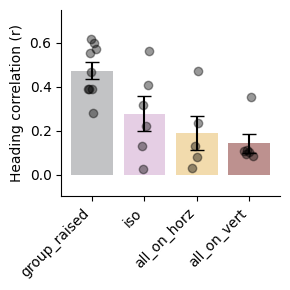

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg

#SAVE_FIG = True
Fig_Name = 'circular_heading_corr.svg'

load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
results = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    tech_rep = metadata['tech_rep'].iloc[i]
    if tech_rep !=1:
      continue
    data = np.load(data_path, allow_pickle=True)

    fish_num = data['fish_num']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    if EllapsedTime[-1]<TimeThresh:
      continue
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]
    date = metadata['experiment_date'].iloc[i]
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = np.argmin(np.abs(EllapsedTime - AnalysisLength))
    end_idx = np.argmin(np.abs(EllapsedTime - TimeThresh))

    # Convert angles to -180..180
    ff_heading = pg.convert_angles(ff_heading, low=-180, high=180, positive=False)
    headings = ff_heading[:, start_idx:end_idx]

    # Initialize correlation matrices
    correlation_matrix = np.full((fish_num, fish_num), np.nan)
    correlation_matrix_linear = np.full((fish_num, fish_num), np.nan)

    # Compute pairwise circular + linear correlations
    for ii in range(fish_num):
        for j in range(ii + 1, fish_num):
            # Circular correlation
            r, pval = pg.circ_corrcc(headings[ii, :], headings[j, :])
            correlation_matrix[ii, j] = correlation_matrix[j, ii] = r

            # Linear correlation
            r_linear = np.corrcoef(headings[ii, :], headings[j, :])[1, 0]
            correlation_matrix_linear[ii, j] = correlation_matrix_linear[j, ii] = r_linear

    # Average off-diagonal elements
    off_diag_circ = correlation_matrix[np.triu_indices_from(correlation_matrix, k=1)]
    off_diag_lin = correlation_matrix_linear[np.triu_indices_from(correlation_matrix_linear, k=1)]

    results.append({
        'condition': condition,
        'experiment_date':date,
        'average_correlation': np.nanmean(off_diag_circ),
        'average_correlation_linear': np.nanmean(off_diag_lin),
        'exp_id': exp_id
    })

# Create dataframe
heading_df = pd.DataFrame(results)

# Group by experiment ID
heading_df = heading_df.groupby(['exp_id', 'condition'], as_index=False).mean(numeric_only=True)

# Set order of conditions
condition_order = heading_df['condition'].unique().tolist()
heading_df['condition'] = pd.Categorical(
    heading_df['condition'], categories=condition_order, ordered=True
)
condition_order = ['group_raised', 'iso','all_on_horz', 'all_on_vert']
# --- PLOT ---
conditions = heading_df['condition'].astype(str).unique()
colors = sns.color_palette("inferno", len(conditions))
fig, ax = plt.subplots(figsize=(3, 3))

for i, con in enumerate(condition_order):
    subset = heading_df[heading_df['condition'] == con]
    mean_val = subset['average_correlation'].mean()
    sem_val = subset['average_correlation'].sem()

    ax.bar(i, mean_val, yerr=sem_val, color=imprinting_color_pal[con], alpha=0.7, capsize=5)

    # Jittered individual points
    jitter = np.random.uniform(-0.1, 0.1, size=len(subset))
    ax.scatter(np.full(len(subset), i) + jitter, subset['average_correlation'],
               color='black', alpha=0.4, zorder=10)


# Formatting
ax.set_xticks(range(len(condition_order)))
ax.set_xticklabels(condition_order, rotation=45, ha='right')
ax.set_ylabel('Heading correlation (r)')
ax.set_ylim(-0.1,0.75)
sns.despine()
plt.tight_layout()
# if SAVE_FIG:
#   plt.savefig(figure_savepath+'/'+f"{Fig_Name}", format='svg')
plt.show()



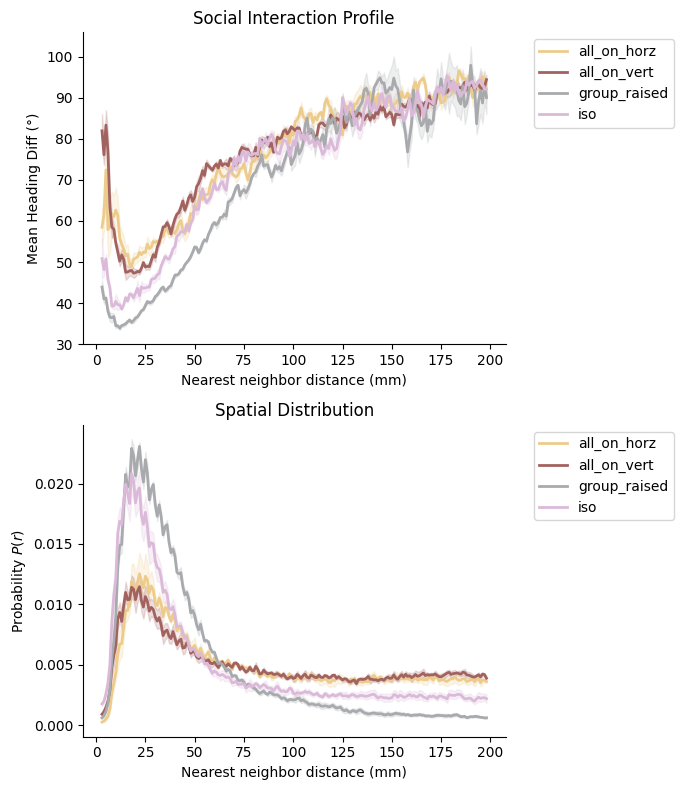

In [ ]:
# Plot heading alignment as a function of distance
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg
#SAVE_FIG = True
Fig_Name = 'heading_alignment_distance.svg'
# Set cmap to bone
imprinting_color_pal = {'group_raised':'#A8AAAD',
                        'iso':'#DBBAD9' ,
                        'all_on_horz':'#EDCC8B',
                        'all_on_vert':'#A26360'}



load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899

Distance_bins = np.arange(3,200,1)
heading_diff_data = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    data_path_neighbors = metadata['processed_data_path_neighbor'].iloc[i]
    tech_rep = metadata['tech_rep'].iloc[i]
    if tech_rep !=1:
      continue
    data = np.load(data_path, allow_pickle=True)
    neighbor_data = np.load(data_path_neighbors, allow_pickle=True)

    fish_num = data['fish_num']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    if EllapsedTime[-1]<TimeThresh:
      continue
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]
    date = metadata['experiment_date'].iloc[i]
    scale = metadata['rig_mm'].iloc[i] / metadata['vid_px'].iloc[i]
    f_x,f_y = data['f_x'], data['f_y']
    ff_dist = neighbor_data['ff_dist']
    frame_num = len(f_x[0])
    f_body_length = data['f_bodylength_mm']
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = np.argmin(np.abs(EllapsedTime - AnalysisLength))
    end_idx = np.argmin(np.abs(EllapsedTime - TimeThresh))
    # Convert angles to -180..180
    headings = ff_heading[:, start_idx:end_idx]
    ff_dist_filt = ff_dist[:, :,start_idx:end_idx]

    for fish in range(fish_num):
      # Get focal fish distances to other fish
      foi = ff_dist_filt[fish,:,:]
      # Get focal fish heading
      foi_heading = headings[fish]
      # Get non focal fish headings
      non_foi_heading = np.delete(headings, fish, axis=0)
      # Digitize distances to other fish in bins
      binned = np.digitize(foi, Distance_bins) # fish distance (idx x time)

      for bin in range(1,len(Distance_bins)):
        bin_idx = [np.where(binned[k,:]==bin)[0] for k in range(fish_num-1)]
        dist_bin = Distance_bins[bin-1]
        if all(len(b) == 0 for b in bin_idx):
            continue
        # Get heading of focal fish at bin indices
        foi_heading_bin = [foi_heading[bin_idx[kk]] for kk in range(len(bin_idx))] # headings of focal fish at distance targets
        non_foi_heading_bin = [non_foi_heading[kk,bin_idx[kk]] for kk in range(len(bin_idx))] # headings of non focal fish at distance targets

        # Calculate heading difference
        heading_diff = [foi_heading_bin[kk]-non_foi_heading_bin[kk] for kk in range(len(bin_idx))]
        heading_diff = np.concatenate(heading_diff)

        # Calculate mean heading difference
        avg_heading_diff = np.nanmean(np.abs((heading_diff.flatten() + 180) % 360 - 180))

        # Store total frames in bin
        total_neighbor_frames_in_bin = sum([len(b) for b in bin_idx])

        # Store output data
        heading_diff_data.append({'condition': condition,
                                  'fish':fish,
                                  'bin':dist_bin,
                                  'average_heading_diff': avg_heading_diff,
                                  'neighbor_count': total_neighbor_frames_in_bin})



heading_diff_df = pd.DataFrame(heading_diff_data)
conditions = heading_diff_df['condition'].unique()


# 1. Prepare Data (Ensuring fish are unique across experiments)
# Group alignment by fish/bin
fish_level_df = heading_diff_df.groupby(['condition', 'fish', 'bin'], as_index=False)['average_heading_diff'].mean()

# Calculate probability per fish
density_df = pd.DataFrame(heading_diff_data)

# 1. Collapse duplicate bins if a fish has multiple rows for the same bin across sessions
density_df = density_df.groupby(['condition', 'fish', 'bin'], as_index=False)['neighbor_count'].sum()

# 2. CRITICAL: Sort by bin so cumulative probabilities add up from closest to furthest!
density_df = density_df.sort_values(by=['condition', 'fish', 'bin'])

# 3. Calculate regular probability
total_counts = density_df.groupby(['condition', 'fish'])['neighbor_count'].transform('sum')
density_df['probability'] = density_df['neighbor_count'] / total_counts

# 4. Calculate cumulative probability on the strictly sorted bins
density_df['cum_prob'] = density_df.groupby(['condition', 'fish'])['probability'].cumsum()



# 2. Create Stacked Subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7, 8), sharex=False)
# --- Top Plot: Alignment ---
sns.lineplot(
    data=fish_level_df,
    x='bin',
    y='average_heading_diff',
    hue='condition',
    errorbar='se',
    ax=ax1,
    palette=imprinting_color_pal,
    legend=True,
    linewidth=2
)
ax1.set_ylabel('Mean Heading Diff (°)')
ax1.set_xlabel('Nearest neighbor distance (mm)')
ax1.set_title('Social Interaction Profile')
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# --- Bottom Plot: Density ---
sns.lineplot(
    data=density_df,
    x='bin',
    y='probability',
    hue='condition',
    ax=ax2,
    palette=imprinting_color_pal,
    legend=True, # Hide redundant legend
    # Make lines thicker
    linewidth=2
)


ax2.set_ylabel('Probability $P(r)$')
ax2.set_xlabel('Nearest neighbor distance (mm)')
ax2.set_title('Spatial Distribution')
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 3. Final Touches
sns.despine()
plt.tight_layout()
# if SAVE_FIG:
#   plt.savefig(figure_savepath+'/'+f"{Fig_Name}", format='svg')
plt.show()


<Figure size 640x480 with 0 Axes>

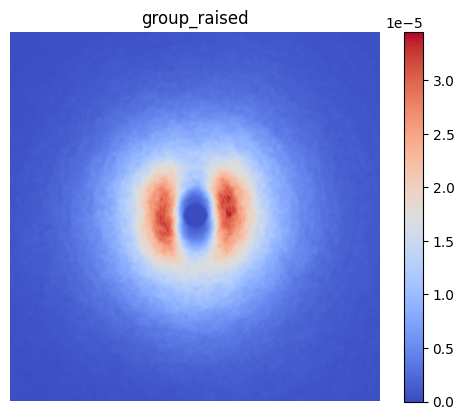

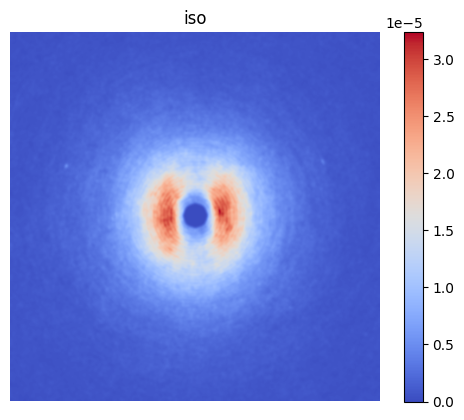

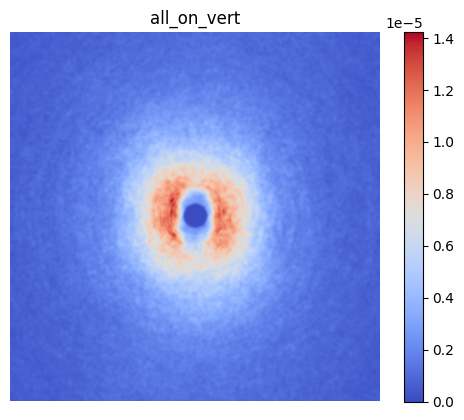

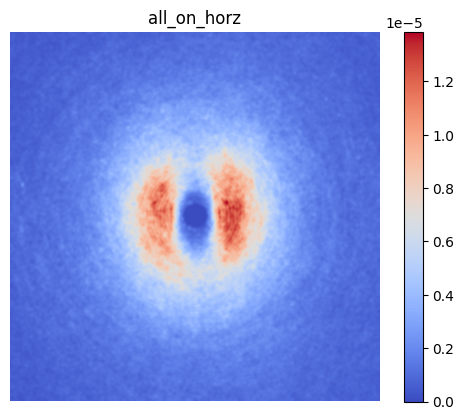

In [ ]:
# Generate occupany heatmaps

# Plot heading alignment as a function of distance
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg
import cv2
# Set cmap to bone
plt.rcParams['image.cmap'] = 'coolwarm'
load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899

Distance_bins = np.arange(3,200,1)
occupancy_data = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    data_path_neighbors = metadata['processed_data_path_neighbor'].iloc[i]
    tech_rep = metadata['tech_rep'].iloc[i]
    if tech_rep !=1:
      continue
    data = np.load(data_path, allow_pickle=True)
    neighbor_data = np.load(data_path_neighbors, allow_pickle=True)

    fish_num = data['fish_num']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    if EllapsedTime[-1]<TimeThresh:
      continue
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]
    date = metadata['experiment_date'].iloc[i]
    scale = metadata['rig_mm'].iloc[i] / metadata['vid_px'].iloc[i]
    f_x,f_y = data['f_x'], data['f_y']
    ff_dist = neighbor_data['ff_dist']
    frame_num = len(f_x[0])
    f_body_length = data['f_bodylength_mm']
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = np.argmin(np.abs(EllapsedTime - AnalysisLength))
    end_idx = np.argmin(np.abs(EllapsedTime - TimeThresh))

    # Convert angles to -180..180
    headings = ff_heading[:, start_idx:end_idx]
    ff_dist_filt = ff_dist[:, :,start_idx:end_idx]
    f_x_filt,f_y_filt = f_x[:,start_idx:end_idx],f_y[:,start_idx:end_idx]

    for fish in range(fish_num):
      # Get focal fish distances to other fish
      foi_dist = ff_dist_filt[fish,:,:]
      foi_x = f_x_filt[fish,:]
      foi_y = f_y_filt[fish,:]
      # Get focal fish heading
      foi_heading = headings[fish]
      # Get non focal fish headings and positions
      non_foi_heading = np.delete(headings, fish, axis=0)
      non_foi_x = np.delete(f_x_filt, fish, axis=0)
      non_foi_y = np.delete(f_y_filt, fish, axis=0)
      # Get vector from focal fish to non_focal fish
      vec_array = np.array([(non_foi_x-foi_x), (non_foi_y-foi_y)])*scale  # Shape = (x or y,vector to other fish,frames) = (2,n_other fish ,n_frames)
      occupancy_data.append({'condition': condition,
                             'scale': scale,
                             'focal_fish':fish,
                             'heading':foi_heading,
                             'vector_to_other_fish': vec_array})


occupancy_df = pd.DataFrame(occupancy_data)
conditions = occupancy_df['condition'].unique()

condition_palette = {
    'group_raised': '#4E79A7', # Muted Earth Blue
    'iso': '#59A14F',          # Terracotta/Earthy Red
    'all_on_vert': '#A65A4B',  # Mossy Green
    'all_on_horz': '#8C8C8C'   # Slate Grey (to differentiate from the others)
}


#1.) Create ego-centric occupancy map
ego_map_size = 150#size in mm
canvas_size = int((1/scale) * ego_map_size)
canvas = np.zeros((canvas_size,canvas_size))

center_canvas = np.array([int(canvas_size/2),int(canvas_size/2)])

#2.) loop over vector data to create occupancy heatmap
plt.figure()
for con in conditions:
  occupancy_df_subset = occupancy_df[occupancy_df['condition']==con]
  scale = occupancy_df_subset['scale'].iloc[0]
  canvas_size = int((1/scale) * ego_map_size)
  canvas = np.zeros((canvas_size,canvas_size))

  #iterate over each row to pull vector to other fish data
  n_pts = 0
  for index, row in occupancy_df_subset.iterrows():
    v2of = row['vector_to_other_fish'].copy()#units: mm
    scale = row['scale'] #units: mm/pixel
    heading = (row['heading'])
    fish = row['focal_fish']
    theta = np.deg2rad(heading-90)  #this rotates heading towards north

    cos_t = np.cos(-theta)
    sin_t = np.sin(-theta)

    x = v2of[0]  # (n_neighbors, n_frames)
    y = v2of[1]

    # Rotate (broadcast over neighbors)
    x_rot = x * cos_t - y * sin_t
    y_rot = x * sin_t + y * cos_t

    v2of = np.stack([x_rot, y_rot])

    # convert vector of distances in mm to pixel values relative center of the canvas
    v2of_scaled = (v2of / scale) + center_canvas.reshape(2,1,1) #units: mm -> pixels

    x = np.round(v2of_scaled[0].ravel()).astype(int)
    y = np.round(v2of_scaled[1].ravel()).astype(int)
    dist2center = np.linalg.norm(np.array([x-center_canvas[0],y-center_canvas[1]]), axis=0) * scale #units: pixels -> mm

    # Get values within canvas bounds
    valid = (
    (x >= 0) & (x < canvas_size) &
    (y >= 0) & (y < canvas_size) &
    (dist2center>5)
    )

    x = x[valid]
    y = y[valid]

    np.add.at(canvas, (y, x), 1)
    n_pts += v2of.shape[1] * v2of.shape[2]


  # Plot
  # Normalize canvas by number of bio replicates
  canvas = (canvas / n_pts)
  #canvas = canvas / np.max(canvas)
  # Add guassian blur from cv2
  blur_kernel = 7#int(canvas_size/15) + 1
  canvas = cv2.GaussianBlur(canvas, (blur_kernel, blur_kernel), 0)

  plt.figure()
  plt.title(con)
  plt.imshow(canvas, origin='lower')
  # remove axes
  plt.axis('off')
  plt.colorbar()
  plt.show()



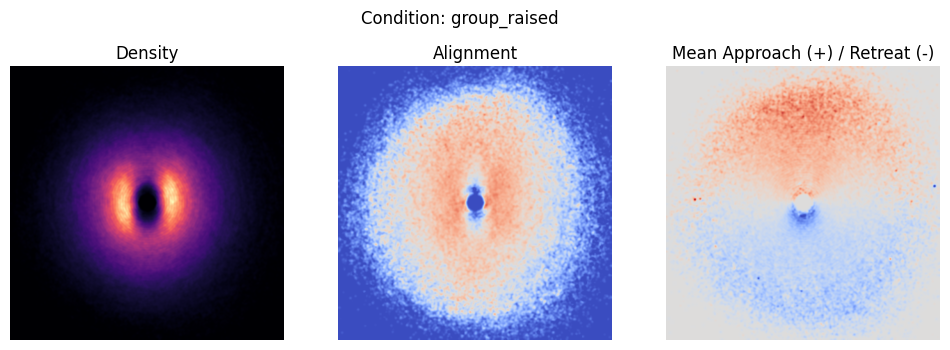

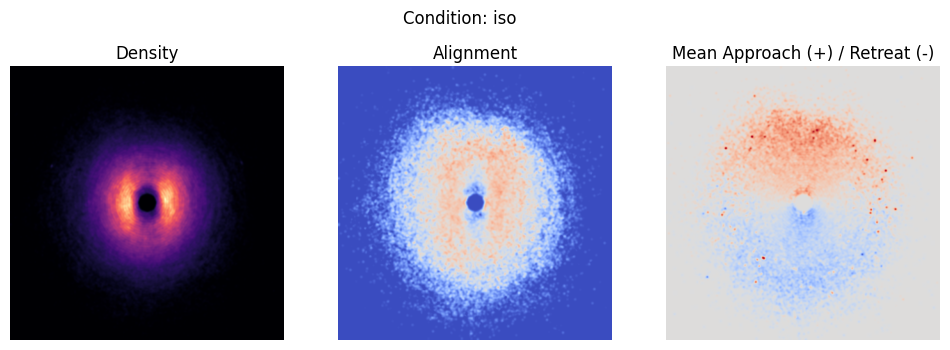

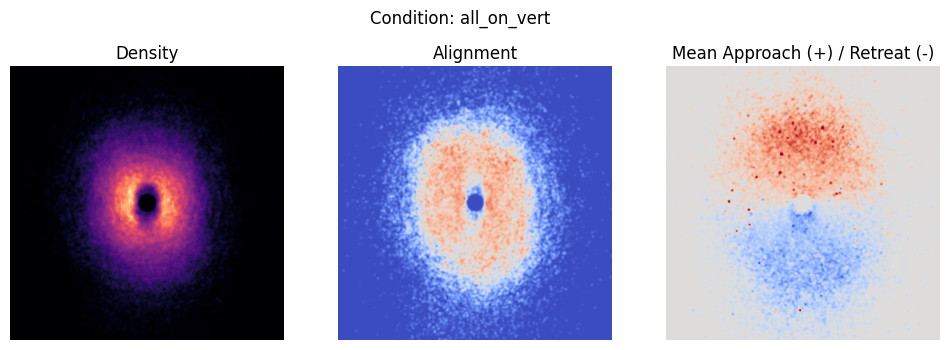

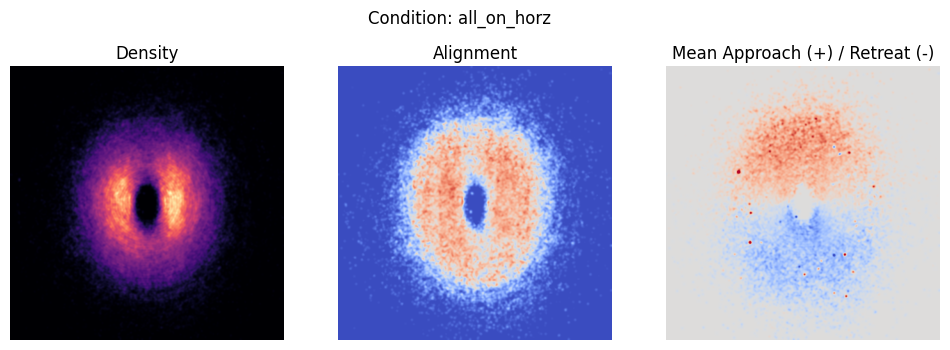

In [ ]:
# Generate relative velocity and alignment heatmaps

# Plot heading alignment as a function of distance
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg
import cv2
from scipy.ndimage import gaussian_filter1d

#SAVE_FIG = True
Fig_Name = 'heading_alignment_distance_heatmap.svg'

load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
bin_length =0.009
occupancy_data = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    data_path_neighbors = metadata['processed_data_path_neighbor'].iloc[i]
    tech_rep = metadata['tech_rep'].iloc[i]
    if tech_rep !=1:
      continue
    data = np.load(data_path, allow_pickle=True)
    neighbor_data = np.load(data_path_neighbors, allow_pickle=True)

    fish_num = data['fish_num']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    if EllapsedTime[-1]<TimeThresh:
      continue
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]
    date = metadata['experiment_date'].iloc[i]
    scale = metadata['rig_mm'].iloc[i] / metadata['vid_px'].iloc[i]
    f_x,f_y = data['f_x'], data['f_y']
    ff_dist = neighbor_data['ff_dist']
    frame_num = len(f_x[0])
    f_body_length = data['f_bodylength_mm']
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = np.argmin(np.abs(EllapsedTime - AnalysisLength))
    end_idx = np.argmin(np.abs(EllapsedTime - TimeThresh))

    # Filter data of interest
    headings = ff_heading[:, start_idx:end_idx]
    ff_dist_filt = ff_dist[:, :,start_idx:end_idx]
    f_x_filt,f_y_filt = f_x[:,start_idx:end_idx],f_y[:,start_idx:end_idx]
    EllapsedTime_filt = EllapsedTime[start_idx:end_idx] - EllapsedTime[start_idx]

    # Compute velocities (mm/frame)
    vx = np.diff(f_x_filt, axis=1) * scale
    vy = np.diff(f_y_filt, axis=1) * scale

    # smooth velocity either by binning or filtering
    # vx_smooth = gaussian_filter1d(vx, sigma=fps * 0.005 , axis=1)
    # vy_smooth = gaussian_filter1d(vy, sigma=fps * 0.005 , axis=1)
    uniform_fps = 120.0
    uniform_time = np.arange(EllapsedTime_filt[0], EllapsedTime_filt[-1], 1 / uniform_fps)
    f_x_interp = np.zeros((fish_num, len(uniform_time)))
    f_y_interp = np.zeros((fish_num, len(uniform_time)))
    for fish_idx in range(fish_num):
      # 'cubic' handles curved movement best, but 'linear' is safer against overshooting
      fx_func = interp1d(EllapsedTime_filt, f_x_filt[fish_idx, :], kind='linear')
      fy_func = interp1d(EllapsedTime_filt, f_y_filt[fish_idx, :], kind='linear')

      f_x_interp[fish_idx, :] = fx_func(uniform_time)
      f_y_interp[fish_idx, :] = fy_func(uniform_time)

    vx_smooth = np.diff(f_x_interp, axis=1) * scale * uniform_fps
    vy_smooth = np.diff(f_y_interp, axis=1) * scale * uniform_fps

    # Pad to match shape (T)
    vx = np.concatenate([vx, vx[:, -1][:, None]], axis=1)
    vy = np.concatenate([vy, vy[:, -1][:, None]], axis=1)
    vx_smooth = np.concatenate([vx_smooth, vx_smooth[:, -1][:, None]], axis=1)
    vy_smooth =  np.concatenate([vy_smooth, vy_smooth[:, -1][:, None]], axis=1)

    for fish in range(fish_num):
      # Get focal fish distances to other fish
      foi_dist = ff_dist_filt[fish,:,:]
      foi_x = f_x_filt[fish,:]
      foi_y = f_y_filt[fish,:]
      foi_x_bin = f_x_interp[fish,:]
      foi_y_bin = f_y_interp[fish,:]
      # Get focal fish heading
      foi_heading = headings[fish]
      # Get non focal fish headings and positions
      non_foi_heading = np.delete(headings, fish, axis=0)
      non_foi_x = np.delete(f_x_filt, fish, axis=0)
      non_foi_y = np.delete(f_y_filt, fish, axis=0)
      non_foi_x_bin = np.delete(f_x_interp, fish, axis=0)
      non_foi_y_bin = np.delete(f_y_interp, fish, axis=0)

      # Get vector from focal fish to non_focal fish
      vec_array = np.array([(non_foi_x-foi_x), (non_foi_y-foi_y)])* scale  # Shape = (x or y,vector to other fish,frames) = (2,n_other fish ,n_frames)
      vec_array_smooth = np.array([(non_foi_x_bin-foi_x_bin), (non_foi_y_bin-foi_y_bin)])* scale
      occupancy_data.append({'condition': condition,
                             'scale': scale,
                             'focal_fish':fish,
                             'ff_heading':foi_heading,
                             'other_fish_heading':non_foi_heading,
                             'vector_to_other_fish': vec_array,
                             'vector_to_other_fish_smooth': vec_array_smooth,
                             'vx':vx,
                             'vy':vy,
                             'vx_smooth':vx_smooth,
                             'vy_smooth':vy_smooth,
                             'f_x_filt':f_x_filt,
                             'f_y_filt':f_y_filt,
                             'exp_id':exp_id})


occupancy_df = pd.DataFrame(occupancy_data)
conditions = occupancy_df['condition'].unique()


#1.) Create ego-centric occupancy map
ego_map_size = 150#size in mm
canvas_size = int((1/scale) * ego_map_size)
canvas = np.zeros((canvas_size,canvas_size))
center_canvas = np.array([int(canvas_size/2),int(canvas_size/2)])

#2.) loop over vector data to create occupancy heatmap
for con in conditions:
  occupancy_df_subset = occupancy_df[occupancy_df['condition']==con]
  density_map = np.zeros((canvas_size, canvas_size))
  alignment_map = np.zeros((canvas_size, canvas_size))
  relvel_map = np.zeros((canvas_size, canvas_size))
  counts_map = np.zeros((canvas_size, canvas_size))
  #negative maps
  aligment_map_neg =0
  counts_map_neg = np.zeros((canvas_size, canvas_size))
  n_pts = 0


  vx_sum_map = np.zeros((canvas_size, canvas_size)) # To track polarization X
  vy_sum_map = np.zeros((canvas_size, canvas_size)) # To track polarization Y

  for _, row in occupancy_df_subset.iterrows():
      v2of = row['vector_to_other_fish']  # (2, n_neighbors, T)
      vx_all = row['vx']
      vy_all = row['vy']
      fish = row['focal_fish']
      heading = row['ff_heading'] - 90  # rotate to north-up

      theta = np.deg2rad(heading)

      cos_t = np.cos(-theta)
      sin_t = np.sin(-theta)



      # --- Rotate positions ---
      vxn = vx_all[fish]
      vyn = vy_all[fish]

      x = v2of[0]
      y = v2of[1]

      x_rot = x * cos_t - y * sin_t
      y_rot = x * sin_t + y * cos_t


      # Flatten
      x_flat = x_rot.ravel()
      y_flat = y_rot.ravel()
      dist2center = np.sqrt(x_flat**2+y_flat**2)


      # --- Velocity vectors ---
      vxf = vx_all[fish]
      vyf = vy_all[fish]

      vxn = np.delete(vx_all, fish, axis=0)
      vyn = np.delete(vy_all, fish, axis=0)


      mag_n = np.sqrt(vxn**2 + vyn**2) + 1e-8
      uxn, uyn = vxn / mag_n, vyn / mag_n

      uxn_rot = uxn * cos_t - uyn * sin_t
      uyn_rot = uxn * sin_t + uyn * cos_t
      uxn_flat = uxn_rot.ravel()
      uyn_flat = uyn_rot.ravel()

      # Expand focal velocity to match neighbors
      vxf = np.tile(vxf, (vxn.shape[0], 1))
      vyf = np.tile(vyf, (vyn.shape[0], 1))

      # --- Alignment --- (cosine similarity)
      dot = vxf * vxn + vyf * vyn
      mag_f = np.sqrt(vxf**2 + vyf**2)
      mag_n = np.sqrt(vxn**2 + vyn**2)

      alignment = dot / (mag_f * mag_n + 1e-8)

      # --- Relative velocity (approach/retreat) ---
      dx = x
      dy = y
      r = np.sqrt(dx**2 + dy**2) + 1e-8

      ux = dx / r
      uy = dy / r

      rel_vx = vxn - vxf
      rel_vy = vyn - vyf

      rel_speed = -(rel_vx * ux + rel_vy * uy)  # projection.

      # Flatten everything
      alignment_flat = alignment.ravel()
      relvel_flat = rel_speed.ravel()


      # Get indices for adding
      v2of = np.stack([x_rot, y_rot])
      v2of_scaled = (v2of / scale) + center_canvas.reshape(2,1,1)
      x,y = v2of_scaled[0].ravel(),v2of_scaled[1].ravel()
      x = np.round(v2of_scaled[0].ravel()).astype(int)
      y = np.round(v2of_scaled[1].ravel()).astype(int)

      dist2center = np.linalg.norm(np.array([x-center_canvas[0],y-center_canvas[1]]), axis=0) * scale #units: pixels -> mm

      # Get values within canvas bounds
      valid = (
      (x >= 0) & (x < canvas_size) &
      (y >= 0) & (y < canvas_size) &
      (dist2center>5)
      )

      x = x[valid]
      y = y[valid]

      alignment_invalid = alignment_flat[~valid]

      alignment_flat = alignment_flat[valid]
      relvel_flat = relvel_flat[valid]

      np.add.at(vx_sum_map, (y, x), uxn_flat[valid])
      np.add.at(vy_sum_map, (y, x), uyn_flat[valid])

      n_pts += v2of.shape[1] * v2of.shape[2]

      # --- Accumulate ---
      np.add.at(density_map, (y, x), 1)
      np.add.at(alignment_map, (y, x), alignment_flat)
      np.add.at(relvel_map, (y, x), relvel_flat)
      np.add.at(counts_map, (y, x), 1)
      # --- Accumulate chance ---
      aligment_map_neg+= np.sum(alignment_invalid) # np.add.at(aligment_map_neg, (y, x), alignment_invalid)
      np.add.at(counts_map_neg, (y, x), 1)


  # Normalize the image
  alignment_map = alignment_map / (counts_map + 1e-8)
  relvel_map  = relvel_map / (counts_map + 1e-8)
  density_map = density_map / n_pts


  # get anti alignment
  mean_ux = vx_sum_map / (counts_map + 1e-8)
  mean_uy = vy_sum_map / (counts_map + 1e-8)
  polarization_map = np.sqrt(mean_ux**2 + mean_uy**2)
 # alignment_map = polarization_map#alignment_map - np.mean((aligment_map_neg / (np.sum(counts_map_neg) + 1e-8)))

  # Get mask to only include reliable pixels
  mask = counts_map > 10#(np.mean(counts_map))*10


  #Zero out background
  alignment_map[~mask] = 0
  relvel_map[~mask] = 0
  density_map[~mask] = 0


  # Blur that image
  blur_kernel = 7
  alignment_map = cv2.GaussianBlur(alignment_map, (blur_kernel, blur_kernel), 0)
  relvel_map = cv2.GaussianBlur(relvel_map, (blur_kernel, blur_kernel), 0)
  density_map = cv2.GaussianBlur(density_map, (blur_kernel, blur_kernel), 0)
  counts_map = cv2.GaussianBlur(counts_map, (blur_kernel, blur_kernel), 0)


  # Plot

  fig, axs = plt.subplots(1, 3, figsize=(12, 4))
  plt.suptitle(f'Condition: {con}')
  im0 = axs[0].imshow(density_map, origin='lower', cmap='magma')
  axs[0].set_title('Density')
  #fig.colorbar(im0, ax=axs[0])


  im1 = axs[1].imshow(alignment_map, origin='lower', cmap='coolwarm',vmin=0,vmax=0.5)
  axs[1].set_title('Alignment')
  #fig.colorbar(im1, ax=axs[1])

  v_lim = 0.3 #np.percentile(99.5)
  im2 = axs[2].imshow(relvel_map, origin='lower', cmap='coolwarm', vmin=-v_lim, vmax=v_lim)
  axs[2].set_title('Mean Approach (+) / Retreat (-)')
  #fig.colorbar(im2, ax=axs[2])

  for ax in axs:
      ax.axis('off')
  # if SAVE_FIG:
  #   fig_name = Fig_Name.replace('.svg',f'_{con}.svg')
  #   plt.savefig(fig_name, bbox_inches='tight')
  plt.show()




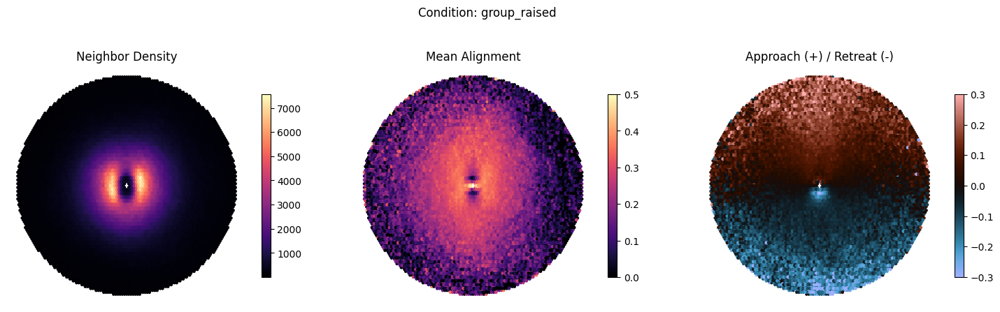

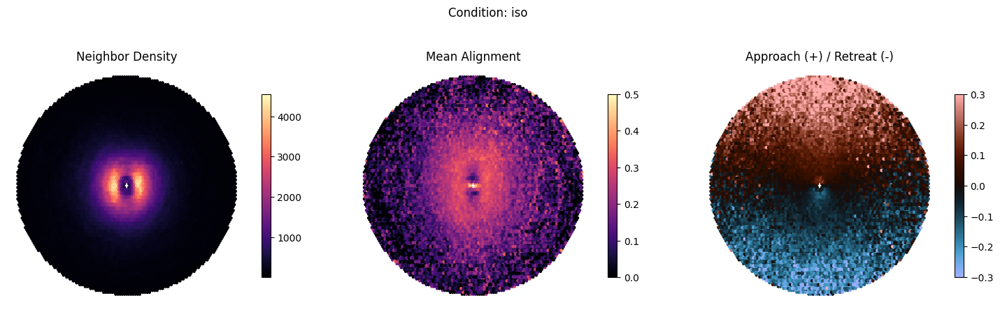

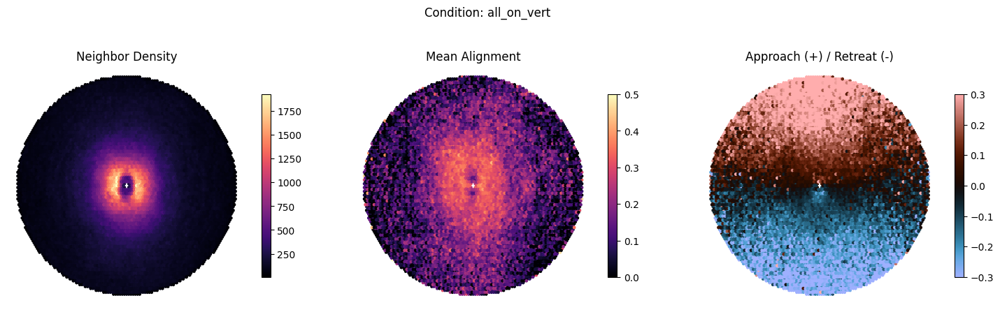

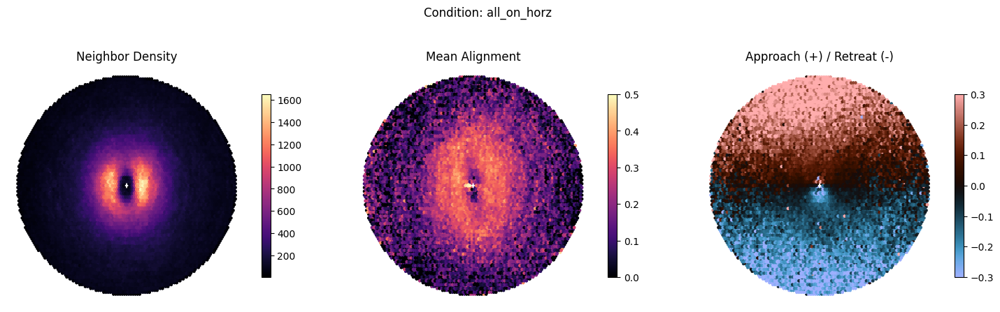

In [ ]:
# Parameters
ego_lim = 100  # mm (replaces ego_map_size)
grid_res = 100 # gridsize for hexbin

SAVE_FIG = True
Fig_Name = 'heading_alignment_distance_heatmap.svg'

for con in conditions:
    subset = occupancy_df[occupancy_df['condition'] == con]

    # Storage for all frames/fish in this condition
    all_x, all_y = [], []
    all_align, all_relvel = [], []

    for _, row in subset.iterrows():
        v2of = row['vector_to_other_fish']
        vx_all, vy_all = row['vx'], row['vy']
        fish = row['focal_fish']
        theta = np.deg2rad(row['ff_heading'] - 90)

        # 1. Rotate positions (Relative vectors)
        cos_t, sin_t = np.cos(-theta), np.sin(-theta)
        x_rot = v2of[0] * cos_t - v2of[1] * sin_t
        y_rot = v2of[0] * sin_t + v2of[1] * cos_t

        # 2. Alignment Calculation
        vxf, vyf = vx_all[fish], vy_all[fish]
        vxn = np.delete(vx_all, fish, axis=0)
        vyn = np.delete(vy_all, fish, axis=0)

        # Standardize focal velocity vectors to match neighbor shape
        vxf_tile = np.tile(vxf, (vxn.shape[0], 1))
        vyf_tile = np.tile(vyf, (vxn.shape[0], 1))

        mag_f = np.sqrt(vxf_tile**2 + vyf_tile**2 + 1e-8)
        mag_n = np.sqrt(vxn**2 + vyn**2 + 1e-8)
        alignment = (vxf_tile * vxn + vyf_tile * vyn) / (mag_f * mag_n)

        # 3. Relative Velocity (Approach/Retreat)
        r = np.sqrt(v2of[0]**2 + v2of[1]**2 + 1e-8)
        ux, uy = v2of[0]/r, v2of[1]/r
        rel_speed = -((vxn - vxf_tile) * ux + (vyn - vyf_tile) * uy)

        # 4. Filter artifacts and bounds
        dist = np.sqrt(x_rot**2 + y_rot**2)
        valid = (dist > 3) & (dist < ego_lim) # 3mm artifact filter

        all_x.extend(x_rot[valid].ravel())
        all_y.extend(y_rot[valid].ravel())
        all_align.extend(alignment[valid].ravel())
        all_relvel.extend(rel_speed[valid].ravel())

    # --- Plotting ---
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    plt.suptitle(f'Condition: {con}')

    extent = [-ego_lim, ego_lim, -ego_lim, ego_lim]
    common_params = dict(gridsize=grid_res, extent=extent, mincnt=5)

    # A. Density (Standard Count)
    hb0 = axs[0].hexbin(all_x, all_y, cmap='magma', **common_params)
    axs[0].set_title('Neighbor Density')

    # B. Alignment (Mean of Alignment values in each hex)
    hb1 = axs[1].hexbin(all_x, all_y, C=all_align, cmap='magma', vmin=0, vmax=0.5, **common_params)
    axs[1].set_title('Mean Alignment')

    # C. Relative Velocity (Mean of RelVel values in each hex)
    hb2 = axs[2].hexbin(all_x, all_y, C=all_relvel, cmap='berlin', vmin=-0.3, vmax=0.3, **common_params)
    axs[2].set_title('Approach (+) / Retreat (-)')

    for i, ax in enumerate(axs):
        ax.set_aspect('equal')
        plt.colorbar([hb0, hb1, hb2][i], ax=ax, shrink=0.6)

    plt.tight_layout()
    # Remove axes from plots
    for ax in axs:
        ax.axis('off')
    if SAVE_FIG:
        fig_name = Fig_Name.replace('.svg',f'_{con}.svg')
        plt.savefig(figure_savepath+'/'+f"{fig_name}", format='svg')
    plt.show()

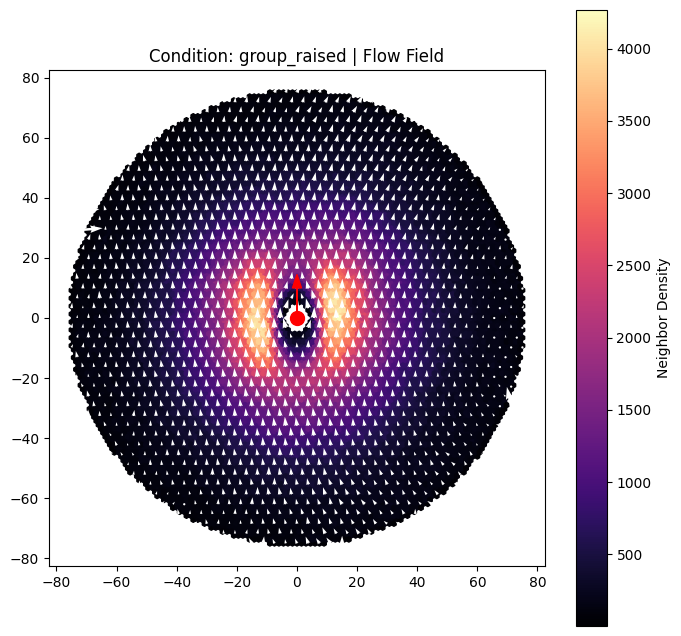

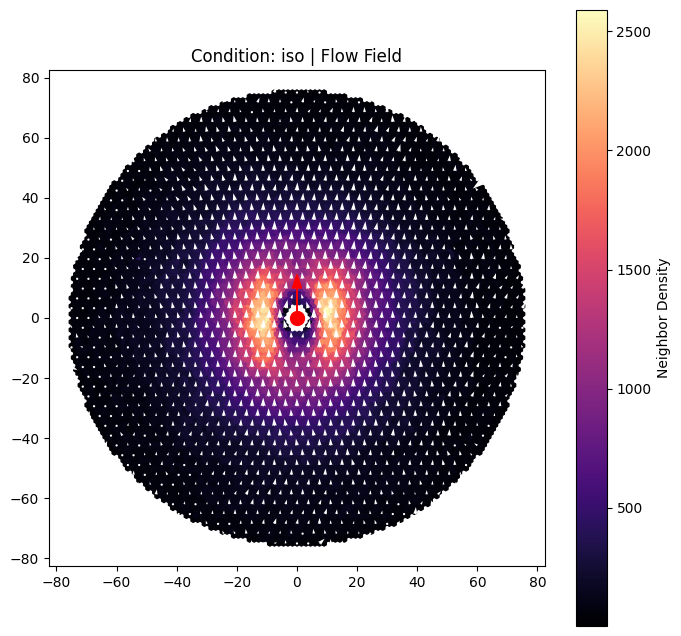

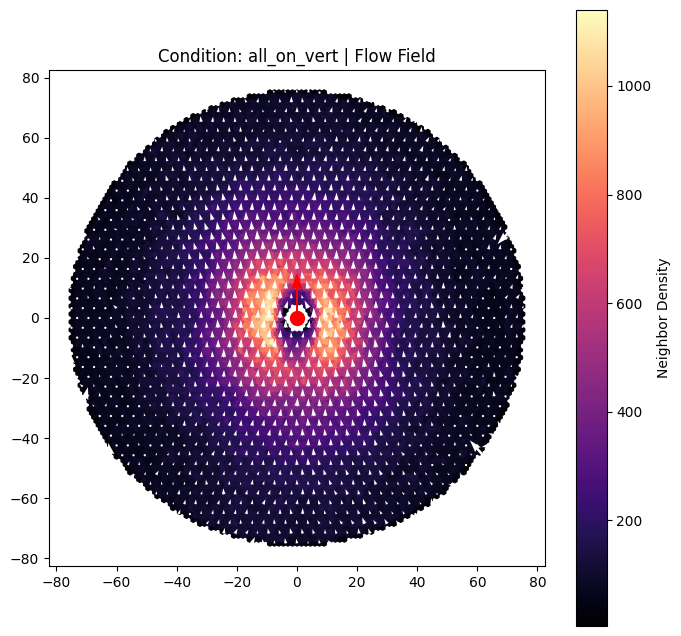

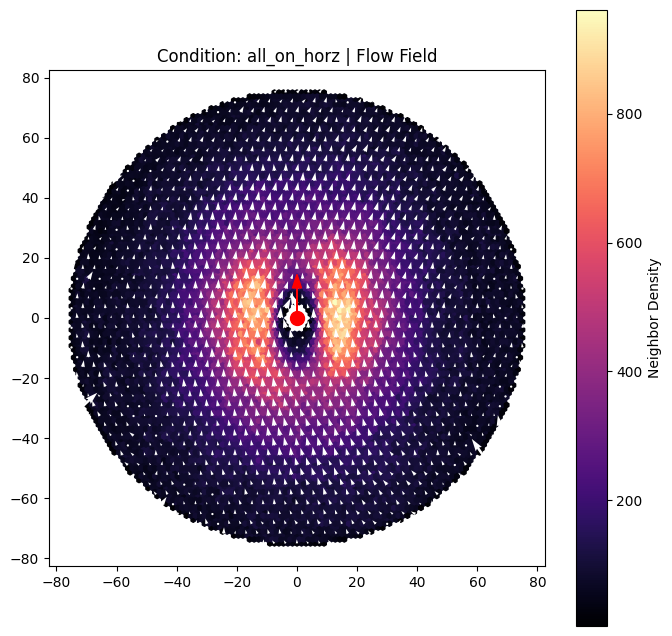

In [ ]:
# Parameters
ego_lim = 75
grid_res = 40 # Lower grid res for quiver so the arrows aren't too crowded

for con in conditions:
    subset = occupancy_df[occupancy_df['condition'] == con]

    all_x, all_y = [], []
    all_ux_rot, all_uy_rot = [] , [] # Rotated neighbor unit velocities

    for _, row in subset.iterrows():
        v2of = row['vector_to_other_fish']
        vx_all, vy_all = row['vx'], row['vy']
        fish = row['focal_fish']
        theta = np.deg2rad(row['ff_heading'] - 90)
        cos_t, sin_t = np.cos(-theta), np.sin(-theta)

        # 1. Rotate neighbor positions
        x_rot = v2of[0] * cos_t - v2of[1] * sin_t
        y_rot = v2of[0] * sin_t + v2of[1] * cos_t

        # 2. Rotate neighbor unit velocities into focal-local frame
        vxn = np.delete(vx_all, fish, axis=0)
        vyn = np.delete(vy_all, fish, axis=0)
        mag_n = np.sqrt(vxn**2 + vyn**2 + 1e-8)

        # Unit vectors in global space
        uxn, uyn = vxn / mag_n, vyn / mag_n

        # Rotate unit vectors into the "North-Up" frame
        uxn_rot = uxn * cos_t - uyn * sin_t
        uyn_rot = uxn * sin_t + uyn * cos_t

        # 3. Filter
        dist = np.sqrt(x_rot**2 + y_rot**2)
        valid = (dist > 5) & (dist < ego_lim)

        all_x.extend(x_rot[valid].ravel())
        all_y.extend(y_rot[valid].ravel())
        all_ux_rot.extend(uxn_rot[valid].ravel())
        all_uy_rot.extend(uyn_rot[valid].ravel())

    # --- Plotting ---
    fig, ax = plt.subplots(figsize=(8, 8))

    # 1. Draw the Heatmap (Density)
    hb = ax.hexbin(all_x, all_y, gridsize=100, cmap='magma', mincnt=5, extent=[-ego_lim, ego_lim, -ego_lim, ego_lim])

    # 2. Calculate average velocity per bin for Quiver
    # We use a separate hexbin call with C to get the means of UX and UY
    hb_ux = ax.hexbin(all_x, all_y, C=all_ux_rot, gridsize=grid_res, visible=False, extent=[-ego_lim, ego_lim, -ego_lim, ego_lim])
    hb_uy = ax.hexbin(all_x, all_y, C=all_uy_rot, gridsize=grid_res, visible=False, extent=[-ego_lim, ego_lim, -ego_lim, ego_lim])

    # Get the centers of the bins and the average vectors
    verts = hb_ux.get_offsets()
    u_avg = hb_ux.get_array()
    v_avg = hb_uy.get_array()

    # Filter out empty bins for the arrows
    mask = ~np.isnan(u_avg)
    ax.quiver(verts[mask, 0], verts[mask, 1], u_avg[mask], v_avg[mask],
              color='white', scale=25, width=0.005, headwidth=3)

    # 3. Add Focal Fish Marker
    ax.plot(0, 0, 'ro', markersize=10, label='Focal Fish')
    ax.arrow(0, 0, 0, 10, color='red', head_width=3) # Direction arrow

    ax.set_aspect('equal')
    ax.set_title(f'Condition: {con} | Flow Field')
    plt.colorbar(hb, ax=ax, label='Neighbor Density')
    plt.show()

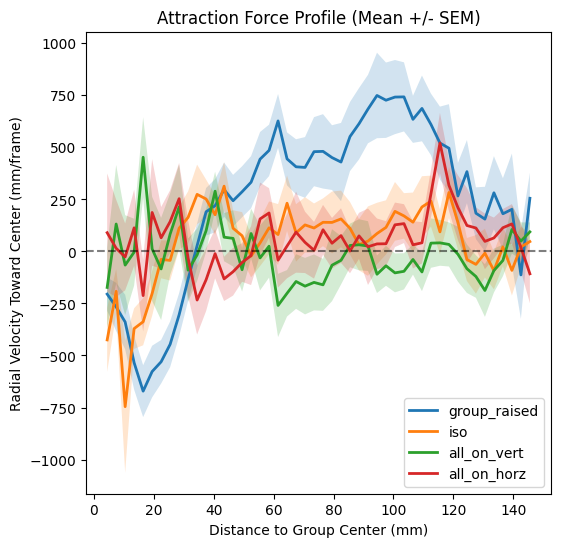

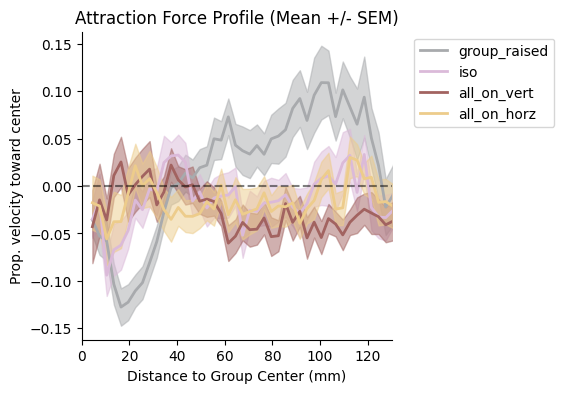

In [ ]:
# Let's plot radial velocity as a function of distance
SAVE_FIG = True

fps = 120
dist_bins = np.arange(0, 150, 3) # 5mm bins up to 150mm
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2
results = []
for con in conditions:
    subset = occupancy_df[occupancy_df['condition'] == con]

    all_dists = []
    all_rv = []
    for _, row in subset.iterrows():
        v2of = row['vector_to_other_fish_smooth']
        vx_all, vy_all = row['vx_smooth'], row['vy_smooth']

        # Get unit vector to group center
        group_center = np.mean(v2of,axis=1)
        group_center_u = group_center / np.linalg.norm(group_center,axis=0)
        dist_to_center = np.linalg.norm(group_center, axis=0)
        # Get neighbor velocities
        fish = row['focal_fish']
        vel_f = np.vstack([vx_all[fish], vy_all[fish]])

        # Dot with group_center_u to get radial velocity
        radial_v = np.sum(group_center_u * vel_f, axis=0) * fps # Shape: (n_frames,)
        radial_v_norm = radial_v / (np.linalg.norm(vel_f, axis=0)*fps+1e-8)

        valid = (dist_to_center > 3) & (dist_to_center < 350) & (~np.isnan(radial_v))
        dist_to_center = dist_to_center[valid]
        radial_v = radial_v[valid]
        radial_v_norm = radial_v_norm[valid]

        dist_idx = np.digitize(dist_to_center,dist_bins)-1
        dist_idx = np.clip(dist_idx, 0, len(dist_bins) - 2)

        counts = np.bincount(dist_idx, minlength=len(dist_bins)-1)
        rv_sum = np.bincount(dist_idx, weights=radial_v, minlength=len(dist_bins)-1)
        rv_norm_sum = np.bincount(dist_idx, weights=radial_v_norm, minlength=len(dist_bins)-1)

        # Calculate mean for this fish (ignoring bins with no data)
        with np.errstate(divide='ignore', invalid='ignore'):
            fish_rv_bins = (rv_sum / counts)
            fish_rv_norm_bins = (rv_norm_sum / counts)

        for b_idx in range(len(bin_centers)):
                    if counts[b_idx] > 0: # Only store bins where the fish actually spent time
                        results.append({
                            'condition': con,
                            'fish_id': f"{row['condition']}_{row['focal_fish']}", # Unique ID
                            'dist': bin_centers[b_idx],
                            'rv': fish_rv_bins[b_idx],
                            'rv_norm': fish_rv_norm_bins[b_idx]
                        })



# Convert to DataFrame for easy grouping
res_df = pd.DataFrame(results)

# --- Plotting with SEM ---
plt.figure(figsize=(6, 6))

for con in conditions:
    con_data = res_df[res_df['condition'] == con]

    # Group by distance bin to get mean and SEM across different fish
    stats = con_data.groupby('dist')['rv'].agg(['mean', 'sem', 'count']).reset_index()

    # Filter for bins with enough biological replicates (e.g., at least 3 fish)
    stats = stats[stats['count'] >= 3]

    plt.plot(stats['dist'], stats['mean'], label=con, lw=2)
    plt.fill_between(stats['dist'],
                     stats['mean'] - stats['sem'],
                     stats['mean'] + stats['sem'],
                     alpha=0.2)

plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.xlabel('Distance to Group Center (mm)')
plt.ylabel('Radial Velocity Toward Center (mm/frame)')
plt.title('Attraction Force Profile (Mean +/- SEM)')
plt.legend()
plt.show()


# --- Plotting with Normalized SEM ---
plt.figure(figsize=(4, 4))

for con in conditions:
    con_data = res_df[res_df['condition'] == con]

    # Group by distance bin to get mean and SEM across different fish
    stats = con_data.groupby('dist')['rv_norm'].agg(['mean', 'sem', 'count']).reset_index()

    # Filter for bins with enough biological replicates (e.g., at least 3 fish)
    stats = stats[stats['count'] >= 3]

    plt.plot(stats['dist'], stats['mean'], label=con, lw=2,color=imprinting_color_pal[con])
    #plt.plot(stats['dist'], stats['mean'], label=con, lw=2
    plt.fill_between(stats['dist'],
                     stats['mean'] - stats['sem'],
                     stats['mean'] + stats['sem'],
                     alpha=0.5,
                     color=imprinting_color_pal[con])
# Remove top and right border
sns.despine()
plt.xlim(0,130)
plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.xlabel('Distance to Group Center (mm)')
plt.ylabel('Prop. velocity toward center')
plt.title('Attraction Force Profile (Mean +/- SEM)')
# Move legend to right of plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
fig_name = 'velocity_toward_group_center.svg'
if SAVE_FIG:
  plt.savefig(figure_savepath+'/'+f'{fig_name}', format='svg')
plt.show()


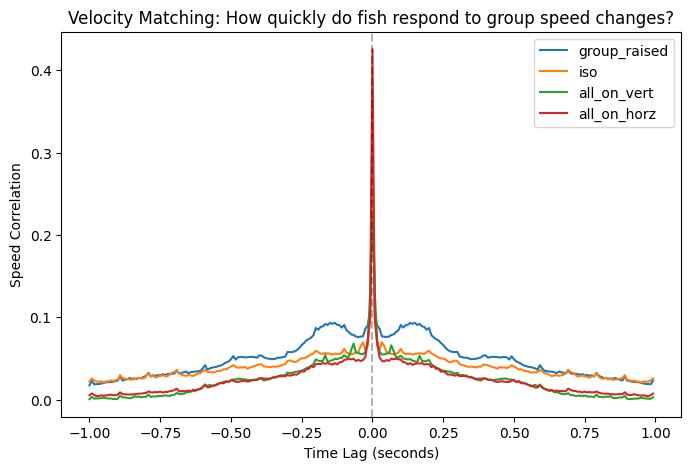

In [ ]:
from scipy.signal import correlate

# Parameters
max_lag_sec = 1.0
lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))

matching_results = []

for con in conditions:
    subset = occupancy_df[occupancy_df['condition'] == con]

    for _, row in subset.iterrows():
        vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
        fish = row['focal_fish']

        # 1. Focal Speed
        speed_f = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)

        # 2. Average Neighbor Speed (The "Group Pulse")
        vx_neighbors = np.delete(vx_all, fish, axis=0)
        vy_neighbors = np.delete(vy_all, fish, axis=0)
        speed_n_avg = np.nanmean(np.sqrt(vx_neighbors**2 + vy_neighbors**2), axis=0)

        # 3. Cross-Correlation of Speed
        # Normalize to get a Correlation Coefficient (-1 to 1)
        s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) * len(speed_f))
        s_n = (speed_n_avg - np.mean(speed_n_avg)) / np.std(speed_n_avg)

        corr = correlate(s_f, s_n, mode='same')

        # Find the center of the correlation array
        center = len(corr) // 2
        corr_subset = corr[center + lags[0] : center + lags[-1] + 1]

        matching_results.append({
            'condition': con,
            'fish_id': row['focal_fish'],
            'lags_sec': lags / fps,
            'corr': corr_subset
        })

# --- Plotting the "Response Curve" ---
plt.figure(figsize=(8, 5))
for con in conditions:
    con_data = [r['corr'] for r in matching_results if r['condition'] == con]
    mean_corr = np.mean(con_data, axis=0)
    plt.plot(lags / fps, mean_corr, label=con)

plt.axvline(0, color='k', linestyle='--', alpha=0.3)
plt.xlabel('Time Lag (seconds)')
plt.ylabel('Speed Correlation')
plt.title('Velocity Matching: How quickly do fish respond to group speed changes?')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

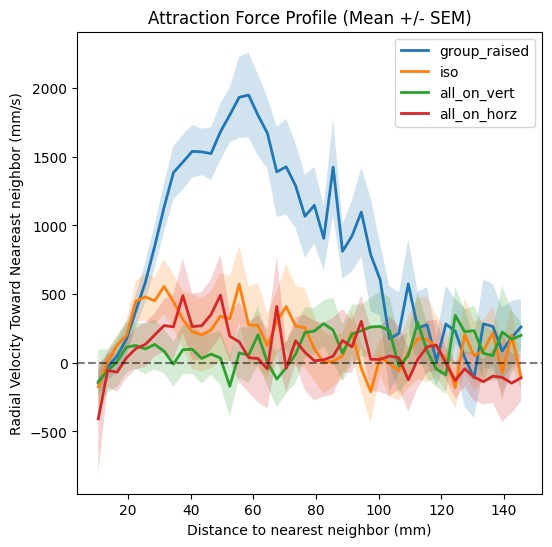

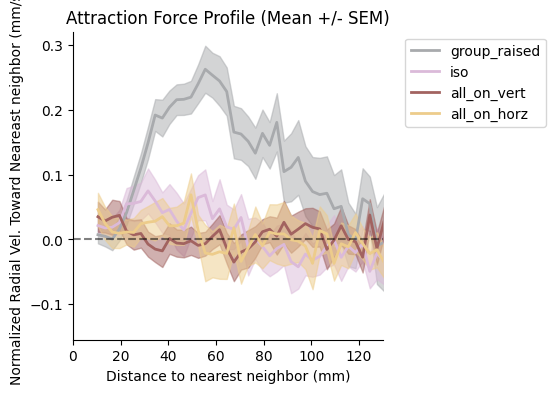

In [ ]:
# Let's plot radial velocity as a function of distance--to nearest neighbor
SAVE_FIG = True
fps = 120
dist_bins = np.arange(0, 150, 3) # 5mm bins up to 150mm
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2
results = []
for con in conditions:
    subset = occupancy_df[occupancy_df['condition'] == con]

    all_dists = []
    all_rv = []
    for _, row in subset.iterrows():
        v2of = row['vector_to_other_fish_smooth']
        vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
        all_neighbor_dists = np.linalg.norm(v2of, axis=0)
        nearest_idx = np.argmin(all_neighbor_dists, axis=0)
        v_to_nearest = np.take_along_axis(v2of, nearest_idx[None, None, :], axis=1).squeeze(1)
        dist_to_nearest = np.linalg.norm(v_to_nearest, axis=0)
        # Get unit vector to  nearest fish
        u_to_nearest = v_to_nearest / (dist_to_nearest + 1e-8)

        # Get neighbor velocities
        fish = row['focal_fish']
        vel_f = np.vstack([vx_all[fish], vy_all[fish]])

        # Dot with group_center_u to get radial velocity
        radial_v = np.sum(u_to_nearest * vel_f, axis=0) * fps # Shape: (n_frames,)
        radial_v_norm = radial_v / (np.linalg.norm(vel_f, axis=0)*fps+1e-8)

        valid = (dist_to_nearest > 10) & (dist_to_nearest < 350) & (~np.isnan(radial_v))
        dist_to_nearest = dist_to_nearest[valid]
        radial_v = radial_v[valid]
        radial_v_norm = radial_v_norm[valid]

        dist_idx = np.digitize(dist_to_nearest,dist_bins)-1
        dist_idx = np.clip(dist_idx, 0, len(dist_bins) - 2)

        counts = np.bincount(dist_idx, minlength=len(dist_bins)-1)
        rv_sum = np.bincount(dist_idx, weights=radial_v, minlength=len(dist_bins)-1)
        radial_norm_sum = np.bincount(dist_idx, weights=radial_v_norm, minlength=len(dist_bins)-1)

        # Calculate mean for this fish (ignoring bins with no data)
        with np.errstate(divide='ignore', invalid='ignore'):
            fish_rv_bins = (rv_sum / counts)
            fish_rv_norm_bins = (radial_norm_sum / counts)

        for b_idx in range(len(bin_centers)):
                    if counts[b_idx] > 0: # Only store bins where the fish actually spent time
                        results.append({
                            'condition': con,
                            'fish_id': f"{row['condition']}_{row['focal_fish']}", # Unique ID
                            'dist': bin_centers[b_idx],
                            'rv': fish_rv_bins[b_idx],
                            'rv_norm': fish_rv_norm_bins[b_idx]
                        })



# Convert to DataFrame for easy grouping
res_df = pd.DataFrame(results)

# --- Plotting with SEM ---
plt.figure(figsize=(6, 6))

for con in conditions:
    con_data = res_df[res_df['condition'] == con]

    # Group by distance bin to get mean and SEM across different fish
    stats = con_data.groupby('dist')['rv'].agg(['mean', 'sem', 'count']).reset_index()

    # Filter for bins with enough biological replicates (e.g., at least 3 fish)
    stats = stats[stats['count'] >= 3]

    plt.plot(stats['dist'], stats['mean'], label=con, lw=2)
    plt.fill_between(stats['dist'],
                     stats['mean'] - stats['sem'],
                     stats['mean'] + stats['sem'],
                     alpha=0.2)

plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.xlabel('Distance to nearest neighbor (mm)')
plt.ylabel('Radial Velocity Toward Neareast neighbor (mm/s)')
plt.title('Attraction Force Profile (Mean +/- SEM)')
plt.legend()
plt.show()

# --- Plotting with Normalized Values with SEM ---
plt.figure(figsize=(4, 4))

for con in conditions:
    con_data = res_df[res_df['condition'] == con]

    # Group by distance bin to get mean and SEM across different fish
    stats = con_data.groupby('dist')['rv_norm'].agg(['mean', 'sem', 'count']).reset_index()

    # Filter for bins with enough biological replicates (e.g., at least 3 fish)
    stats = stats[stats['count'] >= 3]

    plt.plot(stats['dist'], stats['mean'], label=con, lw=2,color=imprinting_color_pal[con])
    plt.fill_between(stats['dist'],
                     stats['mean'] - stats['sem'],
                     stats['mean'] + stats['sem'],
                     alpha=0.5,
                     color=imprinting_color_pal[con])

plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.xlabel('Distance to nearest neighbor (mm)')
plt.ylabel('Normalized Radial Vel. Toward Neareast neighbor (mm/s)')
plt.title('Attraction Force Profile (Mean +/- SEM)')
# Remove top and right borders
sns.despine()
plt.xlim(0,130)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

fig_name = 'velocity_toward_nearest_neighbor.svg'
if SAVE_FIG:
  plt.savefig(figure_savepath+'/'+f'{fig_name}', format='svg')
plt.show()


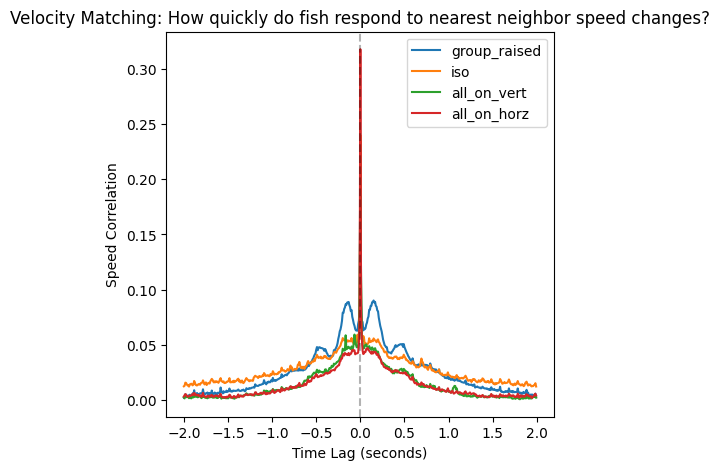

In [ ]:
from scipy.signal import correlate

# Parameters
max_lag_sec = 2
lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))

matching_results = []

for con in conditions:
    subset = occupancy_df[occupancy_df['condition'] == con]

    for _, row in subset.iterrows():
        v2of = row['vector_to_other_fish_smooth']
        nearest_idx = np.argmin(np.linalg.norm(v2of, axis=0), axis=0)
        vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
        fish = row['focal_fish']

        # 1. Focal Speed
        speed_f = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)

        # 2. Average Neighbor Speed (The "Group Pulse")
        vx_neighbors = np.delete(vx_all, fish, axis=0)
        vy_neighbors = np.delete(vy_all, fish, axis=0)
        speed_n_avg = np.nanmean(np.sqrt(vx_neighbors**2 + vy_neighbors**2), axis=0)
        speeds_all_n = np.sqrt(vx_neighbors**2 + vy_neighbors**2)
        nearest_neighbor_speed = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()
        # 3. Cross-Correlation of Speed
        # Normalize to get a Correlation Coefficient (-1 to 1)
        s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) * len(speed_f))
        s_n = (nearest_neighbor_speed - np.mean(nearest_neighbor_speed)) / np.std(nearest_neighbor_speed)

        corr = correlate(s_f, s_n, mode='same')

        # Find the center of the correlation array
        center = len(corr) // 2
        corr_subset = corr[center + lags[0] : center + lags[-1] + 1]

        matching_results.append({
            'condition': con,
            'fish_id': row['focal_fish'],
            'lags_sec': lags / fps,
            'corr': corr_subset
        })

# --- Plotting the "Response Curve" ---
plt.figure(figsize=(5, 5))
for con in conditions:
    con_data = [r['corr'] for r in matching_results if r['condition'] == con]
    mean_corr = np.mean(con_data, axis=0)
    plt.plot(lags / fps, mean_corr, label=con)

plt.axvline(0, color='k', linestyle='--', alpha=0.3)
plt.xlabel('Time Lag (seconds)')
plt.ylabel('Speed Correlation')
plt.title('Velocity Matching: How quickly do fish respond to nearest neighbor speed changes?')
plt.legend()
plt.show()

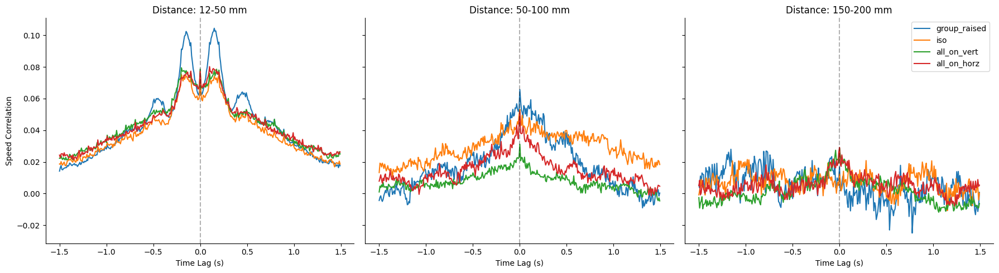

In [ ]:
from scipy.signal import correlate, detrend
import random
# Parameters
dist_slices = [(12, 50), (50, 100), (150, 200)]
max_lag_sec = 1.5
fps = 120###NOTE THIS WILL CHANGE DEPENDING ON BIN LENGTH. RAW FPS  ~120
lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))
cons = occupancy_df['condition'].unique()
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
current_experiment = 'nothing'
for ax, (d_min, d_max) in zip(axs, dist_slices):
    matching_results = []
    for con in conditions:
        subset = occupancy_df[occupancy_df['condition'] == con]

        for _, row in subset.iterrows():
            v2of = row['vector_to_other_fish_smooth']
            vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
            fish = row['focal_fish']
            # Eliminate double counting of pairs by only counting first two fish
            new_experiment = row['exp_id']

            # 1. Identify Nearest Neighbor and Distance
            all_neighbor_dists = np.linalg.norm(v2of, axis=0)
            nearest_idx = np.argmin(all_neighbor_dists, axis=0)
            dist_to_nearest = np.min(all_neighbor_dists, axis=0)

            # 2. Create MASK for this distance slice and also remove spurious high speeds from tracking erros
            speeds = np.sqrt(vx_all**2 + vy_all**2)  # shape (n_fish, n_frames)
            speed_mean = np.mean(speeds, axis=1, keepdims=True)
            speed_std  = np.std(speeds,  axis=1, keepdims=True)
            bad_frames = np.any(speeds > speed_mean + 5 * speed_std, axis=0)  # (n_frames,)
            mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) &  ~bad_frames

            if np.sum(mask) < (fps * 2): # Need at least 2 seconds of data in this slice
                continue

            # 3. Speeds
            speed_f = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)[mask]

            vx_neighbors = np.delete(vx_all, fish, axis=0)
            vy_neighbors = np.delete(vy_all, fish, axis=0)
            speeds_all_n = np.sqrt(vx_neighbors**2 + vy_neighbors**2)
            nearest_neighbor_speed = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()[mask]

            # 4. Normalize and Correlate
            # Use only the masked data for mean/std to avoid cross-distance contamination
            s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) + 1e-8)
            s_n = (nearest_neighbor_speed - np.mean(nearest_neighbor_speed)) / (np.std(nearest_neighbor_speed) + 1e-8)

            # Detrend data?
            s_f = detrend(s_f)
            s_n = detrend(s_n)

            corr = correlate(s_f, s_n, mode='same') / len(speed_f)

            center = len(corr) // 2
            corr_subset = corr[max(0, center + lags[0]) : min(len(corr), center + lags[-1] + 1)]

            # Pad if slice was too short for the lag window
            if len(corr_subset) < len(lags):
                continue

            matching_results.append({'condition': con, 'corr': corr_subset})

    # Plot for this distance bin
    for con in conditions:
        con_data = [r['corr'] for r in matching_results if r['condition'] == con]
        if len(con_data) > 0:
            ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

    ax.set_title(f'Distance: {d_min}-{d_max} mm')
    ax.axvline(0, color='k', linestyle='--', alpha=0.3)
    ax.set_xlabel('Time Lag (s)')
axs[0].set_ylabel('Speed Correlation')
sns.despine()
plt.legend()
plt.tight_layout()
plt.show()

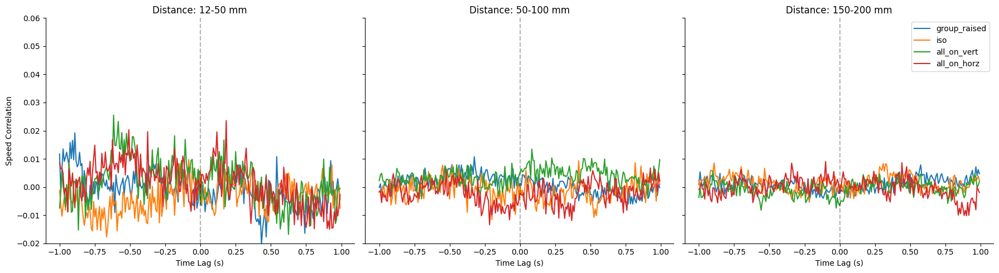

Randomly matched fish across experiments


In [ ]:
# Add a shuffle control where we match fish from opposite conditions at random
from scipy.signal import correlate
import random
# Parameters
dist_slices = [(12, 50), (50, 100), (150, 200)]
max_lag_sec = 1
lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))
exp_ids = occupancy_df['exp_id'].unique()
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
for ax, (d_min, d_max) in zip(axs, dist_slices):
    matching_results = []
    for con in conditions:
        subset = occupancy_df[occupancy_df['condition'] == con]
        for _, row in subset.iterrows():
            curr_exp = row['exp_id']
            v2of = row['vector_to_other_fish_smooth']
            vx_real_exp, vy_real_exp= row['vx_smooth'], row['vy_smooth']
            fish = row['focal_fish']
            not_fish = [i for i in range(len(vx_real_exp)) if i != fish]
            f_x = row['f_x_filt']
            f_y = row['f_y_filt']
            # 1. Instead of identifying nearest neighbor from same tank, randomly pick from all e
            #A.) Get a random experiment that isn't the current experiment
            other_exp = random.choice([exp for exp in exp_ids if exp != curr_exp])

            # pull random exp velocities
            vx_other_exp = occupancy_df[occupancy_df['exp_id'] == other_exp]['vx'].iloc[0]
            vy_other_exp = occupancy_df[occupancy_df['exp_id'] == other_exp]['vy'].iloc[0]

            # pull random exp locations
            f_x_other = occupancy_df[occupancy_df['exp_id'] == other_exp]['f_x_filt'].iloc[0]
            f_y_other = occupancy_df[occupancy_df['exp_id'] == other_exp]['f_y_filt'].iloc[0]

            # trim the longer array
            min_len = min(vx_real_exp.shape[1], vx_other_exp.shape[1])

            # Trim everything to min_len immediately
            vx_real_exp = vx_real_exp[:, :min_len]
            vy_real_exp = vy_real_exp[:, :min_len]
            f_x = f_x[:, :min_len]
            f_y = f_y[:, :min_len]

            vx_other_exp = vx_other_exp[:, :min_len]
            vy_other_exp = vy_other_exp[:, :min_len]
            f_x_other_all = f_x_other[:, :min_len] # Pull all first, then slice
            f_y_other_all = f_y_other[:, :min_len]

            # Use 'not_fish' for both position and velocity to keep them perfectly synced
            f_x_neighbors = f_x_other_all[not_fish, :]
            f_y_neighbors = f_y_other_all[not_fish, :]
            vx_neighbors = vx_other_exp[not_fish, :]
            vy_neighbors = vy_other_exp[not_fish, :]

            v2of_other = np.stack([(f_x_neighbors - f_x[fish]), (f_y_neighbors - f_y[fish])])

            other_neighbor_dists = np.linalg.norm(v2of_other, axis=0)
            nearest_idx = np.argmin(other_neighbor_dists, axis=0)
            dist_to_nearest = np.min(other_neighbor_dists, axis=0)

            # 2. Create MASK for this distance slice and also remove spurious high speeds from tracking erros
            speeds = np.sqrt(vx_other_exp**2 + vy_other_exp**2)  # shape (n_fish, n_frames)
            speed_mean = np.mean(speeds, axis=1, keepdims=True)
            speed_std  = np.std(speeds,  axis=1, keepdims=True)
            bad_frames = np.any(speeds > speed_mean + 5 * speed_std, axis=0)  # (n_frames,)
            mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) &  ~bad_frames

            if np.sum(mask) < (fps * 2): # Need at least 2 seconds of data in this slice
                continue

            # 3. Speeds
            speed_f = np.sqrt(vx_real_exp[fish]**2 + vy_real_exp[fish]**2)[mask]

            vx_neighbors = np.delete(vx_other_exp, fish, axis=0)
            vy_neighbors = np.delete(vy_other_exp, fish, axis=0)
            speeds_all_n = np.sqrt(vx_neighbors**2 + vy_neighbors**2)
            nearest_neighbor_speed = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()[mask]

            # 4. Normalize and Correlate
            # Use only the masked data for mean/std to avoid cross-distance contamination
            s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) + 1e-8)
            s_n = (nearest_neighbor_speed - np.mean(nearest_neighbor_speed)) / (np.std(nearest_neighbor_speed) + 1e-8)

            # Detrend data?
            s_f = detrend(s_f)
            s_n = detrend(s_n)

            corr = correlate(s_f, s_n, mode='same') / len(speed_f)

            center = len(corr) // 2
            corr_subset = corr[max(0, center + lags[0]) : min(len(corr), center + lags[-1] + 1)]

            # Pad if slice was too short for the lag window
            if len(corr_subset) < len(lags):
                continue

            matching_results.append({'condition': con, 'corr': corr_subset})

    # Plot for this distance bin
    for con in conditions:
        con_data = [r['corr'] for r in matching_results if r['condition'] == con]
        if len(con_data) > 0:
            ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

    ax.set_title(f'Distance: {d_min}-{d_max} mm')
    ax.axvline(0, color='k', linestyle='--', alpha=0.3)
    ax.set_xlabel('Time Lag (s)')
axs[0].set_ylabel('Speed Correlation')
sns.despine()
plt.ylim(-0.02,.06)
plt.legend()
plt.tight_layout()
plt.show()
print('Randomly matched fish across experiments')


### CROSS CORRELATION WITH UNIQUE PAIRS ###

In [ ]:
# Generate relative velocity and alignment heatmaps

# Plot heading alignment as a function of distance
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg
import cv2
from scipy.ndimage import gaussian_filter1d

load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
bin_length =0.009
occupancy_data = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    data_path_neighbors = metadata['processed_data_path_neighbor'].iloc[i]
    tech_rep = metadata['tech_rep'].iloc[i]
    if tech_rep !=1:
      continue
    data = np.load(data_path, allow_pickle=True)
    neighbor_data = np.load(data_path_neighbors, allow_pickle=True)

    fish_num = data['fish_num']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    if EllapsedTime[-1]<TimeThresh:
      continue
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]
    date = metadata['experiment_date'].iloc[i]
    scale = metadata['rig_mm'].iloc[i] / metadata['vid_px'].iloc[i]
    f_x,f_y = data['f_x'], data['f_y']
    ff_dist = neighbor_data['ff_dist']
    frame_num = len(f_x[0])
    f_body_length = data['f_bodylength_mm']
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = np.argmin(np.abs(EllapsedTime - AnalysisLength))
    end_idx = np.argmin(np.abs(EllapsedTime - TimeThresh))

    # Filter data of interest
    headings = ff_heading[:, start_idx:end_idx]
    ff_dist_filt = ff_dist[:, :,start_idx:end_idx]
    f_x_filt,f_y_filt = f_x[:,start_idx:end_idx],f_y[:,start_idx:end_idx]
    EllapsedTime_filt = EllapsedTime[start_idx:end_idx] - EllapsedTime[start_idx]

    # Compute velocities (mm/frame)
    vx = np.diff(f_x_filt, axis=1) * scale
    vy = np.diff(f_y_filt, axis=1) * scale

    # smooth velocity either by binning or filtering
    # vx_smooth = gaussian_filter1d(vx, sigma=fps * 0.005 , axis=1)
    # vy_smooth = gaussian_filter1d(vy, sigma=fps * 0.005 , axis=1)
    uniform_fps = 120.0
    uniform_time = np.arange(EllapsedTime_filt[0], EllapsedTime_filt[-1], 1 / uniform_fps)
    f_x_interp = np.zeros((fish_num, len(uniform_time)))
    f_y_interp = np.zeros((fish_num, len(uniform_time)))
    for fish_idx in range(fish_num):
      # 'cubic' handles curved movement best, but 'linear' is safer against overshooting
      fx_func = interp1d(EllapsedTime_filt, f_x_filt[fish_idx, :], kind='linear')
      fy_func = interp1d(EllapsedTime_filt, f_y_filt[fish_idx, :], kind='linear')

      f_x_interp[fish_idx, :] = fx_func(uniform_time)
      f_y_interp[fish_idx, :] = fy_func(uniform_time)

    vx_smooth = np.diff(f_x_interp, axis=1) * scale * uniform_fps
    vy_smooth = np.diff(f_y_interp, axis=1) * scale * uniform_fps

    # Pad to match shape (T)
    vx = np.concatenate([vx, vx[:, -1][:, None]], axis=1)
    vy = np.concatenate([vy, vy[:, -1][:, None]], axis=1)
    vx_smooth = np.concatenate([vx_smooth, vx_smooth[:, -1][:, None]], axis=1)
    vy_smooth =  np.concatenate([vy_smooth, vy_smooth[:, -1][:, None]], axis=1)

    for fish in range(fish_num):
      # Get focal fish distances to other fish
      foi_dist = ff_dist_filt[fish,:,:]
      foi_x = f_x_filt[fish,:]
      foi_y = f_y_filt[fish,:]
      foi_x_bin = f_x_interp[fish,:]
      foi_y_bin = f_y_interp[fish,:]
      # Get focal fish heading
      foi_heading = headings[fish]
      # Get non focal fish headings and positions
      non_foi_heading = np.delete(headings, fish, axis=0)
      non_foi_x = np.delete(f_x_filt, fish, axis=0)
      non_foi_y = np.delete(f_y_filt, fish, axis=0)
      non_foi_x_bin = np.delete(f_x_interp, fish, axis=0)
      non_foi_y_bin = np.delete(f_y_interp, fish, axis=0)

      # Get vector from focal fish to non_focal fish
      vec_array = np.array([(non_foi_x-foi_x), (non_foi_y-foi_y)])* scale  # Shape = (x or y,vector to other fish,frames) = (2,n_other fish ,n_frames)
      vec_array_smooth = np.array([(non_foi_x_bin-foi_x_bin), (non_foi_y_bin-foi_y_bin)])* scale
      occupancy_data.append({'condition': condition,
                             'scale': scale,
                             'focal_fish':fish,
                             'ff_heading':foi_heading,
                             'other_fish_heading':non_foi_heading,
                             'vector_to_other_fish': vec_array,
                             'vector_to_other_fish_smooth': vec_array_smooth,
                             'vx':vx,
                             'vy':vy,
                             'vx_smooth':vx_smooth,
                             'vy_smooth':vy_smooth,
                             'f_x_filt':f_x_filt,
                             'f_y_filt':f_y_filt,
                             'exp_id':exp_id})


occupancy_df = pd.DataFrame(occupancy_data)

In [ ]:
# ####Cross correlation analysis with unique pairs####
# from scipy.signal import correlate, detrend
# import random
# # Parameters
# dist_slices = [(5, 50), (50, 100), (150, 200)]
# max_lag_sec = 2
# fps = 120###NOTE THIS WILL CHANGE DEPENDING ON BIN LENGTH. RAW FPS  ~120
# lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))
# cons = occupancy_df['condition'].unique()
# fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
# current_experiment = 'nothing'
# for ax, (d_min, d_max) in zip(axs, dist_slices):
#     matching_results = []
#     for con in cons:
#         subset = occupancy_df[occupancy_df['condition'] == con]

#         for _, row in subset.iterrows():
#             v2of = row['vector_to_other_fish_smooth']
#             vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
#             fish = row['focal_fish']
#             # # Eliminate double counting of pairs by only counting first two fish
#             # new_experiment = row['exp_id']

#             # 1. Identify Nearest Neighbor and Distance
#             all_neighbor_dists = np.linalg.norm(v2of, axis=0)
#             nearest_idx = np.argmin(all_neighbor_dists, axis=0)
#             dist_to_nearest = np.min(all_neighbor_dists, axis=0)

#             # Map relative index back to absolute fish IDs ---
#             # If the neighbor's index in the filtered array is >= the focal fish's ID,
#             # its true ID is shifted by +1.
#             actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)

#             # Unique Pair Mask ---
#             # This assigns "responsibility" for the calculation to the fish with the lower ID.
#             # If Fish 0 and Fish 2 are closest, Fish 0 calculates it (0 < 2). Fish 2 skips it (2 is not < 0).
#             unique_pair_mask = fish < actual_neighbor_ids

#             # 2. Create MASK for this distance slice
#             speeds = np.sqrt(vx_all**2 + vy_all**2)
#             speed_mean = np.mean(speeds, axis=1, keepdims=True)
#             speed_std  = np.std(speeds,  axis=1, keepdims=True)
#             bad_frames = np.any(speeds > speed_mean + 5 * speed_std, axis=0)

#             # Combine all conditions, including our new symmetry-breaker
#             mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

#             if np.sum(mask) < (fps * 2): # Need at least 2 seconds of data in this slice
#                 continue

#             # 3. Speeds
#             speed_f = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)[mask]

#             vx_neighbors = np.delete(vx_all, fish, axis=0)
#             vy_neighbors = np.delete(vy_all, fish, axis=0)
#             speeds_all_n = np.sqrt(vx_neighbors**2 + vy_neighbors**2)
#             nearest_neighbor_speed = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()[mask]

#             # 4. Normalize and Correlate
#             # Detrend data?
#             speed_f = detrend(speed_f)
#             nearest_neighbor_speed = detrend(nearest_neighbor_speed)
#             # Use only the masked data for mean/std to avoid cross-distance contamination
#             s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) + 1e-8)
#             s_n = (nearest_neighbor_speed - np.mean(nearest_neighbor_speed)) / (np.std(nearest_neighbor_speed) + 1e-8)



#             corr = correlate(s_f, s_n, mode='same') #/ len(speed_f)
#             corr /= (np.sqrt(np.sum(s_f**2) * np.sum(s_n**2)) + 1e-8)

#             center = len(corr) // 2
#             corr_subset = corr[max(0, center + lags[0]) : min(len(corr), center + lags[-1] + 1)]

#             # Pad if slice was too short for the lag window
#             if len(corr_subset) < len(lags):
#                 continue

#             matching_results.append({'condition': con, 'corr': corr_subset})

#     # Plot for this distance bin
#     for con in cons:
#         con_data = [r['corr'] for r in matching_results if r['condition'] == con]
#         if len(con_data) > 0:
#             ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

#     ax.set_title(f'Distance: {d_min}-{d_max} mm')
#     ax.axvline(0, color='k', linestyle='--', alpha=0.3)
#     ax.set_xlabel('Time Lag (s)')
# axs[0].set_ylabel('Speed Correlation')
# sns.despine()
# plt.legend()
# plt.tight_layout()
# plt.show()

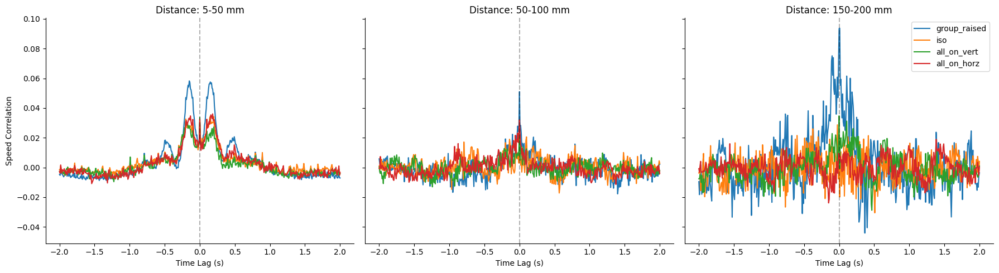

In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
dist_slices = [(5, 50), (50, 100), (150, 200)]
max_lag_sec = 2
fps = 120
max_lag_frames = int(max_lag_sec * fps)
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Bout Requirements
min_bout_sec = 2.1 # Must be strictly > max_lag_sec to allow for overlap!
min_bout_frames = int(min_bout_sec * fps)

cons = occupancy_df['condition'].unique()
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, (d_min, d_max) in zip(axs, dist_slices):
    matching_results = []

    for con in cons:
        subset = occupancy_df[occupancy_df['condition'] == con]

        for _, row in subset.iterrows():
            v2of = row['vector_to_other_fish_smooth']
            vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
            fish = row['focal_fish']

            # 1. Identify Nearest Neighbor and Distance
            all_neighbor_dists = np.linalg.norm(v2of, axis=0)
            nearest_idx = np.argmin(all_neighbor_dists, axis=0)
            dist_to_nearest = np.min(all_neighbor_dists, axis=0)

            # Unique Pair Mapping
            actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)
            unique_pair_mask = fish < actual_neighbor_ids

            # 2. Speeds & Outlier Detection
            speeds_all = np.sqrt(vx_all**2 + vy_all**2)
            speed_mean = np.mean(speeds_all, axis=1, keepdims=True)
            speed_std  = np.std(speeds_all,  axis=1, keepdims=True)
            bad_frames = np.any(speeds_all > speed_mean + 5 * speed_std, axis=0)

            # Combine all states into one continuous Boolean mask
            valid_mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

            # 3. THE MAGIC: Find contiguous bouts where the mask is True
            # Pad with False at both ends to ensure we catch bouts touching the edges
            padded = np.concatenate(([False], valid_mask, [False]))
            diffs = np.diff(padded.astype(int))
            starts = np.where(diffs == 1)[0]
            ends = np.where(diffs == -1)[0]

            # 4. Extract continuous target arrays
            speed_f_full = speeds_all[fish]
            speeds_all_n = np.delete(speeds_all, fish, axis=0)
            speed_n_full = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()

            # 5. Process each valid bout individually
            for start, end in zip(starts, ends):
                bout_length = end - start

                # Only proceed if the fish stayed in this state long enough
                if bout_length >= min_bout_frames:

                    # Extract the unbroken, continuous timeline
                    s_f = speed_f_full[start:end]
                    s_n = speed_n_full[start:end]

                    # Detrend and Z-score
                    s_f = detrend(s_f)
                    s_n = detrend(s_n)
                    s_f = (s_f - np.mean(s_f)) / (np.std(s_f) + 1e-8)
                    s_n = (s_n - np.mean(s_n)) / (np.std(s_n) + 1e-8)

                    # Mathematically sound full correlation
                    corr = correlate(s_f, s_n, mode='full')

                    # Extract the specific lag window
                    center = len(corr) // 2
                    corr_subset = corr[center - max_lag_frames : center + max_lag_frames + 1]

                    # Unbiased normalization: accounts for fewer overlapping frames at larger lags
                    overlaps = bout_length - np.abs(lags)
                    corr_subset /= bout_length

                    matching_results.append({'condition': con, 'corr': corr_subset})

    # Plotting for this distance bin
    for con in cons:
        con_data = [r['corr'] for r in matching_results if r['condition'] == con]
        if len(con_data) > 0:
            ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

    ax.set_title(f'Distance: {d_min}-{d_max} mm')
    ax.axvline(0, color='k', linestyle='--', alpha=0.3)
    ax.set_xlabel('Time Lag (s)')

axs[0].set_ylabel('Speed Correlation')
sns.despine()
plt.legend()
plt.tight_layout()
plt.show()

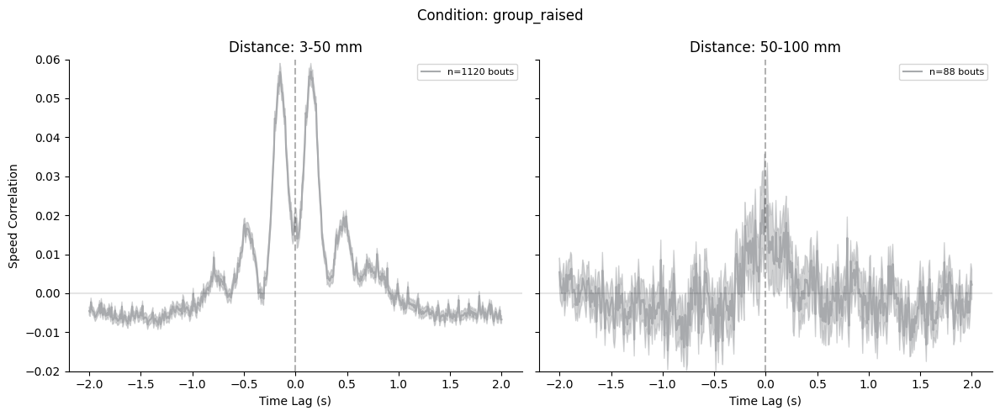

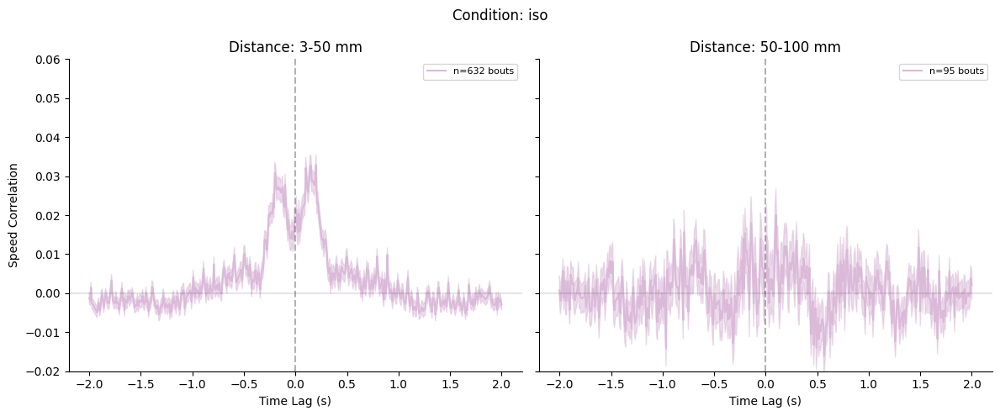

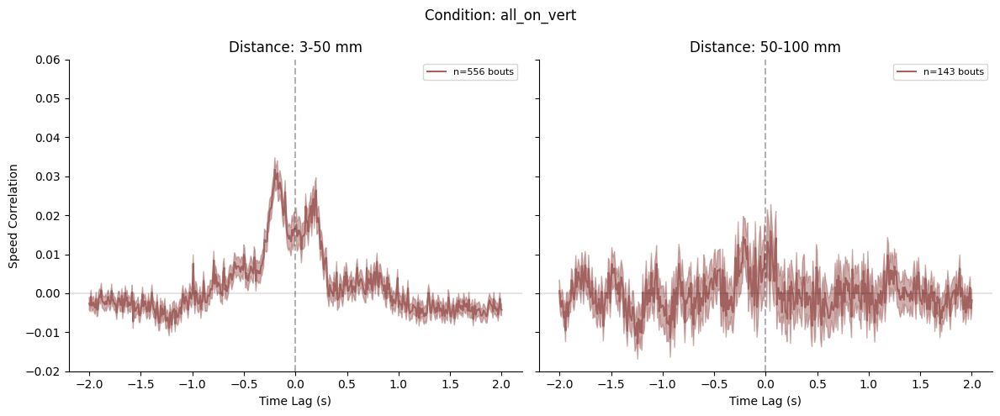

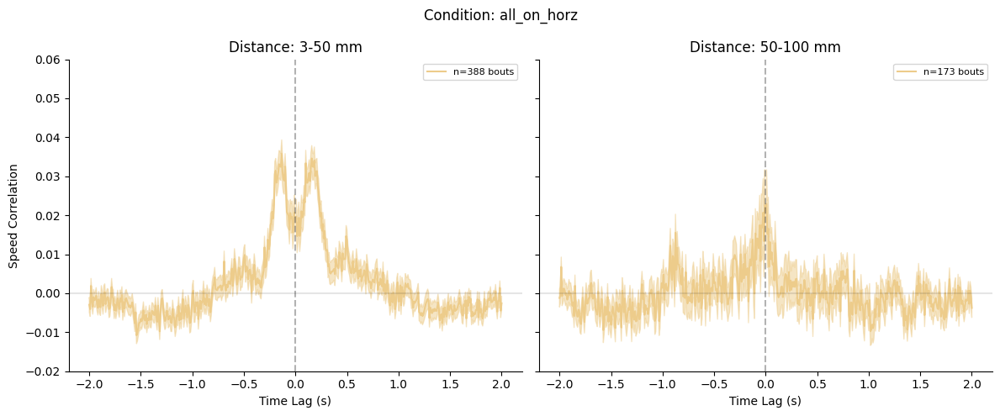

In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
dist_slices = [(3, 50), (50, 100)]
max_lag_sec = 2
fps = 120
max_lag_frames = int(max_lag_sec * fps)
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Bout Requirements
min_bout_sec = 2.01
min_bout_frames = int(min_bout_sec * fps)

cons = occupancy_df['condition'].unique()

for con in cons:
    fig, axs = plt.subplots(1, len(dist_slices), figsize=(12, 5), sharey=True)
    fig.suptitle(f'Condition: {con}')
    subset = occupancy_df[occupancy_df['condition'] == con]

    for ax, (d_min, d_max) in zip(axs, dist_slices):
        matching_results = []  # ← reset per distance bin

        for _, row in subset.iterrows():
            v2of = row['vector_to_other_fish_smooth']
            vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
            fish = row['focal_fish']

            # 1. Identify Nearest Neighbor and Distance
            all_neighbor_dists = np.linalg.norm(v2of, axis=0)
            nearest_idx = np.argmin(all_neighbor_dists, axis=0)
            dist_to_nearest = np.min(all_neighbor_dists, axis=0)

            # Unique Pair Mapping
            actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)
            unique_pair_mask = fish < actual_neighbor_ids

            # 2. Speeds & Outlier Detection
            speeds_all = np.sqrt(vx_all**2 + vy_all**2)
            speed_mean = np.mean(speeds_all, axis=1, keepdims=True)
            speed_std  = np.std(speeds_all,  axis=1, keepdims=True)
            bad_frames = np.any(speeds_all > speed_mean + 5 * speed_std, axis=0)

            # Combine all states into one continuous Boolean mask
            valid_mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

            # 3. Find contiguous bouts where the mask is True
            padded = np.concatenate(([False], valid_mask, [False]))
            diffs = np.diff(padded.astype(int))
            starts = np.where(diffs == 1)[0]
            ends = np.where(diffs == -1)[0]

            # 4. Extract continuous target arrays
            speed_f_full = speeds_all[fish]
            speed_n_full = speeds_all[actual_neighbor_ids, np.arange(speeds_all.shape[1])]

            # 5. Process each valid bout individually
            for start, end in zip(starts, ends):
                bout_length = end - start

                if bout_length >= min_bout_frames:
                    s_f = speed_f_full[start:end]
                    s_n = speed_n_full[start:end]

                    s_f = detrend(s_f)
                    s_n = detrend(s_n)
                    s_f = (s_f - np.mean(s_f)) / (np.std(s_f) + 1e-8)
                    s_n = (s_n - np.mean(s_n)) / (np.std(s_n) + 1e-8)

                    corr = correlate(s_f, s_n, mode='full')
                    center = len(corr) // 2
                    corr_subset = corr[center - max_lag_frames : center + max_lag_frames + 1]
                    corr_subset /= bout_length

                    matching_results.append({'fish_id': row['focal_fish'], 'corr': corr_subset})

        # Plotting for this distance bin
        if len(matching_results) > 0:
            all_corrs = np.array([r['corr'] for r in matching_results])
            mean_corr = np.mean(all_corrs, axis=0)
            sem_corr = np.std(all_corrs, axis=0) / np.sqrt(len(all_corrs))

            plot_lags = lags.copy().astype(float)
            mean_corr[lags == 0] = np.nan  # censor lag=0 artifact

            ax.plot(plot_lags / fps, mean_corr, label=f'n={len(matching_results)} bouts',color=imprinting_color_pal[con])
            ax.fill_between(plot_lags / fps, mean_corr - sem_corr, mean_corr + sem_corr, alpha=0.5,color=imprinting_color_pal[con])

        ax.set_title(f'Distance: {d_min}-{d_max} mm')
        ax.axvline(0, color='k', linestyle='--', alpha=0.3)
        ax.axhline(0, color='k', linestyle='-', alpha=0.1)
        ax.set_xlabel('Time Lag (s)')
        ax.legend(fontsize=8)

    axs[0].set_ylabel('Speed Correlation')
    sns.despine()
    plt.tight_layout()
    plt.ylim(-0.02,.06)

    fig_name = f'speed_cross-correlation_{con}.svg'
    if SAVE_FIG:
      plt.savefig(figure_savepath+'/'+f'{fig_name}', format='svg')
    plt.show()


In [ ]:
# # Add a shuffle control where we match fish from opposite conditions at random
# from scipy.signal import correlate
# import random
# # Parameters
# dist_slices = [(5, 50), (50, 100), (150, 200)]
# max_lag_sec = 1
# lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))
# exp_ids = occupancy_df['exp_id'].unique()
# fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
# for ax, (d_min, d_max) in zip(axs, dist_slices):
#     matching_results = []
#     for con in cons:
#         subset = occupancy_df[occupancy_df['condition'] == con]
#         for _, row in subset.iterrows():
#             curr_exp = row['exp_id']
#             v2of = row['vector_to_other_fish_smooth']
#             vx_real_exp, vy_real_exp= row['vx_smooth'], row['vy_smooth']
#             fish = row['focal_fish']
#             not_fish = [i for i in range(len(vx_real_exp)) if i != fish]
#             f_x = row['f_x_filt']
#             f_y = row['f_y_filt']
#             # 1. Instead of identifying nearest neighbor from same tank, randomly pick from all e
#             #A.) Get a random experiment that isn't the current experiment
#             other_exp = random.choice([exp for exp in exp_ids if exp != curr_exp])

#             # pull random exp velocities
#             vx_other_exp = occupancy_df[occupancy_df['exp_id'] == other_exp]['vx'].iloc[0]
#             vy_other_exp = occupancy_df[occupancy_df['exp_id'] == other_exp]['vy'].iloc[0]

#             # pull random exp locations
#             f_x_other = occupancy_df[occupancy_df['exp_id'] == other_exp]['f_x_filt'].iloc[0]
#             f_y_other = occupancy_df[occupancy_df['exp_id'] == other_exp]['f_y_filt'].iloc[0]

#             # trim the longer array
#             min_len = min(vx_real_exp.shape[1], vx_other_exp.shape[1])

#             # Trim everything to min_len immediately
#             vx_real_exp = vx_real_exp[:, :min_len]
#             vy_real_exp = vy_real_exp[:, :min_len]
#             f_x = f_x[:, :min_len]
#             f_y = f_y[:, :min_len]

#             vx_other_exp = vx_other_exp[:, :min_len]
#             vy_other_exp = vy_other_exp[:, :min_len]
#             f_x_other_all = f_x_other[:, :min_len] # Pull all first, then slice
#             f_y_other_all = f_y_other[:, :min_len]

#             # Use 'not_fish' for both position and velocity to keep them perfectly synced
#             f_x_neighbors = f_x_other_all[not_fish, :]
#             f_y_neighbors = f_y_other_all[not_fish, :]
#             vx_neighbors = vx_other_exp[not_fish, :]
#             vy_neighbors = vy_other_exp[not_fish, :]

#             v2of_other = np.stack([(f_x_neighbors - f_x[fish]), (f_y_neighbors - f_y[fish])])

#             other_neighbor_dists = np.linalg.norm(v2of_other, axis=0)
#             nearest_idx = np.argmin(other_neighbor_dists, axis=0)
#             actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)
#             unique_pair_mask = fish < actual_neighbor_ids

#             dist_to_nearest = np.min(other_neighbor_dists, axis=0)

#             # 2. Create MASK for this distance slice and also remove spurious high speeds from tracking erros
#             speeds = np.sqrt(vx_other_exp**2 + vy_other_exp**2)  # shape (n_fish, n_frames)
#             speed_mean = np.mean(speeds, axis=1, keepdims=True)
#             speed_std  = np.std(speeds,  axis=1, keepdims=True)
#             bad_frames = np.any(speeds > speed_mean + 5 * speed_std, axis=0)  # (n_frames,)
#             mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

#             if np.sum(mask) < (fps * 2): # Need at least 2 seconds of data in this slice
#                 continue

#             # 3. Speeds
#             speed_f = np.sqrt(vx_real_exp[fish]**2 + vy_real_exp[fish]**2)[mask]

#             vx_neighbors = np.delete(vx_other_exp, fish, axis=0)
#             vy_neighbors = np.delete(vy_other_exp, fish, axis=0)
#             speeds_all_n = np.sqrt(vx_neighbors**2 + vy_neighbors**2)
#             nearest_neighbor_speed = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()[mask]

#             # 4. Normalize and Correlate
#             # Use only the masked data for mean/std to avoid cross-distance contamination
#             s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) + 1e-8)
#             s_n = (nearest_neighbor_speed - np.mean(nearest_neighbor_speed)) / (np.std(nearest_neighbor_speed) + 1e-8)

#             # Detrend data?
#             s_f = detrend(s_f)
#             s_n = detrend(s_n)

#             corr = correlate(s_f, s_n, mode='same') #/ len(speed_f)
#             corr /= (np.sqrt(np.sum(s_f**2) * np.sum(s_n**2)) + 1e-8)

#             center = len(corr) // 2
#             corr_subset = corr[max(0, center + lags[0]) : min(len(corr), center + lags[-1] + 1)]

#             # Pad if slice was too short for the lag window
#             if len(corr_subset) < len(lags):
#                 continue

#             matching_results.append({'condition': con, 'corr': corr_subset})

#     # Plot for this distance bin
#     for con in cons:
#         con_data = [r['corr'] for r in matching_results if r['condition'] == con]
#         if len(con_data) > 0:
#             ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

#     ax.set_title(f'Distance: {d_min}-{d_max} mm')
#     ax.axvline(0, color='k', linestyle='--', alpha=0.3)
#     ax.set_xlabel('Time Lag (s)')
# axs[0].set_ylabel('Speed Correlation')
# sns.despine()
# plt.ylim(-0.02,.06)
# plt.legend()
# plt.tight_layout()
# plt.show()
# print('Randomly matched fish across experiments')


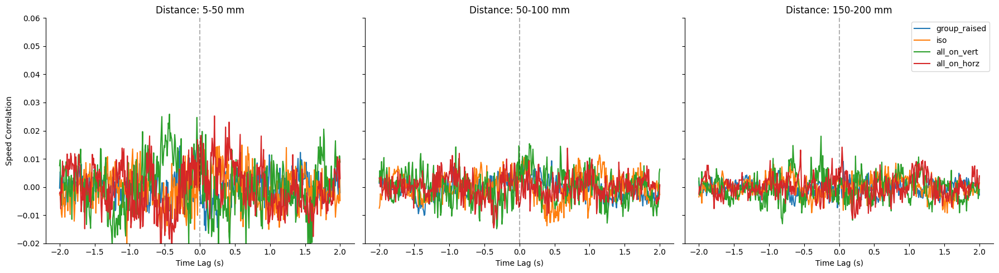

Randomly matched fish across experiments with 30 shuffles


In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

# Parameters
dist_slices = [(5, 50), (50, 100), (150, 200)]
fps = 120
max_lag_sec = 2
max_lag_frames = int(max_lag_sec * fps)
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Bout Requirements
min_bout_sec = 2.5
min_bout_frames = int(min_bout_sec * fps)

# Number of random shuffles to perform per fish
n_shuffles = 30  #

exp_ids = occupancy_df['exp_id'].unique()
cons = occupancy_df['condition'].unique()
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, (d_min, d_max) in zip(axs, dist_slices):
    matching_results = []

    for con in cons:
        subset = occupancy_df[occupancy_df['condition'] == con]

        for _, row in subset.iterrows():
            curr_exp = row['exp_id']
            vx_real_exp, vy_real_exp = row['vx_smooth'], row['vy_smooth']
            fish = row['focal_fish']
            not_fish = [i for i in range(len(vx_real_exp)) if i != fish]
            f_x = row['f_x_filt']
            f_y = row['f_y_filt']

            # --- SHUFFLE LOOP ---
            for shuffle_idx in range(n_shuffles):

                # Grab a random experiment that isn't the current one
                other_exp = random.choice([exp for exp in exp_ids if exp != curr_exp])

                # Pull data
                vx_other_exp = occupancy_df[occupancy_df['exp_id'] == other_exp]['vx_smooth'].iloc[0]
                vy_other_exp = occupancy_df[occupancy_df['exp_id'] == other_exp]['vy_smooth'].iloc[0]
                f_x_other = occupancy_df[occupancy_df['exp_id'] == other_exp]['f_x_filt'].iloc[0]
                f_y_other = occupancy_df[occupancy_df['exp_id'] == other_exp]['f_y_filt'].iloc[0]

                # Sync lengths
                min_len = min(vx_real_exp.shape[1], vx_other_exp.shape[1])

                vx_real_sliced = vx_real_exp[:, :min_len]
                vy_real_sliced = vy_real_exp[:, :min_len]
                f_x_sliced = f_x[:, :min_len]
                f_y_sliced = f_y[:, :min_len]

                vx_other_sliced = vx_other_exp[:, :min_len]
                vy_other_sliced = vy_other_exp[:, :min_len]
                f_x_other_all = f_x_other[:, :min_len]
                f_y_other_all = f_y_other[:, :min_len]

                # Map ghost neighbor
                f_x_neighbors = f_x_other_all[not_fish, :]
                f_y_neighbors = f_y_other_all[not_fish, :]
                vx_neighbors = vx_other_sliced[not_fish, :]
                vy_neighbors = vy_other_sliced[not_fish, :]

                v2of_other = np.stack([(f_x_neighbors - f_x_sliced[fish]), (f_y_neighbors - f_y_sliced[fish])])
                other_neighbor_dists = np.linalg.norm(v2of_other, axis=0)
                nearest_idx = np.argmin(other_neighbor_dists, axis=0)

                dist_to_nearest = np.min(other_neighbor_dists, axis=0)

                # Outlier removal
                speeds = np.sqrt(vx_other_sliced**2 + vy_other_sliced**2)
                speed_mean = np.mean(speeds, axis=1, keepdims=True)
                speed_std  = np.std(speeds,  axis=1, keepdims=True)
                bad_frames = np.any(speeds > speed_mean + 5 * speed_std, axis=0)

                valid_mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames

                if np.sum(valid_mask) < min_bout_frames:
                    continue

                # Speeds
                speed_f_full = np.sqrt(vx_real_sliced[fish]**2 + vy_real_sliced[fish]**2)

                vx_ghost_neighbors = np.delete(vx_other_sliced, fish, axis=0)
                vy_ghost_neighbors = np.delete(vy_other_sliced, fish, axis=0)
                speeds_all_ghost_n = np.sqrt(vx_ghost_neighbors**2 + vy_ghost_neighbors**2)
                nearest_neighbor_speed_full = np.take_along_axis(speeds_all_ghost_n, nearest_idx[None, :], axis=0).flatten()

                # Find bouts
                padded = np.concatenate(([False], valid_mask, [False]))
                diffs = np.diff(padded.astype(int))
                starts = np.where(diffs == 1)[0]
                ends = np.where(diffs == -1)[0]

                for start, end in zip(starts, ends):
                    bout_length = end - start

                    if bout_length >= min_bout_frames:
                        s_f = speed_f_full[start:end]
                        s_n = nearest_neighbor_speed_full[start:end]

                        # Detrend first, then Z-score!
                        s_f = detrend(s_f)
                        s_n = detrend(s_n)
                        s_f = (s_f - np.mean(s_f)) / (np.std(s_f) + 1e-8)
                        s_n = (s_n - np.mean(s_n)) / (np.std(s_n) + 1e-8)

                        # Core correlation
                        corr = correlate(s_f, s_n, mode='full')
                        center = len(corr) // 2
                        corr_subset = corr[center - max_lag_frames : center + max_lag_frames + 1]

                        # Biased normalization (smoother edges)
                        corr_subset /= bout_length

                        matching_results.append({'condition': con, 'corr': corr_subset})

    # Plotting for this distance bin
    for con in cons:
        con_data = [r['corr'] for r in matching_results if r['condition'] == con]
        if len(con_data) > 0:
            ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

    ax.set_title(f'Distance: {d_min}-{d_max} mm')
    ax.axvline(0, color='k', linestyle='--', alpha=0.3)
    ax.set_xlabel('Time Lag (s)')

axs[0].set_ylabel('Speed Correlation')
sns.despine()
plt.ylim(-0.02, 0.06)
plt.legend()
plt.tight_layout()
plt.show()
print(f'Randomly matched fish across experiments with {n_shuffles} shuffles')

### AUTOCORRELATION ###

### BURST TIMES ###

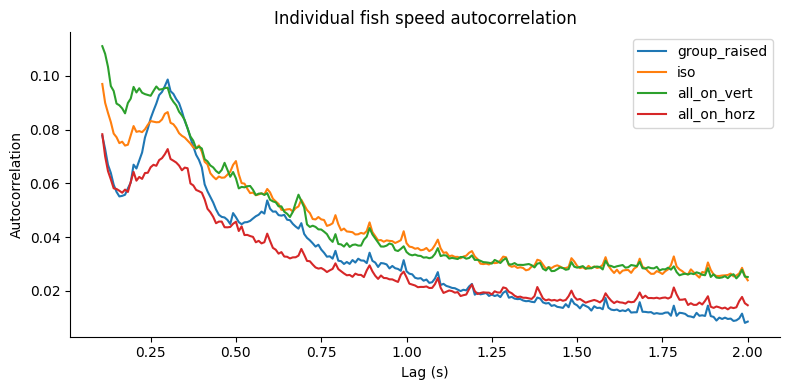

In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

max_lag_sec = 2
fps = 120
max_lag_frames = int(max_lag_sec * fps)

autocorr_results = []

for _, row in occupancy_df.iterrows():
    fish = row['focal_fish']
    vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
    con = row['condition']

    # 1. Compute speed and assign directly to 's'
    s = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)

    # Skip processing if data is too short
    if len(s) <= max_lag_frames:
        continue

    # 2.Detrend first, then Z-score!
    s = detrend(s)
    s = (s - np.mean(s)) / (np.std(s) + 1e-8)

    # 3.full autocorrelation
    ac = correlate(s, s, mode='full')

    # Extract the center (lag 0 is always directly in the center of a full correlation)
    center = len(ac) // 2

    # Slice only the portion of the correlation within our max lag window
    ac_subset = ac[center - max_lag_frames : center + max_lag_frames + 1]

    # Normalize so that lag 0 yields a value of 1.0
    ac_subset = ac_subset / ac_subset[max_lag_frames]

    autocorr_results.append({'condition': con, 'ac': ac_subset, 'fish': fish})

# Reconstruct the proper lag indices matching our sliced array
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Plotting
# Keep only positive lags and ignore the massive spike at lag 0 to see the subtle burst rhythms!
lag_mask = (lags > int(0.1 * fps)) & (lags <= max_lag_frames)

fig, ax = plt.subplots(figsize=(8, 4))
for con in occupancy_df['condition'].unique():
    con_data = [r['ac'] for r in autocorr_results if r['condition'] == con]
    if len(con_data) > 0:
        # Plot time on X-axis instead of raw frame lag
        ax.plot(lags[lag_mask] / fps, np.mean(con_data, axis=0)[lag_mask], label=con)

ax.set_xlabel('Lag (s)')
ax.set_ylabel('Autocorrelation')
ax.set_title('Individual fish speed autocorrelation')
sns.despine()
plt.legend()
plt.tight_layout()
plt.show()

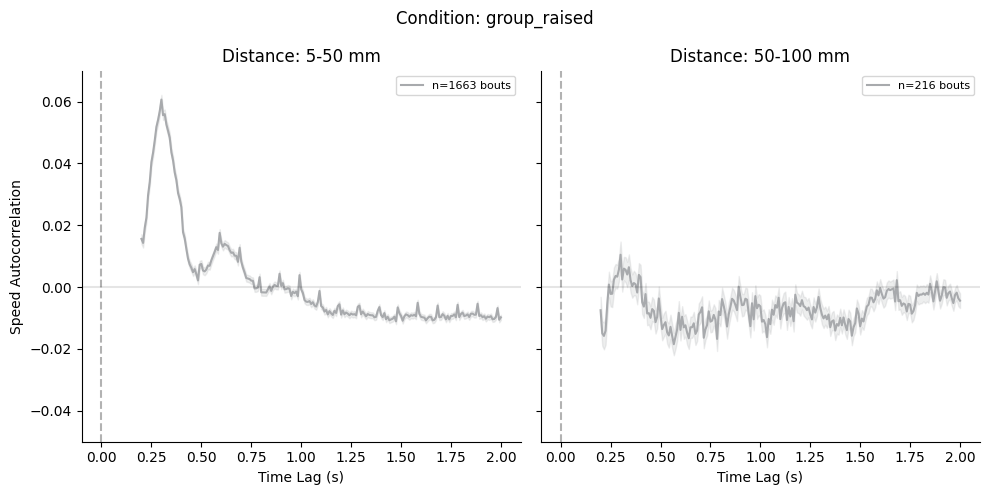

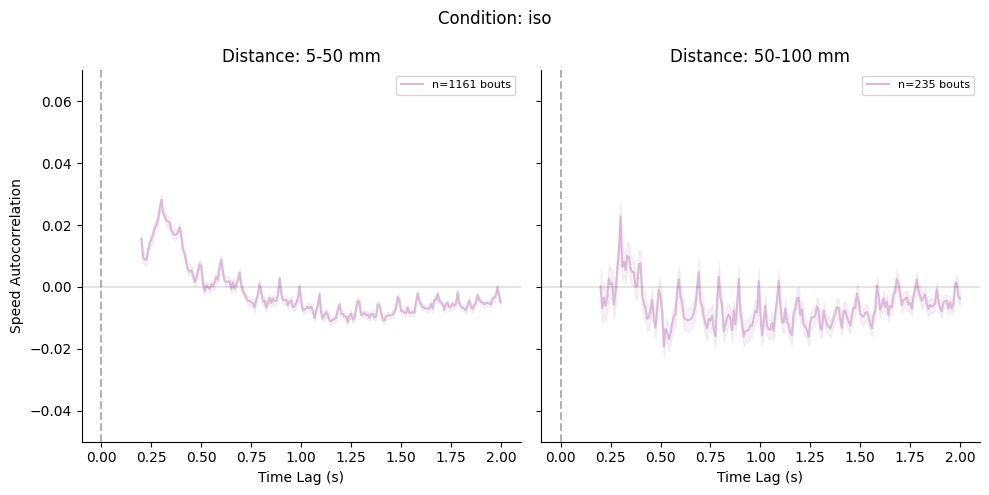

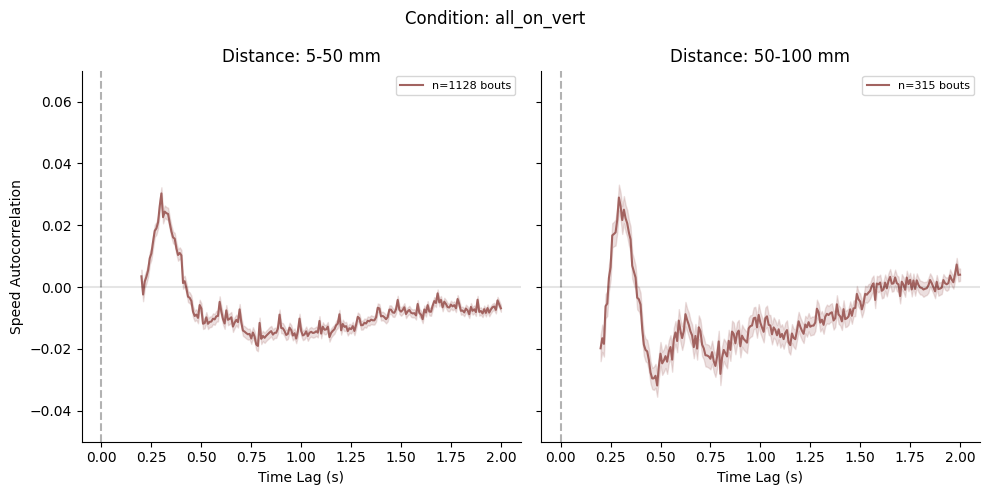

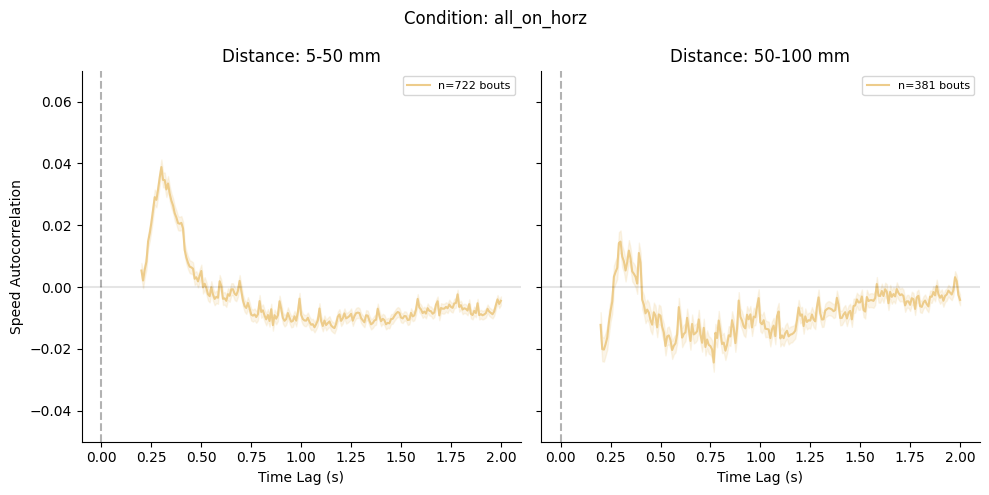

In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
dist_slices = [(5, 50), (50, 100)]
max_lag_sec = 2
fps = 120
max_lag_frames = int(max_lag_sec * fps)
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Bout Requirements
min_bout_sec = 2.01
min_bout_frames = int(min_bout_sec * fps)
lag_mask = lags >= int(0.2 * fps)

cons = occupancy_df['condition'].unique()

for con in cons:
    fig, axs = plt.subplots(1, len(dist_slices), figsize=(10, 5), sharey=True)
    fig.suptitle(f'Condition: {con}')
    subset = occupancy_df[occupancy_df['condition'] == con]

    for ax, (d_min, d_max) in zip(axs, dist_slices):
        matching_results = []

        for _, row in subset.iterrows():
            v2of = row['vector_to_other_fish_smooth']
            vx_all, vy_all = row['vx_smooth'], row['vy_smooth']
            fish = row['focal_fish']

            # 1. Identify Nearest Neighbor and Distance
            all_neighbor_dists = np.linalg.norm(v2of, axis=0)
            nearest_idx = np.argmin(all_neighbor_dists, axis=0)
            dist_to_nearest = np.min(all_neighbor_dists, axis=0)

            # 2. Speeds & Outlier Detection
            speeds_all = np.sqrt(vx_all**2 + vy_all**2)
            speed_mean = np.mean(speeds_all, axis=1, keepdims=True)
            speed_std  = np.std(speeds_all,  axis=1, keepdims=True)
            bad_frames = np.any(speeds_all > speed_mean + 5 * speed_std, axis=0)

            # No unique_pair_mask needed for autocorrelation
            valid_mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames

            # 3. Find contiguous bouts
            padded = np.concatenate(([False], valid_mask, [False]))
            diffs = np.diff(padded.astype(int))
            starts = np.where(diffs == 1)[0]
            ends = np.where(diffs == -1)[0]

            # 4. Focal fish speed only
            speed_f_full = speeds_all[fish]

            # 5. Process each valid bout
            for start, end in zip(starts, ends):
                bout_length = end - start
                if bout_length >= min_bout_frames:
                    s_f = speed_f_full[start:end]
                    s_f = detrend(s_f)
                    s_f = (s_f - np.mean(s_f)) / (np.std(s_f) + 1e-8)

                    corr = correlate(s_f, s_f, mode='full')
                    center = len(corr) // 2
                    corr_subset = corr[center - max_lag_frames : center + max_lag_frames + 1]
                    corr_subset /= bout_length

                    matching_results.append({'fish_id': fish, 'corr': corr_subset})

        # Plot for this distance bin
        if len(matching_results) > 0:
            all_corrs = np.array([r['corr'] for r in matching_results])
            mean_corr = np.mean(all_corrs, axis=0)
            sem_corr = np.std(all_corrs, axis=0) / np.sqrt(len(all_corrs))

            ax.plot(lags[lag_mask] / fps, mean_corr[lag_mask], label=f'n={len(matching_results)} bouts',color=imprinting_color_pal[con])
            ax.fill_between(lags[lag_mask] / fps,
                            (mean_corr - sem_corr)[lag_mask],
                            (mean_corr + sem_corr)[lag_mask],
                            alpha=0.2,
                            color=imprinting_color_pal[con])

        ax.set_title(f'Distance: {d_min}-{d_max} mm')
        ax.axvline(0, color='k', linestyle='--', alpha=0.3)
        ax.axhline(0, color='k', linestyle='-', alpha=0.1)
        ax.set_xlabel('Time Lag (s)')
        ax.legend(fontsize=8)
        ax.set_ylim(-0.05, 0.07)
    axs[0].set_ylabel('Speed Autocorrelation')
    sns.despine()
    plt.tight_layout()
    fig_name = f'autocorrelation_{con}.svg'
    if SAVE_FIG:
      plt.savefig(figure_savepath+'/'+f'{fig_name}', format='svg')
    plt.show()

In [ ]:
# from scipy.signal import find_peaks
# from scipy.signal import savgol_filter
# #def calculate_ibi(occupancy_df, fps=60):
# ibi_results = []

# for _, row in occupancy_df.iterrows():
#     vx, vy = row['vx'], row['vy']
#     con = row['condition']

#     # Calculate speed for each fish in the tank
#     for i in range(vx.shape[0]):
#         speed = np.sqrt(vx[i]**2 + vy[i]**2)
#         # detrend speed
#         speed = detrend(speed)
#         # 1. Clean data (use the same logic as your correlation code)
#         speed_mean = np.mean(speed)
#         speed_std = np.std(speed)
#         speed[speed > speed_mean + 4*speed_std] = speed_mean
#         smoothed_speed = savgol_filter(speed, window_length=25, polyorder=3)
#         # 2. Find Bursts (Local Maxima)
#         # height: must be above average speed
#         # distance: pulses usually don't happen faster than 10Hz (6 frames)
#         peaks, _ = find_peaks(smoothed_speed, height=speed_mean + 0.75*speed_std, distance=16)

#         if len(peaks) > 1:
#             # 3. Calculate intervals in seconds
#             intervals = np.diff(peaks) / fps
#             # Filter for realistic IBI (e.g., 0.1s to 1.0s)
#             intervals = intervals[(intervals > 0.01) & (intervals < 1.0)]

#             for val in intervals:
#                 ibi_results.append({'condition': con, 'ibi': val})

# ibi_df = pd.DataFrame(ibi_results)

# # Plot
# plt.figure(figsize=(10, 5))
# sns.histplot(data=ibi_df, x='ibi', hue='condition', element='step', kde=True,stat='probability')
# plt.axvline(0.3, color='k', linestyle='--', label='Predicted Interval (0.3s)')
# plt.title('Natural Swimming Rhythm (Inter-Burst Interval)')
# plt.xlabel('Time between Bursts (s)')
# plt.legend()
# plt.show()

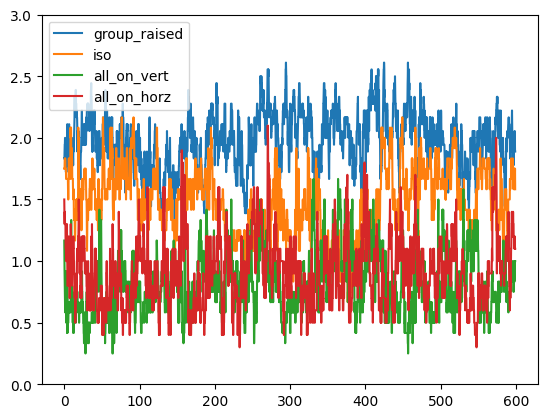

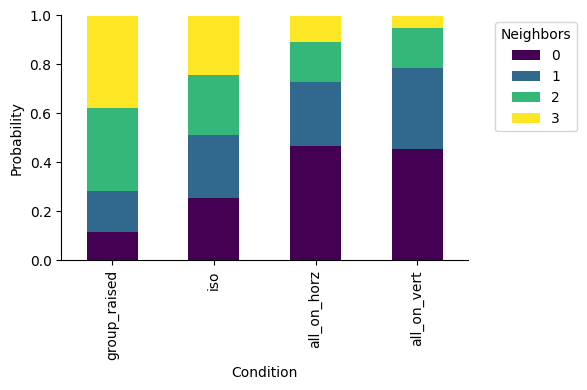

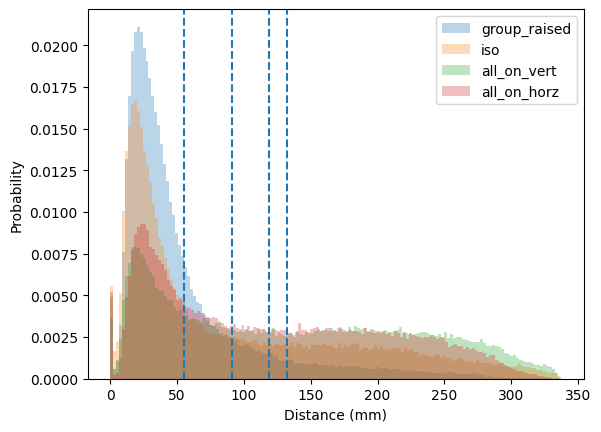

In [ ]:
# Let's try to figure out how frequently the fish are in singletons, dyads, triads, quatrads(?)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg
import cv2
SAVE_FIG = True
load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
DistanceThreshold = 50 #distance threshold in mm for interaction
binLength = 0.2 #bin length in seconds
neighbor_info = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    data_path_neighbors = metadata['processed_data_path_neighbor'].iloc[i]
    tech_rep = metadata['tech_rep'].iloc[i]
    if tech_rep !=1:
      continue
    data = np.load(data_path, allow_pickle=True)
    neighbor_data = np.load(data_path_neighbors, allow_pickle=True)

    fish_num = data['fish_num']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    if EllapsedTime[-1]<TimeThresh:
      continue
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]
    date = metadata['experiment_date'].iloc[i]
    scale = metadata['rig_mm'].iloc[i] / metadata['vid_px'].iloc[i]
    f_x,f_y = data['f_x'], data['f_y']
    ff_dist = neighbor_data['ff_dist']
    frame_num = len(f_x[0])
    f_body_length = data['f_bodylength_mm']
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = np.argmin(np.abs(EllapsedTime - AnalysisLength))
    end_idx = np.argmin(np.abs(EllapsedTime - TimeThresh))

    # Filter data of interest
    headings = ff_heading[:, start_idx:end_idx]
    ff_dist_filt = ff_dist[:, :,start_idx:end_idx]
    f_x_filt,f_y_filt = f_x[:,start_idx:end_idx],f_y[:,start_idx:end_idx]
    EllapsedTime_filt = EllapsedTime[start_idx:end_idx]-EllapsedTime[start_idx]

    # We should probably bin the data here
    TimeBins = np.arange(0,TimeThresh-AnalysisLength,binLength)
    numbins=len(TimeBins)
    # Apply my favorite function—digitize!
    bins=np.digitize(EllapsedTime_filt,TimeBins)-1#Subtract one to make it an index!
    ff_dist_bin = np.zeros((fish_num,fish_num-1,len(TimeBins)))
    f_x_bin = np.zeros((fish_num, len(TimeBins)))
    f_y_bin = np.zeros((fish_num, len(TimeBins)))

    ##Bin the XY data
    # Shape: (fish, time)
    counts = np.bincount(bins, minlength=numbins)

    # Avoid divide-by-zero
    counts_safe = counts.copy()
    counts_safe[counts_safe == 0] = 1

    # Sum per bin
    f_x_sum = np.array([
        np.bincount(bins, weights=f_x_filt[j], minlength=numbins)
        for j in range(fish_num)
    ])

    f_y_sum = np.array([
        np.bincount(bins, weights=f_y_filt[j], minlength=numbins)
        for j in range(fish_num)
    ])

    # Mean
    f_x_bin = f_x_sum / counts_safe
    f_y_bin = f_y_sum / counts_safe

    ##Bin the distance data
    F, N, T = ff_dist_filt.shape

    # reshape to (F*N, T)
    ff_flat = ff_dist_filt.reshape(F * N, T)

    # bin each row
    ff_sum = np.array([
        np.bincount(bins, weights=ff_flat[j], minlength=numbins)
        for j in range(F * N)
    ])

    # reshape back
    ff_sum = ff_sum.reshape(F, N, numbins)

    # mean
    ff_dist_bin = ff_sum / counts_safe

    for fish in range(fish_num):
      # Get focal fish distances to other fish
      foi_dists = ff_dist_bin[fish,:,:]
      foi_interact = np.sum(foi_dists < DistanceThreshold,axis=0)

      # Get non focal fish headings and positions
      foi_x = f_x_filt[fish]
      foi_y = f_y_filt[fish]
      non_foi_x = np.delete(f_x_filt, fish, axis=0)
      non_foi_y = np.delete(f_y_filt, fish, axis=0)


      # Get vector from focal fish to non_focal fish
      vec_array = np.array([(non_foi_x-foi_x), (non_foi_y-foi_y)])* scale  # Shape = (x or y,vector to other fish,frames) = (2,n_other fish ,n_frames)
      neighbor_info.append({'condition': condition,
                             'exp_id': exp_id,
                             'scale': scale,
                             'focal_fish':fish,
                             'vector_to_other_fish': vec_array,
                             'foi_dist':foi_dists,
                             'foi_interact':foi_interact
                              })


# Plot some things
#Interaction plot
neighbor_info_df = pd.DataFrame(neighbor_info)
condos = neighbor_info_df['condition'].unique()
for con in condos:
  neighbor_subset = neighbor_info_df[neighbor_info_df['condition'] == con]
  interaction_data = []
  #interate over the rows
  for _, row in neighbor_subset.iterrows():
    foi_interact= row['foi_interact']
    interaction_data.append(foi_interact)
  interaction_array = np.array(interaction_data)
  plt.plot(TimeBins,np.mean(interaction_array.T,axis=1),label=con)
plt.ylim(0,3)
plt.legend()
plt.show()


# Time in dyad, triad, etc.
neighbor_info_df = pd.DataFrame(neighbor_info)
condos = neighbor_info_df['condition'].unique()
interaction_data = []

for con in condos:
    neighbor_subset = neighbor_info_df[neighbor_info_df['condition'] == con]
    # Collect ALL values across all fish + time
    all_interactions = np.concatenate(neighbor_subset['foi_interact'].values)
    # Define full range explicitly
    max_neighbors = neighbor_info_df['foi_interact'].iloc[0].max()
    bins = np.arange(0, max_neighbors + 2)  # +1 for histogram edge
    counts, _ = np.histogram(all_interactions, bins=bins)
    probs = counts / np.sum(counts)
    for k, p in zip(bins[:-1], probs):
        interaction_data.append({
            'neighbors': k,
            'neighbor_times': p,
            'condition': con
        })
interaction_df = pd.DataFrame(interaction_data)
# Set condition order
condo_order = ['group_raised', 'iso', 'all_on_horz','all_on_vert']
interaction_df['condition'] = pd.Categorical(interaction_df['condition'], categories=condo_order, ordered=True)
pivot_df = interaction_df.pivot(
    index='condition',
    columns='neighbors',
    values='neighbor_times'
).fillna(0)

pivot_df.plot(
    kind='bar',
    stacked=True,
    figsize=(6,4),
    colormap='viridis'
)
sns.despine()
plt.ylabel('Probability')
plt.xlabel('Condition')
plt.ylim(0, 1)
plt.legend(title='Neighbors', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
fig_name = 'neighbor_probability.svg'
if SAVE_FIG:
  plt.savefig(figure_savepath+'/'+f'{fig_name}', format='svg')
plt.show()

# Histogram of distances to neighbors
neighbor_info_df = pd.DataFrame(neighbor_info)
condos = neighbor_info_df['condition'].unique()
counter=0
for con in condos:
  neighbor_subset = neighbor_info_df[neighbor_info_df['condition'] == con]
  distance_data = []
  #interate over the rows
  for _, row in neighbor_subset.iterrows():
    foi_interact= row['foi_dist'].flatten()
    distance_data.append(foi_interact)
  distance_array = np.array(distance_data)
  plt.hist(distance_array.flatten(),label=con,density=True,bins=150,alpha=0.3)
  # Put a vertical line at the mean
  plt.axvline(np.mean(distance_array.flatten()),linestyle='--')
  counter+=1
plt.legend()
plt.xlabel('Distance (mm)')
plt.ylabel('Probability')
plt.show()




In [ ]:
def bin_XY_data(TimeBins,EllapsedTime_filt,data_X,data_Y):
  """Bins data based on timebins input and matching ellapsed time array"""
  numbins=len(TimeBins)

  # Apply my favorite function—digitize!
  bins=np.digitize(EllapsedTime_filt,TimeBins)-1#Subtract one to make it an index!
  ff_dist_bin = np.zeros((data_X.shape[0],data_X.shape[0]-1,len(TimeBins)))
  f_x_bin = np.zeros((data_X.shape[0], len(TimeBins)))
  f_y_bin = np.zeros((data_Y.shape[0], len(TimeBins)))

  ##Bin the XY data
  # Shape: (fish, time)
  counts = np.bincount(bins, minlength=numbins)

  # Avoid divide-by-zero
  counts_safe = counts.copy()
  counts_safe[counts_safe == 0] = 1

  # Sum per bin
  f_x_sum = np.array([
      np.bincount(bins, weights=data_X[j], minlength=numbins)
      for j in range(data_X.shape[0])
  ])

  f_y_sum = np.array([
      np.bincount(bins, weights=data_Y[j], minlength=numbins)
      for j in range(data_Y.shape[0])
  ])

  # Mean
  f_x_bin = f_x_sum / counts_safe
  f_y_bin = f_y_sum / counts_safe
  return f_x_bin,f_y_bin


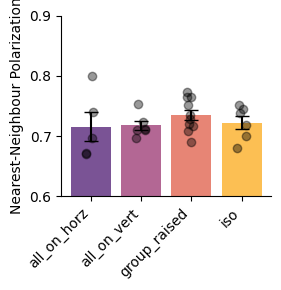

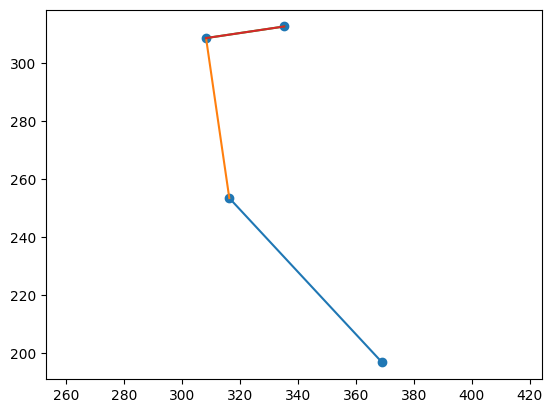

In [ ]:
# Nearest neighbor polarization
load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
results = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    neighbor_path = metadata['processed_data_path_neighbor'].iloc[i]
    neighbor_data = np.load(neighbor_path, allow_pickle=True)
    neighbor_dists = neighbor_data['ff_dist']
    data = np.load(data_path, allow_pickle=True)

    fish_num = data['fish_num']
    f_x_all = data['f_x']   # (fish_num, n_frames)
    f_y_all = data['f_y']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]

    if EllapsedTime[-1] < TimeThresh:
        continue

    date = metadata['experiment_date'].iloc[i]
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = len(EllapsedTime) - int(np.round(fps * AnalysisLength))
    end_idx = len(EllapsedTime)

    # --- Compute unit velocity vectors for each fish ---
    polarization_array = []
    for fish in range(fish_num):
        f_x = f_x_all[fish]
        f_y = f_y_all[fish]

        vec_array = np.stack((np.diff(f_x), np.diff(f_y)), axis=1)  # (T-1, 2)
        norms = np.linalg.norm(vec_array, axis=1, keepdims=True)
        norms[norms == 0] = 1e-8
        unit_vecs = vec_array / norms
        polarization_array.append(unit_vecs)

    # Stack: (fish_num, T-1, 2)
    polarization_array = np.stack(polarization_array, axis=0)

    # --- Find nearest neighbour for each fish at each frame ---
    all_indices = np.arange(fish_num)
    neighbor_indices = [np.delete(all_indices, i) for i in range(fish_num)]
    nearest_neighbor_idx = np.zeros((fish_num, neighbor_dists.shape[2]), dtype=int)

    for ii in range(fish_num):
        dists_ii = neighbor_dists[ii]                          # (fish_num-1, n_frames)
        nn_local_idx = np.argmin(dists_ii, axis=0)            # (n_frames,)
        nearest_neighbor_idx[ii] = neighbor_indices[ii][nn_local_idx]

    # --- Nearest neighbour polarization ---
    # polarization_array is T-1, so nn_window drops the last frame to match
    pa_window = polarization_array[:, start_idx:, :]          # (fish_num, T-1-start_idx, 2)
    nn_window = nearest_neighbor_idx[:, start_idx:-1]         # (fish_num, T-1-start_idx)
    T_win = pa_window.shape[1]

    assert nn_window.shape[1] == T_win, f"Shape mismatch: {nn_window.shape[1]} vs {T_win}"

    # For each fish at each frame, get its nearest neighbour's unit vector
    nn_vecs = pa_window[nn_window, np.arange(T_win)[None, :], :]  # (fish_num, T_win, 2)

    # Polarization: 1 = perfectly aligned, 0 = anti-parallel
    pair_pol = np.linalg.norm(pa_window + nn_vecs, axis=2) / 2    # (fish_num, T_win)
    P_t_nn = np.nanmean(pair_pol, axis=0)                          # (T_win,)
    mean_polarization = np.nanmean(P_t_nn)

    results.append({
        'condition': condition,
        'average_polarization': mean_polarization,
        'exp_id': exp_id
    })

# --- Build dataframe ---
heading_df = pd.DataFrame(results)
heading_df = heading_df.groupby(['exp_id', 'condition'], as_index=False).mean(numeric_only=True)
condition_order = heading_df['condition'].unique().tolist()
heading_df['condition'] = pd.Categorical(
    heading_df['condition'], categories=condition_order, ordered=True
)

# --- Plot ---
colors = sns.color_palette("inferno", len(condition_order))
fig, ax = plt.subplots(figsize=(3, 3))

for i, con in enumerate(condition_order):
    subset = heading_df[heading_df['condition'] == con]
    mean_val = subset['average_polarization'].mean()
    sem_val = subset['average_polarization'].sem()
    ax.bar(i, mean_val, yerr=sem_val, color=colors[i], alpha=0.7, capsize=5)
    jitter = np.random.uniform(-0.1, 0.1, size=len(subset))
    ax.scatter(np.full(len(subset), i) + jitter, subset['average_polarization'],
               color='black', alpha=0.4, zorder=10)

ax.set_xticks(range(len(condition_order)))
ax.set_xticklabels(condition_order, rotation=45, ha='right')
ax.set_ylabel('Nearest-Neighbour Polarization')
ax.set_ylim(0.6,0.9)
sns.despine()
plt.tight_layout()
plt.show()

# --- Visualize nearest neighbours at frame 0 ---
plt.scatter(f_x_all[:, 0], f_y_all[:, 0])
for i in range(fish_num):
    nn_idx = nearest_neighbor_idx[i, 0]
    plt.plot([f_x_all[i, 0], f_x_all[nn_idx, 0]],
             [f_y_all[i, 0], f_y_all[nn_idx, 0]])
plt.axis('equal')
plt.show()

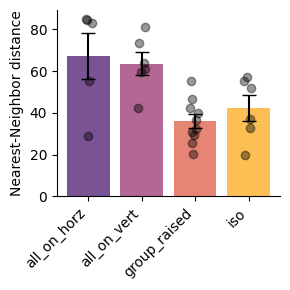

In [ ]:
# Nearest neighbor distance
load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
results = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    neighbor_path = metadata['processed_data_path_neighbor'].iloc[i]
    neighbor_data = np.load(neighbor_path, allow_pickle=True)
    neighbor_dists = neighbor_data['ff_dist']
    data = np.load(data_path, allow_pickle=True)

    fish_num = data['fish_num']
    f_x_all = data['f_x']   # (fish_num, n_frames)
    f_y_all = data['f_y']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]

    if EllapsedTime[-1] < TimeThresh:
        continue

    date = metadata['experiment_date'].iloc[i]
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = len(EllapsedTime) - int(np.round(fps * AnalysisLength))
    end_idx = len(EllapsedTime)
    neighbor_dists_filt = neighbor_dists[:,:,start_idx:end_idx]
    # --- Find nearest neighbour for each fish at each frame ---
    all_indices = np.arange(fish_num)
    neighbor_indices = [np.delete(all_indices, i) for i in range(fish_num)]
    nn_distances = []
    for ii in range(fish_num):
        dists_ii = neighbor_dists_filt[ii]                          # (fish_num-1, n_frames)
        nn_local_idx = np.argmin(dists_ii, axis=0)            # (n_frames,)
        # Pull nearest neighbor distance
        nn_dist = dists_ii[nn_local_idx, np.arange(neighbor_dists_filt.shape[2])]
        nn_distances.append(nn_dist)

    mean_polarization = np.nanmean(nn_distances)

    results.append({
        'condition': condition,
        'average_polarization': mean_polarization,
        'exp_id': exp_id
    })

# --- Build dataframe ---
heading_df = pd.DataFrame(results)
heading_df = heading_df.groupby(['exp_id', 'condition'], as_index=False).mean(numeric_only=True)
condition_order = heading_df['condition'].unique().tolist()
heading_df['condition'] = pd.Categorical(
    heading_df['condition'], categories=condition_order, ordered=True
)

# --- Plot ---
colors = sns.color_palette("inferno", len(condition_order))
fig, ax = plt.subplots(figsize=(3, 3))

for i, con in enumerate(condition_order):
    subset = heading_df[heading_df['condition'] == con]
    mean_val = subset['average_polarization'].mean()
    sem_val = subset['average_polarization'].sem()
    ax.bar(i, mean_val, yerr=sem_val, color=colors[i], alpha=0.7, capsize=5)
    jitter = np.random.uniform(-0.1, 0.1, size=len(subset))
    ax.scatter(np.full(len(subset), i) + jitter, subset['average_polarization'],
               color='black', alpha=0.4, zorder=10)

ax.set_xticks(range(len(condition_order)))
ax.set_xticklabels(condition_order, rotation=45, ha='right')
ax.set_ylabel('Nearest-Neighbor distance')
sns.despine()
plt.tight_layout()
plt.show()

# --- Visualize nearest neighbours at frame 0 ---
# plt.scatter(f_x_all[:, 0], f_y_all[:, 0])
# for i in range(fish_num):
#     nn_idx = nearest_neighbor_idx[i, 0]
#     plt.plot([f_x_all[i, 0], f_x_all[nn_idx, 0]],
#              [f_y_all[i, 0], f_y_all[nn_idx, 0]])
# plt.axis('equal')
# plt.show()


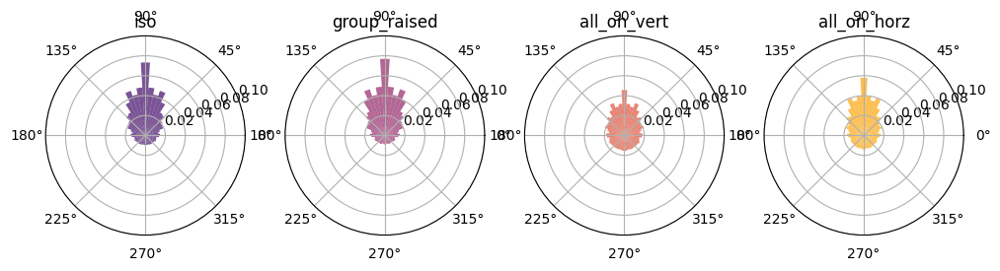

In [ ]:
# Nearest neighbor heading angle difference
load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
results = []

for i in range(len(metadata.index)):
    data_path = metadata['processed_data_path_basic'].iloc[i]
    neighbor_path = metadata['processed_data_path_neighbor'].iloc[i]
    neighbor_data = np.load(neighbor_path, allow_pickle=True)
    neighbor_dists = neighbor_data['ff_dist']
    data = np.load(data_path, allow_pickle=True)

    fish_num = data['fish_num']
    f_x_all = data['f_x']   # (fish_num, n_frames)
    f_y_all = data['f_y']
    ff_heading = data['f_heading']
    EllapsedTime = data['time_stamps']
    condition = str(data['exp_type'])
    exp_id = metadata['experiment_id'].iloc[i]

    if EllapsedTime[-1] < TimeThresh:
        continue

    date = metadata['experiment_date'].iloc[i]
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = len(EllapsedTime) - int(np.round(fps * AnalysisLength))
    end_idx = len(EllapsedTime)
    ff_heading_filt = ff_heading[:,start_idx:end_idx]
    neighbor_dists_filt = neighbor_dists[:,:,start_idx:end_idx]
    all_fish = np.arange(fish_num)
    heading_diffs = []
    for fish in range(fish_num):
        testable_fish = np.delete(all_fish, fish)
        # Remove focal fish from heading
        heading_fish_filt = ff_heading_filt[testable_fish,:]
        heading_diff = ff_heading_filt[fish] - heading_fish_filt
        diff = (heading_diff + 180) % 360 - 180
        heading_diffs.append(diff)
    heading_diff = np.stack(heading_diffs)

    results.append({
        'condition': condition,
        'average_polarization': list(heading_diff.flatten()),
        'exp_id': exp_id})

# --- Build dataframe ---
heading_df = pd.DataFrame(results)
condition_order = heading_df['condition'].unique().tolist()
colors = sns.color_palette("inferno", len(condition_order))
fig, axes = plt.subplots(1, len(condition_order),
                          subplot_kw={'projection': 'polar'},
                         figsize=(3*len(condition_order), 3))

for i, con in enumerate(condition_order):
    ax = axes[i]
    subset = heading_df[heading_df['condition'] == con]
    headings = np.concatenate(subset['average_polarization'].values)
    angles = np.deg2rad(headings+90) % (2*np.pi)

    num_bins = 50  # 10° per bin works well for full 360
    bins = np.linspace(0, 2*np.pi, num_bins + 1)
    hist, bin_edges = np.histogram(angles, bins=bins)
    theta = (bin_edges[:-1] + bin_edges[1:]) / 2
    width = (2*np.pi) / num_bins
    radii = hist / np.sum(hist)

    ax.bar(theta, radii, width=width, bottom=0.0,
           alpha=0.7, color=colors[i])
    ax.set_title(con)
    ax.set_ylim(0,0.1)
#plt.tight_layout()
plt.show()



In [ ]:
# Get length of each video
for i in range(len(metadata.index)):
  data_path = metadata['processed_data_path_basic'].iloc[i]
  data = np.load(data_path, allow_pickle=True)
  fish_num, bodylength = data['fish_num'], data['f_bodylength_mm']
  exp_type, f_x, f_y = data['exp_type'], data['f_x'], data['f_y']
  scale = data['scale']
  EllapsedTime = np.round(data['time_stamps'],1)
  condition = data['exp_type']
  predicted_time = len(f_x[0])/120
  caution=predicted_time<EllapsedTime[-1]
  print(f"Timestamp time {exp_type}_{i} is {EllapsedTime[-1]}. Predicted time = {predicted_time}. CAUTION={caution}")

Timestamp time iso_0 is 900.1. Predicted time = 903.2333333333333. CAUTION=False
Timestamp time group_raised_1 is 900.1. Predicted time = 905.8083333333333. CAUTION=False
Timestamp time group_raised_2 is 900.1. Predicted time = 904.9583333333334. CAUTION=False
Timestamp time iso_3 is 900.1. Predicted time = 903.3833333333333. CAUTION=False
Timestamp time all_on_vert_4 is 900.1. Predicted time = 906.9. CAUTION=False
Timestamp time all_on_vert_5 is 900.1. Predicted time = 905.2333333333333. CAUTION=False
Timestamp time all_on_vert_6 is 900.1. Predicted time = 904.5166666666667. CAUTION=False
Timestamp time all_on_vert_7 is 900.1. Predicted time = 905.1. CAUTION=False
Timestamp time all_on_vert_8 is 900.1. Predicted time = 906.0166666666667. CAUTION=False
Timestamp time all_on_vert_9 is 900.1. Predicted time = 902.4666666666667. CAUTION=False
Timestamp time iso_10 is 900.1. Predicted time = 713.9416666666667. CAUTION=True
Timestamp time iso_11 is 900.0. Predicted time = 904.2666666666667.

In [ ]:
# Get group area over time
load_helper_funcs()

AnalysisLength=300 #Time for analyzing schooling
TimeThresh = 899
results=[]

num_fish = len(metadata.index)
#fig, axes = plt.subplots(num_fish, 1, figsize=(10, 5 * 5))  # Adjust size for multiple rows
results = []
for i in range(len(metadata.index)):
  data_path = metadata['processed_data_path_basic'].iloc[i]
  tech_rep = metadata['tech_rep'].iloc[i]
  if tech_rep !=1:
      continue
  data = np.load(data_path, allow_pickle=True)
  fish_num, bodylength = data['fish_num'], data['f_bodylength_mm']
  exp_type, f_x, f_y = data['exp_type'], data['f_x'], data['f_y']
  scale = data['scale']
  EllapsedTime = data['time_stamps']
  if EllapsedTime[-1]<TimeThresh:
      continue
  condition = data['exp_type']
  #subset to include just the last 300s of recording
  fps=1/np.mean(np.diff(EllapsedTime))
  start_idx=len(EllapsedTime)-np.round(fps*AnalysisLength).astype(int)
  end_idx=len(EllapsedTime)
  f_x=f_x[:,start_idx:end_idx]
  f_y=f_y[:,start_idx:end_idx]
  area = fish_polygon_area(f_x,f_y)
  exp_id=metadata['experiment_id'].iloc[i]
  results_dict = {'condition':condition,'mean_area':np.nanmean(area)*scale,'exp_id':exp_id}
  results.append(results_dict)
  print(i)

group_area_df=pd.DataFrame(results)
group_area_df['condition']=group_area_df['condition'].astype(str)
group_area_df = group_area_df.groupby(['exp_id','condition']).mean().reset_index()

# Set order of conditions
condition_order = ['group_raised','iso','all_on_horz','all_on_vert',]
group_area_df['condition'] = pd.Categorical(
    group_area_df['condition'],
    categories=condition_order,
    ordered=True
)

# Example dataframe (replace with yours)
fish_df = group_area_df
# Remove group-raised
conditions = fish_df['condition'].astype(str).unique()
colors = sns.color_palette("inferno", len(conditions))
fig, ax = plt.subplots(figsize=(3, 3))
for i, con in enumerate(condition_order):
    subset = fish_df[fish_df['condition'] == con]

    # Mean + SEM
    mean_val = subset['mean_area'].mean()
    sem_val = subset['mean_area'].sem()

    # Bar
    ax.bar(i, mean_val, yerr=sem_val, color=colors[i], alpha=0.7, capsize=5)

    # Individual data points (with jitter)
    jitter = np.random.uniform(0, 0, size=len(subset))
    ax.scatter(np.full(len(subset), i) + jitter, subset['mean_area'],
               color='black', alpha=0.2, zorder=10)
# Formatting
ax.set_xticks(range(len(condition_order)))
ax.set_xticklabels(condition_order, rotation=45, ha='right')
ax.set_ylabel('Mean Area (mm^2)')
sns.despine()
plt.tight_layout()
#plt.savefig(figure_savepath+f'/group_area_barplot.svg', format='svg',bbox_inches="tight")
plt.show()

# Count n per condition
fish_df['condition'].value_counts()

,count
condition,
group_raised,9
iso,6
all_on_vert,6
all_on_horz,5


# ANALYZE DAVIDS DATA #

In [ ]:
#behav_path = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Pseudo_school/Data/'+experiment_class+'/'
analysis_path = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Schooling/Analysis/'
data_path = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Schooling/Data/'
figure_savepath = '/content/drive/MyDrive/Personal_notebooks/Geoff_Notebook/Behavior_analysis/Schooling/Figures'
## Load metadata
gsheet = "https://docs.google.com/spreadsheets/d/1hbHobJPb4jnakDFnOPpsMi-jfTZVUXOyUBvgikCyILY/edit?gid=0#gid=0"
tab_name = 'Sheet1'
metadata_david = read_metadata(gsheet,tab_name)
experiments = metadata_david.index

#Create save directory for analysis
exp_dates = metadata_david['experiment_date'].tolist()
save_paths = [analysis_path + str(exp_date) for exp_date in exp_dates]
metadata_david['save_path'] = save_paths
exps=metadata_david.index
#Add raw data path
data_paths = [data_path + str(exp_date)+'/'+str(exp) for exp_date,exp in zip(exp_dates,exps)]
metadata_david['raw_data_path'] = data_paths
#Add timestamp path
TimeStamps=metadata_david['time_stamps'].tolist()
time_stamp_paths = [data_path + str(exp_date)+'/'+str(time) for exp_date,time in zip(exp_dates,TimeStamps)]
metadata_david['time_stamp_path'] = time_stamp_paths
#Add group_id
metadata_david['experiment_id'] = metadata_david['exp_type'].astype(str)+ "_"+ metadata_david['bio_rep'].astype(str) + "_" + metadata_david['experiment_date'].astype(str)

#display(metadata)
display(metadata_david)
for exp_date in np.unique(metadata_david['save_path']):
  os.makedirs(exp_date, exist_ok=True)

,experiment,time_stamps,fish_num,exp_type,bio_rep,tech_rep,fish_cohort,fps_Hz,rig_mm,vid_px,body_length,experiment_date
0,labels.vDavid_all_2wks.009_2wpf_061622_4.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
1,labels.vDavid_4wpf_060222_1.analysis.h5,NA,4,4wpf,,1,NA,120,150,1000,8,Davids_data_development
2,labels.vDavid_all_2wks.008_2wpf_061622_3.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
3,labels.vDavid_all_2wks.007_2wpf_061622_2.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
4,labels.vDavid_all_2wks.006_2wpf_061622_1.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
5,labels.vDavid_all_2wks.005_2wpf_091522_6.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
6,labels.vDavid_all_2wks.004_2wpf_091522_5.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
7,labels.vDavid_all_2wks.003_2wpf_091522_4.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
8,labels.vDavid_all_2wks.002_2wpf_091522_3.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development
9,labels.vDavid_all_2wks.001_2wpf_091522_2.analy...,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development


,time_stamps,fish_num,exp_type,bio_rep,tech_rep,fish_cohort,fps_Hz,rig_mm,vid_px,body_length,experiment_date,save_path,raw_data_path,time_stamp_path,experiment_id
experiment,,,,,,,,,,,,,,,
labels.vDavid_all_2wks.009_2wpf_061622_4.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development
labels.vDavid_4wpf_060222_1.analysis.h5,NA,4,4wpf,,1,NA,120,150,1000,8,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,4wpf__Davids_data_development
labels.vDavid_all_2wks.008_2wpf_061622_3.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development
labels.vDavid_all_2wks.007_2wpf_061622_2.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development
labels.vDavid_all_2wks.006_2wpf_061622_1.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development
labels.vDavid_all_2wks.005_2wpf_091522_6.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development
labels.vDavid_all_2wks.004_2wpf_091522_5.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development
labels.vDavid_all_2wks.003_2wpf_091522_4.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development
labels.vDavid_all_2wks.002_2wpf_091522_3.analysis.h5,NA,4,2wpf,,1,NA,120,150,1000,6,Davids_data_development,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,/content/drive/MyDrive/Personal_notebooks/Geof...,2wpf__Davids_data_development


In [ ]:
def process_h5(h5tracks,fish_num,sleap_nodes,exp):
  """This script reads xy info of each body node of individual fish in a group.
  Return: list of objects with attributes of xy coordinates.
  """
  frame_num, _, _, track_num = h5tracks.shape
  group_data = []
  for f in range(fish_num):

    name = exp + '_f'+ str(f+1)
    fish = Fish() # make class object
    setattr(fish,'name',name)

    # load all xy coordinates
    for idx, node in enumerate(sleap_nodes):
      setattr(fish,str(node)+'x',fill_missing(h5tracks[:,idx,0,f]))
      setattr(fish,str(node)+'y',fill_missing(h5tracks[:,idx,1,f]))
    group_data.append(fish)

  return group_data


def group_arrays_trunc(group_data,fish_num,frame_num,frame_rate,scale):
  """This script takes the processed h5 data and stacks them into group arrays shaped in fish_num x frame_num.
  """
  # initialize group arrays
  # f_bodylength_mm = [[] for f in range(fish_num)]
  # f_bodylength_px = [[] for f in range(fish_num)]

  # # postional
  # f_nosex = [[] for f in range(fish_num)]; f_nosey = [[] for f in range(fish_num)] # center of two eyes
  f_x = [[] for f in range(fish_num)]; f_y = [[] for f in range(fish_num)] # front bladder or belly as the centroid
  # f_tailx = [[] for f in range(fish_num)]; f_taily = [[] for f in range(fish_num)] # tip of the tail
  # # angular
  # f_heading = [[] for f in range(fish_num)]; f_tail_angle = [[] for f in range(fish_num)]
  # # speed stuff
  # f_speed = [[] for f in range(fish_num)]; f_ang_speed = [[] for f in range(fish_num)]

  # # set window size (num of frame) for running mean
  pos_ker = 5 # for positional data
  # ang_ker = 5 # for angular data
  # spd_ker = 10 # for speed data

  # loop through the individual fish
  for ndx, fish in enumerate(group_data):

    # # get ind nose - centr of two eyes
    # nosex = [int(np.mean([l,r])) for l,r in zip(fish.LEYEx,fish.REYEx)]
    # nosey = [int(np.mean([l,r])) for l,r in zip(fish.LEYEy,fish.REYEy)]

    # # get ind fish body length - 95th percentil across the frames
    # nose_to_tail = np.sqrt( (nosex - fish.ttx)**2 + (nosey - fish.tty)**2 )
    # bodylen_px =  np.percentile(nose_to_tail,99)
    # bodylen_mm =  np.percentile(nose_to_tail,99)*scale

    # # stack the convolved arrays
    # f_bodylength_px[ndx] = bodylen_px
    # f_bodylength_mm[ndx] = bodylen_mm

    # f_nosex[ndx] = running_mean(nosex,pos_ker)
    # f_nosey[ndx] = running_mean(nosey,pos_ker)
    #f_x[ndx] = running_mean(fish.mbx,pos_ker) #if jy nodes
    #f_y[ndx] = running_mean(fish.mby,pos_ker) #if jy nodes
    f_x[ndx] = running_mean(fish.BODY1x,pos_ker) #if dz nodes
    f_y[ndx] = running_mean(fish.BODY1y,pos_ker) #if dz nodes
    # f_tailx[ndx] = running_mean(fish.ttx,pos_ker)
    # f_taily[ndx] = running_mean(fish.tty,pos_ker)

    # get ind fish orientation and tail angle per frame
    # heading = calculate_angle(f_nosex[ndx],f_nosey[ndx],f_x[ndx],f_y[ndx])
    # tail = calculate_angle(f_x[ndx],f_y[ndx],f_tailx[ndx],f_taily[ndx])

    # f_heading[ndx] = running_mean(heading, ang_ker)
    # f_tail_angle[ndx] = running_mean((( (tail-heading) + 180) % 360) - 180, ang_ker)

    # # get ind fish speed and angular speed per frame
    # #speed, angular_speed = speed_angular_sp(fish.mbx,fish.mby,heading,bodylen_px,frame_rate,scale) #if jy nodes
    # speed, angular_speed = speed_angular_sp(fish.byx,fish.byy,heading,bodylen_px,frame_rate,scale) #if dz nodes


    # f_speed[ndx] = running_mean(speed, spd_ker)
    # f_ang_speed[ndx] = running_mean(angular_speed, spd_ker)



  return f_x, f_y


def analyze_neighbors_trunc(fish_num,f_x,f_y,frame_num,scale):
  """This script generates group arrays of distance and alignment between individual fish and their neighbors.
  """

  if fish_num == 2:

    # initialize arrays
    ff_dist = np.zeros((fish_num,fish_num-1,frame_num))
    ff_align = np.zeros((fish_num,fish_num-1,frame_num))
    f_closest_id = np.zeros((fish_num,frame_num))
    f_closest_dist = np.zeros((fish_num,frame_num))

    for f0 in range(fish_num):
      for f1 in range(fish_num):
        if f1 != f0:
          dist = np.abs(np.sqrt( (f_x[f0]-f_x[f1])**2 + (f_y[f0]-f_y[f1])**2 ) )*scale

          ff_dist[f0][0] = dist

    f_IID = ff_dist[0]
    #
    f_closest_id = np.stack( (np.ones((frame_num)), np.zeros((frame_num))) )
    f_closest_dist = ff_dist


  else: # if fish_num >= 3

    # initialize arrays and lists
    ff_dist = np.zeros((fish_num,fish_num-1,frame_num))
    f_IID = [];  # number of dyads x framenum
    f_closest_id = np.zeros((fish_num,frame_num))
    f_closest_dist = np.zeros((fish_num,frame_num))

    # loop through ind fish
    for f0 in range(fish_num):
      nb_count = 0

      for f1 in range(fish_num):
        if f1 != f0:
          nb_count += 1

          dist = np.abs(np.sqrt( (f_x[f0]-f_x[f1])**2 + (f_y[f0]-f_y[f1])**2 ) )*scale

          ff_dist[f0][nb_count-1] = dist


        if f0 < f1:
          f_IID.append(dist)

    f_IID = np.array(f_IID)

    # find the stats with the closest neighbor for each fish
    for f0 in range(fish_num):
      closest_dist = np.array(np.min(ff_dist[f0],axis=0)) # find the smallest dist in each frame
      f_closest_id[f0] = np.argmin(ff_dist[f0] == closest_dist, axis=0) # identify which fish it is
      index = f_closest_id[f0].astype(int)
      f_closest_dist[f0] = closest_dist # find their distance

  return ff_dist,  f_IID, f_closest_id, f_closest_dist

In [ ]:
load_helper_funcs()

processed_data_paths =[]
processed_data_paths_neighbors=[]
save=True
for i in range(0,len(metadata_david)):
  exp=metadata_david.index[i]
  data_path=metadata_david['raw_data_path'].iloc[i]
  time_stamp_path=metadata_david['time_stamp_path'].iloc[i]
  save_path=metadata_david['save_path'].iloc[i]
  saveCheck = save_path+'/' + exp + '/' + exp + '_' + 'lev0_basics' +'.npz'

  # check whether data has already been processed
  if os.path.isfile(saveCheck) == True:
    #make folder for each recording
    print(f"{str(exp)} has already been processed. Skipping ")
    processed_data_path=save_npz_geoff(save_path,exp,'lev0_basics',[],save=False)
    processed_data_paths.append(processed_data_path)

    processed_data_path_adv = save_npz_geoff(save_path,exp,'lev0_neighbor_stats',[],save=False)
    processed_data_paths_neighbors.append(processed_data_path_adv)
    continue
  else:
    pass
  # load metadata
  exp_type = metadata_david['exp_type'].iloc[i]
  fish_num = metadata_david['fish_num'].iloc[i]
  fps_Hz = metadata_david['fps_Hz'].iloc[i]
  rig_mm = metadata_david['rig_mm'].iloc[i]
  vid_px = metadata_david['vid_px'].iloc[i]
  scale = rig_mm / vid_px # mm/pixel

  # load the h5
  h5_obj = h5py.File(data_path, "r")

  h5tracks = h5_obj['tracks'][:].T
  try:
    sleap_nodes = h5_obj["edge_names"][:]
    sleap_nodes = sleap_nodes.flatten()

    sleap_nodes = [[x.decode('utf-8') for x in row] for row in sleap_nodes]

  except:
    sleap_nodes = h5_obj["node_names"][:]
    sleap_nodes = [x.decode('utf-8') for x in sleap_nodes]

  sleap_nodes = [n.decode('utf-8') if isinstance(n, bytes) else str(n) for n in sleap_nodes]
  print(sleap_nodes)
  frame_num, _, _, track_num = h5tracks.shape
  print("frames x nodes x 2 x animals", h5tracks.shape)
  if h5tracks.shape[3] !=4:
    processed_data_paths.append(np.nan)
    processed_data_paths_neighbors.append(np.nan)
    continue
  # load data from h5 tracks
  fish_data = process_h5(h5tracks,fish_num,sleap_nodes,exp)

#   # get time stamps - No timestamps for David's data :(
#   # time_stamps_df = pd.read_csv(time_stamp_path)
#   # time_stamps_df.columns = ['time_stamps']
#   # time_stamps_df['time_stamps'] = pd.to_datetime(time_stamps_df['time_stamps'], errors='coerce')
#   # time_stamps_df['elapsed_seconds'] = (time_stamps_df['time_stamps'] - time_stamps_df['time_stamps'].iloc[0]).dt.total_seconds()
#   # time_stamps = time_stamps_df
#   # print(frame_num,len(time_stamps_df))
#   # time_stamps = getTimeStamps(time_stamp_path)

#   # #plot all trajectories
  for i in fish_data:
    byx = i.__getattribute__('BODY1x')
    byy = i.__getattribute__('BODY1y')
    plt.scatter(byx,byy, s=3, alpha=0.1)

#   # # organize them into group arrays and save as lev0_basics.npz
  f_x, f_y = group_arrays_trunc(fish_data,fish_num,frame_num,fps_Hz,scale)

  # Let's interpolate timestamps assuming a fixed rate of of 120hz
  fps = 120
  time_stamps = np.linspace(0, frame_num/fps, frame_num)
  time_stamps = pd.DataFrame({'elapsed_seconds':time_stamps})
  savinglist = {'exp_type':exp_type,'fish_num':fish_num,'scale':scale,'fps':fps_Hz,\
              'time_stamps':time_stamps['elapsed_seconds'],\
              'f_x':f_x,'f_y':f_y}

  processed_data_path=save_npz_geoff(save_path,exp,'lev0_basics',savinglist,save=save)
  processed_data_paths.append(processed_data_path)



  # calculate distance and alignment with neighbors - save as lev0_neighbor_stats.npz
  ff_dist,  f_IID, f_closest_id, f_closest_dist = analyze_neighbors_trunc(fish_num,f_x,f_y,frame_num,scale)
  group_area = 0#fish_polygon_area(f_x,f_y)
  savinglist = {'group_area':group_area,'ff_dist':ff_dist,'f_IID':f_IID,\
                'f_closest':f_closest_id,'f_closest_dist':f_closest_dist,\
               }
  processed_data_path_adv=save_npz_geoff(save_path,exp,'lev0_neighbor_stats',savinglist)
  processed_data_paths_neighbors.append(processed_data_path_adv)

#update metadata file
metadata_david['processed_data_path_basic'] = processed_data_paths
metadata_david['processed_data_path_neighbor'] = processed_data_paths_neighbors


labels.vDavid_all_2wks.009_2wpf_061622_4.analysis.h5 has already been processed. Skipping 
labels.vDavid_4wpf_060222_1.analysis.h5 has already been processed. Skipping 
['LEYE', 'REYE', 'BODY1', 'BODY2', 'BODY3', 'TAIL1']
frames x nodes x 2 x animals (19082, 6, 2, 12)
['LEYE', 'REYE', 'BODY1', 'BODY2', 'BODY3', 'TAIL1']
frames x nodes x 2 x animals (19751, 6, 2, 9)
labels.vDavid_all_2wks.006_2wpf_061622_1.analysis.h5 has already been processed. Skipping 
['LEYE', 'REYE', 'BODY1', 'BODY2', 'BODY3', 'TAIL1']
frames x nodes x 2 x animals (36443, 6, 2, 5)
labels.vDavid_all_2wks.004_2wpf_091522_5.analysis.h5 has already been processed. Skipping 
labels.vDavid_all_2wks.003_2wpf_091522_4.analysis.h5 has already been processed. Skipping 
['LEYE', 'REYE', 'BODY1', 'BODY2', 'BODY3', 'TAIL1']
frames x nodes x 2 x animals (36107, 6, 2, 5)
['LEYE', 'REYE', 'BODY1', 'BODY2', 'BODY3', 'TAIL1']
frames x nodes x 2 x animals (36443, 6, 2, 7)
labels.vDavid_all_2wks.000_2wpf_091522_1.analysis.h5 has alrea

### CROSS CORRELATION WITH AGE ###

In [ ]:
# Generate relative velocity and alignment heatmaps

# Plot heading alignment as a function of distance
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg
import cv2
from scipy.ndimage import gaussian_filter1d

load_helper_funcs()  # only once

# Parameters
AnalysisLength = 300  # seconds for analyzing schooling
TimeThresh = 899
bin_length =0.009
occupancy_data = []

for i in range(len(metadata_david.index)):
    data_path = metadata_david['processed_data_path_basic'].iloc[i]
    data_path_neighbors = metadata_david['processed_data_path_neighbor'].iloc[i]
    tech_rep = metadata_david['tech_rep'].iloc[i]
    if isinstance(data_path_neighbors, float):
      continue
    data = np.load(data_path, allow_pickle=True)
    neighbor_data = np.load(data_path_neighbors, allow_pickle=True)

    fish_num = data['fish_num']
    EllapsedTime = data['time_stamps']
    # if EllapsedTime[-1]<TimeThresh:
    #   continue
    condition = str(data['exp_type'])
    exp_id = metadata_david['experiment_id'].iloc[i]
    date = metadata_david['experiment_date'].iloc[i]
    scale = metadata_david['rig_mm'].iloc[i] / metadata_david['vid_px'].iloc[i]
    f_x,f_y = data['f_x'], data['f_y']
    ff_dist = neighbor_data['ff_dist']
    frame_num = len(f_x[0])
    fps = 1 / np.mean(np.diff(EllapsedTime))
    start_idx = 0
    end_idx = int(TimeThresh * fps)

    # Filter data of interest
    ff_dist_filt = ff_dist[:, :,start_idx:end_idx]
    f_x_filt,f_y_filt = f_x[:,start_idx:end_idx],f_y[:,start_idx:end_idx]
    EllapsedTime_filt = EllapsedTime[start_idx:end_idx] - EllapsedTime[start_idx]

    # Compute velocities (mm/frame)
    vx = np.diff(f_x_filt, axis=1) * scale
    vy = np.diff(f_y_filt, axis=1) * scale

    # smooth velocity either by binning or filtering
    # vx_smooth = gaussian_filter1d(vx, sigma=fps * 0.005 , axis=1)
    # vy_smooth = gaussian_filter1d(vy, sigma=fps * 0.005 , axis=1)
    # uniform_fps = 120.0
    # uniform_time = np.arange(EllapsedTime_filt[0], EllapsedTime_filt[-1], 1 / uniform_fps)
    # f_x_interp = np.zeros((fish_num, len(uniform_time)))
    # f_y_interp = np.zeros((fish_num, len(uniform_time)))
    # for fish_idx in range(fish_num):
    #   # 'cubic' handles curved movement best, but 'linear' is safer against overshooting
    #   fx_func = interp1d(EllapsedTime_filt, f_x_filt[fish_idx, :], kind='linear')
    #   fy_func = interp1d(EllapsedTime_filt, f_y_filt[fish_idx, :], kind='linear')

    #   f_x_interp[fish_idx, :] = fx_func(uniform_time)
    #   f_y_interp[fish_idx, :] = fy_func(uniform_time)

    # vx_smooth = np.diff(f_x_interp, axis=1) * scale * uniform_fps
    # vy_smooth = np.diff(f_y_interp, axis=1) * scale * uniform_fps

    # Pad to match shape (T)
    vx = np.concatenate([vx, vx[:, -1][:, None]], axis=1)
    vy = np.concatenate([vy, vy[:, -1][:, None]], axis=1)
    # vx_smooth = np.concatenate([vx_smooth, vx_smooth[:, -1][:, None]], axis=1)
    # vy_smooth =  np.concatenate([vy_smooth, vy_smooth[:, -1][:, None]], axis=1)

    for fish in range(fish_num):
      # Get focal fish distances to other fish
      foi_dist = ff_dist_filt[fish,:,:]
      foi_x = f_x_filt[fish,:]
      foi_y = f_y_filt[fish,:]
      # foi_x_bin = f_x_interp[fish,:]
      # foi_y_bin = f_y_interp[fish,:]
      # Get focal fish heading
      # Get non focal fish headings and positions
      non_foi_x = np.delete(f_x_filt, fish, axis=0)
      non_foi_y = np.delete(f_y_filt, fish, axis=0)
      # non_foi_x_bin = np.delete(f_x_interp, fish, axis=0)
      # non_foi_y_bin = np.delete(f_y_interp, fish, axis=0)

      # Get vector from focal fish to non_focal fish
      vec_array = np.array([(non_foi_x-foi_x), (non_foi_y-foi_y)])* scale  # Shape = (x or y,vector to other fish,frames) = (2,n_other fish ,n_frames)
      #vec_array_smooth = np.array([(non_foi_x_bin-foi_x_bin), (non_foi_y_bin-foi_y_bin)])* scale
      occupancy_data.append({'condition': condition,
                             'scale': scale,
                             'focal_fish':fish,
                            #  'ff_heading':foi_heading,
                            #  'other_fish_heading':non_foi_heading,
                             'vector_to_other_fish': vec_array,
                            #  'vector_to_other_fish_smooth': vec_array_smooth,
                             'vx':vx,
                             'vy':vy,
                            #  'vx_smooth':vx_smooth,
                            #  'vy_smooth':vy_smooth,
                             'f_x_filt':f_x_filt,
                             'f_y_filt':f_y_filt,
                             'exp_id':exp_id})


occupancy_df = pd.DataFrame(occupancy_data)

In [ ]:
# ####Cross correlation analysis with unique pairs####
# from scipy.signal import correlate, detrend
# import random
# # Parameters
# dist_slices = [(5, 50), (50, 100), (150, 200)]
# max_lag_sec = 1
# fps = 120###NOTE THIS WILL CHANGE DEPENDING ON BIN LENGTH. RAW FPS  ~120
# lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))
# cons = ['2wpf', '4wpf', '6wpf','8wpf']
# age_colors = {'2wpf': 'blue', '4wpf': 'green', '6wpf': 'orange', '8wpf':'red'}

# fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
# current_experiment = 'nothing'
# for ax, (d_min, d_max) in zip(axs, dist_slices):
#     matching_results = []
#     for con in cons:
#         subset = occupancy_df[occupancy_df['condition'] == con]
#         for _, row in subset.iterrows():
#             v2of = row['vector_to_other_fish']
#             vx_all, vy_all = row['vx'], row['vy']
#             fish = row['focal_fish']
#             # Eliminate double counting of pairs by only counting first two fish
#             new_experiment = row['exp_id']

#             # 1. Identify Nearest Neighbor and Distance
#             all_neighbor_dists = np.linalg.norm(v2of, axis=0)
#             nearest_idx = np.argmin(all_neighbor_dists, axis=0)
#             dist_to_nearest = np.min(all_neighbor_dists, axis=0)

#             # Map relative index back to absolute fish IDs ---
#             # If the neighbor's index in the filtered array is >= the focal fish's ID,
#             # its true ID is shifted by +1.
#             actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)

#             # Unique Pair Mask ---
#             # This assigns "responsibility" for the calculation to the fish with the lower ID.
#             # If Fish 0 and Fish 2 are closest, Fish 0 calculates it (0 < 2). Fish 2 skips it (2 is not < 0).
#             unique_pair_mask = fish < actual_neighbor_ids

#             # 2. Create MASK for this distance slice
#             speeds = np.sqrt(vx_all**2 + vy_all**2)
#             speed_mean = np.mean(speeds, axis=1, keepdims=True)
#             speed_std  = np.std(speeds,  axis=1, keepdims=True)
#             bad_frames = np.any(speeds > speed_mean + 5 * speed_std, axis=0)

#             # Combine all conditions, including our new symmetry-breaker
#             mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

#             if np.sum(mask) < (fps * 2): # Need at least 2 seconds of data in this slice
#                 continue

#             # 3. Speeds
#             speed_f = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)[mask]

#             vx_neighbors = np.delete(vx_all, fish, axis=0)
#             vy_neighbors = np.delete(vy_all, fish, axis=0)
#             speeds_all_n = np.sqrt(vx_neighbors**2 + vy_neighbors**2)
#             nearest_neighbor_speed = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()[mask]

#             # 4. Normalize and Correlate
#             # Use only the masked data for mean/std to avoid cross-distance contamination
#             s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) + 1e-8)
#             s_n = (nearest_neighbor_speed - np.mean(nearest_neighbor_speed)) / (np.std(nearest_neighbor_speed) + 1e-8)

#             # Detrend data?
#             s_f = detrend(s_f)
#             s_n = detrend(s_n)

#             corr = correlate(s_f, s_n, mode='same') #/ len(speed_f)
#             corr /= (np.sqrt(np.sum(s_f**2) * np.sum(s_n**2)) + 1e-8)

#             center = len(corr) // 2
#             corr_subset = corr[max(0, center + lags[0]) : min(len(corr), center + lags[-1] + 1)]

#             # Pad if slice was too short for the lag window
#             if len(corr_subset) < len(lags):
#                 continue

#             matching_results.append({'condition': con, 'corr': corr_subset})

#     # Plot for this distance bin
#     for con in cons:
#         con_data = [r['corr'] for r in matching_results if r['condition'] == con]
#         if len(con_data) > 0:
#             ax.plot(lags / fps, np.mean(con_data, axis=0), label=con,color=age_colors[con])

#     ax.set_title(f'Distance: {d_min}-{d_max} mm')
#     ax.axvline(0, color='k', linestyle='--', alpha=0.3)
#     ax.set_xlabel('Time Lag (s)')
#     ax.legend()
# axs[0].set_ylabel('Speed Correlation')
# sns.despine()
# plt.tight_layout()
# plt.show()

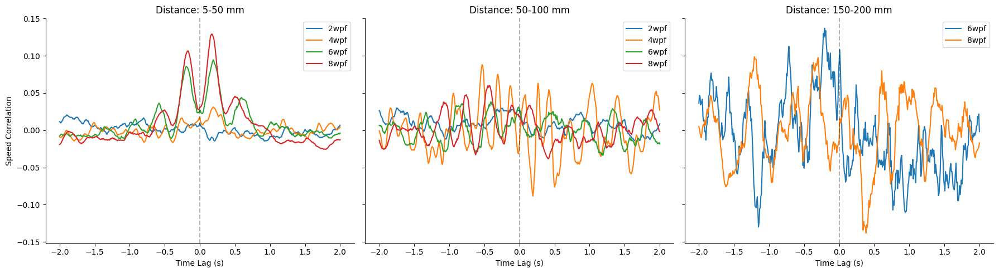

In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
dist_slices = [(5, 50), (50, 100), (150, 200)]
max_lag_sec = 2
fps = 120
max_lag_frames = int(max_lag_sec * fps)
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Bout Requirements
min_bout_sec = 2.1 # Must be strictly > max_lag_sec to allow for overlap!
min_bout_frames = int(min_bout_sec * fps)

cons = ['2wpf', '4wpf', '6wpf','8wpf']
age_colors = {'2wpf': 'blue', '4wpf': 'green', '6wpf': 'orange', '8wpf':'red'}
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, (d_min, d_max) in zip(axs, dist_slices):
    matching_results = []

    for con in cons:
        subset = occupancy_df[occupancy_df['condition'] == con]

        for _, row in subset.iterrows():
            v2of = row['vector_to_other_fish']
            vx_all, vy_all = row['vx'], row['vy']
            fish = row['focal_fish']

            # 1. Identify Nearest Neighbor and Distance
            all_neighbor_dists = np.linalg.norm(v2of, axis=0)
            nearest_idx = np.argmin(all_neighbor_dists, axis=0)
            dist_to_nearest = np.min(all_neighbor_dists, axis=0)

            # Unique Pair Mapping
            actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)
            unique_pair_mask = fish < actual_neighbor_ids

            # 2. Speeds & Outlier Detection
            speeds_all = np.sqrt(vx_all**2 + vy_all**2)
            speed_mean = np.mean(speeds_all, axis=1, keepdims=True)
            speed_std  = np.std(speeds_all,  axis=1, keepdims=True)
            bad_frames = np.any(speeds_all > speed_mean + 5 * speed_std, axis=0)

            # Combine all states into one continuous Boolean mask
            valid_mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

            # 3. THE MAGIC: Find contiguous bouts where the mask is True
            # Pad with False at both ends to ensure we catch bouts touching the edges
            padded = np.concatenate(([False], valid_mask, [False]))
            diffs = np.diff(padded.astype(int))
            starts = np.where(diffs == 1)[0]
            ends = np.where(diffs == -1)[0]

            # 4. Extract continuous target arrays
            speed_f_full = speeds_all[fish]
            speeds_all_n = np.delete(speeds_all, fish, axis=0)
            speed_n_full = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()

            # 5. Process each valid bout individually
            for start, end in zip(starts, ends):
                bout_length = end - start

                # Only proceed if the fish stayed in this state long enough
                if bout_length >= min_bout_frames:

                    # Extract the unbroken, continuous timeline
                    s_f = speed_f_full[start:end]
                    s_n = speed_n_full[start:end]

                    # Detrend and Z-score
                    s_f = detrend(s_f)
                    s_n = detrend(s_n)
                    s_f = (s_f - np.mean(s_f)) / (np.std(s_f) + 1e-8)
                    s_n = (s_n - np.mean(s_n)) / (np.std(s_n) + 1e-8)

                    # Mathematically sound full correlation
                    corr = correlate(s_f, s_n, mode='full')

                    # Extract the specific lag window
                    center = len(corr) // 2
                    corr_subset = corr[center - max_lag_frames : center + max_lag_frames + 1]

                    # Unbiased normalization: accounts for fewer overlapping frames at larger lags
                    overlaps = bout_length - np.abs(lags)
                    corr_subset /= bout_length

                    matching_results.append({'condition': con, 'corr': corr_subset})

    # Plotting for this distance bin
    for con in cons:
        con_data = [r['corr'] for r in matching_results if r['condition'] == con]
        if len(con_data) > 0:
            ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

    ax.set_title(f'Distance: {d_min}-{d_max} mm')
    ax.axvline(0, color='k', linestyle='--', alpha=0.3)
    ax.set_xlabel('Time Lag (s)')
    ax.legend()
axs[0].set_ylabel('Speed Correlation')
sns.despine()
plt.legend()
plt.tight_layout()
plt.show()

### BURST TIMES Davids data ###



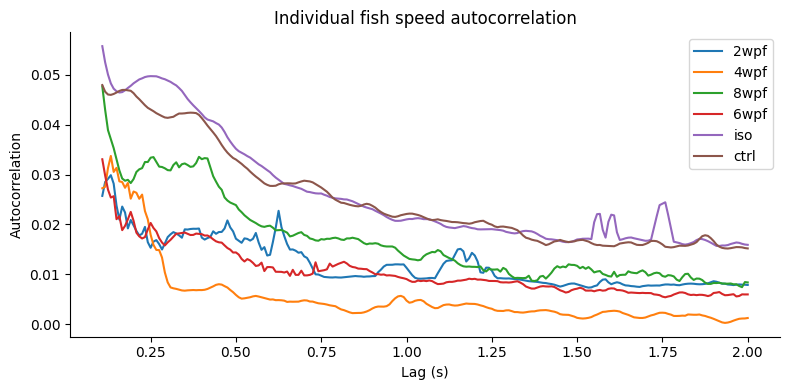

In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

max_lag_sec = 2
fps = 120
max_lag_frames = int(max_lag_sec * fps)

autocorr_results = []

for _, row in occupancy_df.iterrows():
    fish = row['focal_fish']
    vx_all, vy_all = row['vx'], row['vy']
    con = row['condition']

    # 1. Compute speed and assign directly to 's'
    s = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)

    # Skip processing if data is too short
    if len(s) <= max_lag_frames:
        continue

    # 2.Detrend first, then Z-score!
    s = detrend(s)
    s = (s - np.mean(s)) / (np.std(s) + 1e-8)

    # 3.full autocorrelation
    ac = correlate(s, s, mode='full')

    # Extract the center (lag 0 is always directly in the center of a full correlation)
    center = len(ac) // 2

    # Slice only the portion of the correlation within our max lag window
    ac_subset = ac[center - max_lag_frames : center + max_lag_frames + 1]

    # Normalize so that lag 0 yields a value of 1.0
    ac_subset = ac_subset / ac_subset[max_lag_frames]

    autocorr_results.append({'condition': con, 'ac': ac_subset, 'fish': fish})

# Reconstruct the proper lag indices matching our sliced array
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Plotting
# Keep only positive lags and ignore the massive spike at lag 0 to see the subtle burst rhythms!
lag_mask = (lags > int(0.1 * fps)) & (lags <= max_lag_frames)

fig, ax = plt.subplots(figsize=(8, 4))
for con in occupancy_df['condition'].unique():
    con_data = [r['ac'] for r in autocorr_results if r['condition'] == con]
    if len(con_data) > 0:
        # Plot time on X-axis instead of raw frame lag
        ax.plot(lags[lag_mask] / fps, np.mean(con_data, axis=0)[lag_mask], label=con)

ax.set_xlabel('Lag (s)')
ax.set_ylabel('Autocorrelation')
ax.set_title('Individual fish speed autocorrelation')
sns.despine()
plt.legend()
plt.tight_layout()
plt.show()

### CROSS CORRELATION WITH ISO ###

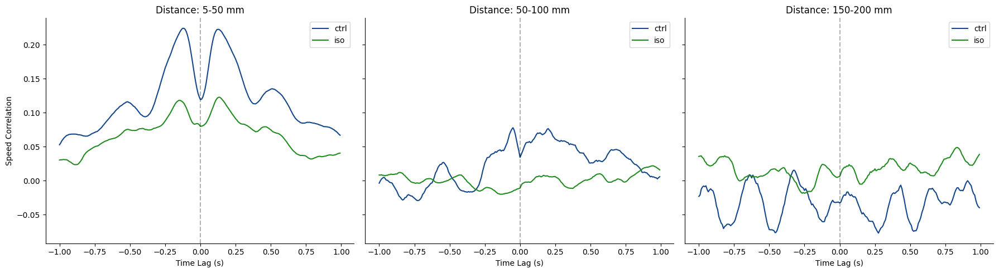

In [ ]:
####Cross correlation analysis with unique pairs####
from scipy.signal import correlate, detrend
import random
# Parameters
dist_slices = [(5, 50), (50, 100), (150, 200)]
max_lag_sec = 1
fps = 120###NOTE THIS WILL CHANGE DEPENDING ON BIN LENGTH. RAW FPS  ~120
lags = np.arange(-int(max_lag_sec * fps), int(max_lag_sec * fps))
cons = ['ctrl', 'iso']
# Set earth tone colors
iso_colors = {'ctrl': '#14478A', 'iso': '#228B22'}

fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
current_experiment = 'nothing'
for ax, (d_min, d_max) in zip(axs, dist_slices):
    matching_results = []
    for con in cons:
        subset = occupancy_df[occupancy_df['condition'] == con]
        for _, row in subset.iterrows():
            v2of = row['vector_to_other_fish']
            vx_all, vy_all = row['vx'], row['vy']
            fish = row['focal_fish']
            # Eliminate double counting of pairs by only counting first two fish
            new_experiment = row['exp_id']

            # 1. Identify Nearest Neighbor and Distance
            all_neighbor_dists = np.linalg.norm(v2of, axis=0)
            nearest_idx = np.argmin(all_neighbor_dists, axis=0)
            dist_to_nearest = np.min(all_neighbor_dists, axis=0)

            # Map relative index back to absolute fish IDs ---
            # If the neighbor's index in the filtered array is >= the focal fish's ID,
            # its true ID is shifted by +1.
            actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)

            # Unique Pair Mask ---
            # This assigns "responsibility" for the calculation to the fish with the lower ID.
            # If Fish 0 and Fish 2 are closest, Fish 0 calculates it (0 < 2). Fish 2 skips it (2 is not < 0).
            unique_pair_mask = fish < actual_neighbor_ids

            # 2. Create MASK for this distance slice
            speeds = np.sqrt(vx_all**2 + vy_all**2)
            speed_mean = np.mean(speeds, axis=1, keepdims=True)
            speed_std  = np.std(speeds,  axis=1, keepdims=True)
            bad_frames = np.any(speeds > speed_mean + 5 * speed_std, axis=0)

            # Combine all conditions, including our new symmetry-breaker
            mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

            if np.sum(mask) < (fps * 2): # Need at least 2 seconds of data in this slice
                continue

            # 3. Speeds
            speed_f = np.sqrt(vx_all[fish]**2 + vy_all[fish]**2)[mask]

            vx_neighbors = np.delete(vx_all, fish, axis=0)
            vy_neighbors = np.delete(vy_all, fish, axis=0)
            speeds_all_n = np.sqrt(vx_neighbors**2 + vy_neighbors**2)
            nearest_neighbor_speed = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()[mask]

            # 4. Normalize and Correlate
            # Use only the masked data for mean/std to avoid cross-distance contamination
            s_f = (speed_f - np.mean(speed_f)) / (np.std(speed_f) + 1e-8)
            s_n = (nearest_neighbor_speed - np.mean(nearest_neighbor_speed)) / (np.std(nearest_neighbor_speed) + 1e-8)

            # Detrend data?
            s_f = detrend(s_f)
            s_n = detrend(s_n)

            corr = correlate(s_f, s_n, mode='same') #/ len(speed_f)
            corr /= (np.sqrt(np.sum(s_f**2) * np.sum(s_n**2)) + 1e-8)

            center = len(corr) // 2
            corr_subset = corr[max(0, center + lags[0]) : min(len(corr), center + lags[-1] + 1)]

            # Pad if slice was too short for the lag window
            if len(corr_subset) < len(lags):
                continue

            matching_results.append({'condition': con, 'corr': corr_subset})

    # Plot for this distance bin
    for con in cons:
        con_data = [r['corr'] for r in matching_results if r['condition'] == con]
        if len(con_data) > 0:
            ax.plot(lags / fps, np.mean(con_data, axis=0), label=con,color=iso_colors[con])

    ax.set_title(f'Distance: {d_min}-{d_max} mm')
    ax.axvline(0, color='k', linestyle='--', alpha=0.3)
    ax.set_xlabel('Time Lag (s)')
    ax.legend()
axs[0].set_ylabel('Speed Correlation')
sns.despine()
plt.tight_layout()
plt.show()

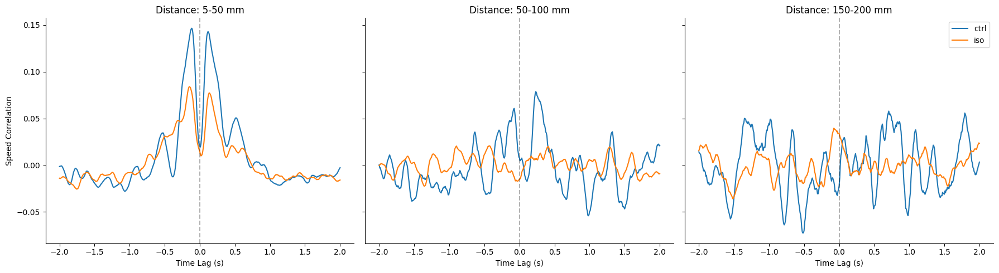

In [ ]:
from scipy.signal import correlate, detrend
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
dist_slices = [(5, 50), (50, 100), (150, 200)]
max_lag_sec = 2
fps = 120
max_lag_frames = int(max_lag_sec * fps)
lags = np.arange(-max_lag_frames, max_lag_frames + 1)

# Bout Requirements
min_bout_sec = 2.1 # Must be strictly > max_lag_sec to allow for overlap!
min_bout_frames = int(min_bout_sec * fps)

cons = ['ctrl', 'iso']
# Set earth tone colors
iso_colors = {'ctrl': '#14478A', 'iso': '#228B22'}
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, (d_min, d_max) in zip(axs, dist_slices):
    matching_results = []

    for con in cons:
        subset = occupancy_df[occupancy_df['condition'] == con]

        for _, row in subset.iterrows():
            v2of = row['vector_to_other_fish']
            vx_all, vy_all = row['vx'], row['vy']
            fish = row['focal_fish']

            # 1. Identify Nearest Neighbor and Distance
            all_neighbor_dists = np.linalg.norm(v2of, axis=0)
            nearest_idx = np.argmin(all_neighbor_dists, axis=0)
            dist_to_nearest = np.min(all_neighbor_dists, axis=0)

            # Unique Pair Mapping
            actual_neighbor_ids = np.where(nearest_idx >= fish, nearest_idx + 1, nearest_idx)
            unique_pair_mask = fish < actual_neighbor_ids

            # 2. Speeds & Outlier Detection
            speeds_all = np.sqrt(vx_all**2 + vy_all**2)
            speed_mean = np.mean(speeds_all, axis=1, keepdims=True)
            speed_std  = np.std(speeds_all,  axis=1, keepdims=True)
            bad_frames = np.any(speeds_all > speed_mean + 5 * speed_std, axis=0)

            # Combine all states into one continuous Boolean mask
            valid_mask = (dist_to_nearest >= d_min) & (dist_to_nearest < d_max) & ~bad_frames & unique_pair_mask

            # 3.find contiguous bouts where the mask is True
            # Pad with False at both ends to ensure we catch bouts touching the edges
            padded = np.concatenate(([False], valid_mask, [False]))
            diffs = np.diff(padded.astype(int))
            starts = np.where(diffs == 1)[0]
            ends = np.where(diffs == -1)[0]

            # 4. Extract continuous target arrays
            speed_f_full = speeds_all[fish]
            speeds_all_n = np.delete(speeds_all, fish, axis=0)
            speed_n_full = np.take_along_axis(speeds_all_n, nearest_idx[None, :], axis=0).flatten()

            # 5. Process each valid bout individually
            for start, end in zip(starts, ends):
                bout_length = end - start

                # Only proceed if the fish stayed in this state long enough
                if bout_length >= min_bout_frames:

                    # Extract the unbroken, continuous timeline
                    s_f = speed_f_full[start:end]
                    s_n = speed_n_full[start:end]

                    # Detrend and Z-score
                    s_f = detrend(s_f)
                    s_n = detrend(s_n)
                    s_f = (s_f - np.mean(s_f)) / (np.std(s_f) + 1e-8)
                    s_n = (s_n - np.mean(s_n)) / (np.std(s_n) + 1e-8)

                    # Mathematically sound full correlation
                    corr = correlate(s_f, s_n, mode='full')

                    # Extract the specific lag window
                    center = len(corr) // 2
                    corr_subset = corr[center - max_lag_frames : center + max_lag_frames + 1]

                    # Unbiased normalization: accounts for fewer overlapping frames at larger lags
                    overlaps = bout_length - np.abs(lags)
                    corr_subset /= bout_length

                    matching_results.append({'condition': con, 'corr': corr_subset})

    # Plotting for this distance bin
    for con in cons:
        con_data = [r['corr'] for r in matching_results if r['condition'] == con]
        if len(con_data) > 0:
            ax.plot(lags / fps, np.mean(con_data, axis=0), label=con)

    ax.set_title(f'Distance: {d_min}-{d_max} mm')
    ax.axvline(0, color='k', linestyle='--', alpha=0.3)
    ax.set_xlabel('Time Lag (s)')

axs[0].set_ylabel('Speed Correlation')
sns.despine()
plt.legend()
plt.tight_layout()
plt.show()